# Etape 1: Définition de la problématique

Je veux prédire le prix des biens immobiliers


# Etape 2: Collecter les données
 Où sont les données?
 Historisque des biens immobiliers, les prix et les caractéristiques


In [ ]:
import pandas as pd

df = pd.read_csv("/kaggle/input/house-prices-advanced-regression-techniques/train.csv") #Importer la base de données
df.head()# Afficher les 10 premières lignes

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [ ]:
# prompt: # Proportion des données manquantes dans la base et effectif donne la liste des variables ayant des données manquantes

missing_data = df.isnull().sum()
missing_data = missing_data[missing_data > 0].sort_values(ascending=False)

print("Variables with missing data and their counts:")
print(missing_data)

print("\nProportion of missing data:")
print(missing_data / len(df))

Variables with missing data and their counts:
PoolQC          1453
MiscFeature     1406
Alley           1369
Fence           1179
MasVnrType       872
FireplaceQu      690
LotFrontage      259
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
BsmtExposure      38
BsmtFinType2      38
BsmtQual          37
BsmtCond          37
BsmtFinType1      37
MasVnrArea         8
Electrical         1
dtype: int64

Proportion of missing data:
PoolQC          0.995205
MiscFeature     0.963014
Alley           0.937671
Fence           0.807534
MasVnrType      0.597260
FireplaceQu     0.472603
LotFrontage     0.177397
GarageType      0.055479
GarageYrBlt     0.055479
GarageFinish    0.055479
GarageQual      0.055479
GarageCond      0.055479
BsmtExposure    0.026027
BsmtFinType2    0.026027
BsmtQual        0.025342
BsmtCond        0.025342
BsmtFinType1    0.025342
MasVnrArea      0.005479
Electrical      0.000685
dtype: float64


In [ ]:
# prompt: supprime de la base toutes les variables qui ont plus de 15% de valeurs manquantes et surtout pour les variable quantitatives impute par la médiane et pour les variables qualitatives impute par le mode

# Calculate the proportion of missing values for each column
missing_proportion = df.isnull().sum() / len(df)

# Identify columns to drop (more than 15% missing)
cols_to_drop = missing_proportion[missing_proportion > 0.15].index

# Drop the identified columns
df = df.drop(columns=cols_to_drop)

# Separate quantitative and qualitative columns
quantitative_cols = df.select_dtypes(include=['int64', 'float64']).columns
qualitative_cols = df.select_dtypes(include=['object', 'category']).columns

# Impute missing values in quantitative columns with the median
for col in quantitative_cols:
    if df[col].isnull().any():
        df[col] = df[col].fillna(df[col].median())

# Impute missing values in qualitative columns with the mode
for col in qualitative_cols:
    if df[col].isnull().any():
        df[col] = df[col].fillna(df[col].mode()[0])

print("\nMissing values after imputation:")
print(df.isnull().sum().sum())

df.info()



Missing values after imputation:
0
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 74 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   LotShape       1460 non-null   object 
 6   LandContour    1460 non-null   object 
 7   Utilities      1460 non-null   object 
 8   LotConfig      1460 non-null   object 
 9   LandSlope      1460 non-null   object 
 10  Neighborhood   1460 non-null   object 
 11  Condition1     1460 non-null   object 
 12  Condition2     1460 non-null   object 
 13  BldgType       1460 non-null   object 
 14  HouseStyle     1460 non-null   object 
 15  OverallQual    1460 non-null   int64  
 16  OverallCond    1460 non-null   int64  
 17  YearBuilt      1

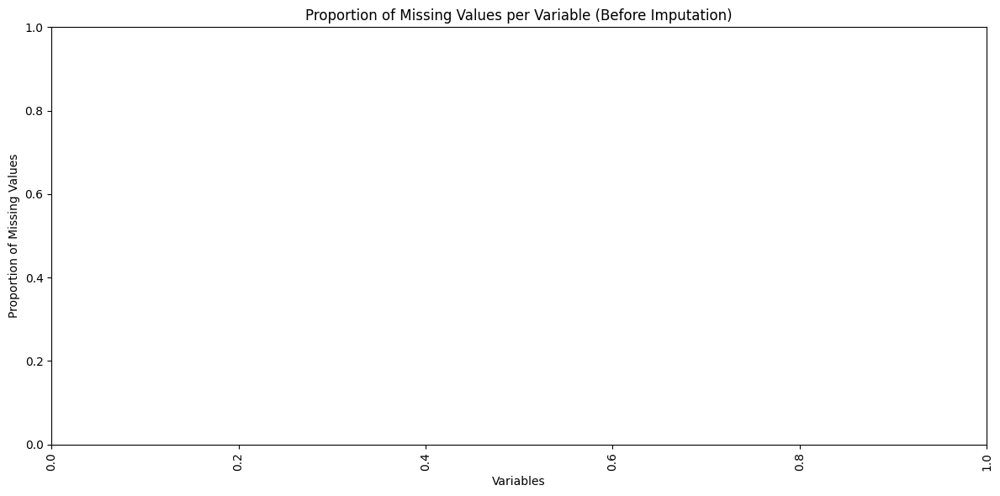

In [ ]:
# prompt: afficher un graphique avec la proportion des valeurs manquantes par variables en axe des x je veux le nom des variables et en ordonnée les proportions

import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the proportion of missing values for each column *before* dropping columns
initial_missing_proportion = df.isnull().sum() / len(df)
initial_missing_proportion = initial_missing_proportion[initial_missing_proportion > 0] # Keep only columns with missing values

# Create the bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x=initial_missing_proportion.index, y=initial_missing_proportion.values, palette="viridis")
plt.xticks(rotation=90) # Rotate x-axis labels for better readability
plt.xlabel("Variables")
plt.ylabel("Proportion of Missing Values")
plt.title("Proportion of Missing Values per Variable (Before Imputation)")
plt.tight_layout() # Adjust layout to prevent labels overlapping
plt.show()

In [ ]:
# prompt: détermine pour toute sles variables quantitative la présence des valeurs aberrantes avec la méthode IQR et la méthode zscore

import numpy as np
# Method 1: IQR (Interquartile Range)
def find_outliers_iqr(df, col):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    return outliers

# Method 2: Z-score
def find_outliers_zscore(df, col, threshold=3):
    z_scores = np.abs((df[col] - df[col].mean()) / df[col].std())
    outliers = df[z_scores > threshold]
    return outliers

# Identify quantitative columns again after imputation
quantitative_cols = df.select_dtypes(include=['int64', 'float64']).columns

print("Outlier detection using IQR method:")
for col in quantitative_cols:
    outliers_iqr = find_outliers_iqr(df, col)
    print(f"Column '{col}': {len(outliers_iqr)} outliers found")
    # Optional: print the outliers themselves
    # print(outliers_iqr[[col]])

print("\nOutlier detection using Z-score method:")
for col in quantitative_cols:
    outliers_zscore = find_outliers_zscore(df, col)
    print(f"Column '{col}': {len(outliers_zscore)} outliers found")
    # Optional: print the outliers themselves
    # print(outliers_zscore[[col]])

Outlier detection using IQR method:
Column 'Id': 0 outliers found
Column 'MSSubClass': 103 outliers found
Column 'LotArea': 69 outliers found
Column 'OverallQual': 2 outliers found
Column 'OverallCond': 125 outliers found
Column 'YearBuilt': 7 outliers found
Column 'YearRemodAdd': 0 outliers found
Column 'MasVnrArea': 98 outliers found
Column 'BsmtFinSF1': 7 outliers found
Column 'BsmtFinSF2': 167 outliers found
Column 'BsmtUnfSF': 29 outliers found
Column 'TotalBsmtSF': 61 outliers found
Column '1stFlrSF': 20 outliers found
Column '2ndFlrSF': 2 outliers found
Column 'LowQualFinSF': 26 outliers found
Column 'GrLivArea': 31 outliers found
Column 'BsmtFullBath': 1 outliers found
Column 'BsmtHalfBath': 82 outliers found
Column 'FullBath': 0 outliers found
Column 'HalfBath': 0 outliers found
Column 'BedroomAbvGr': 35 outliers found
Column 'KitchenAbvGr': 68 outliers found
Column 'TotRmsAbvGrd': 30 outliers found
Column 'Fireplaces': 5 outliers found
Column 'GarageYrBlt': 1 outliers found
C

# Etape 3: Analyse exploratoire des données


Quantitative Variable Characteristics:
                        Mean    Median      Mode  Standard Deviation  \
Id                730.500000     730.5       1.0          421.610009   
MSSubClass         56.897260      50.0      20.0           42.300571   
LotArea         10516.828082    9478.5    7200.0         9981.264932   
OverallQual         6.099315       6.0       5.0            1.382997   
OverallCond         5.575342       5.0       5.0            1.112799   
YearBuilt        1971.267808    1973.0    2006.0           30.202904   
YearRemodAdd     1984.865753    1994.0    1950.0           20.645407   
MasVnrArea        103.117123       0.0       0.0          180.731373   
BsmtFinSF1        443.639726     383.5       0.0          456.098091   
BsmtFinSF2         46.549315       0.0       0.0          161.319273   
BsmtUnfSF         567.240411     477.5       0.0          441.866955   
TotalBsmtSF      1057.429452     991.5       0.0          438.705324   
1stFlrSF         1162.62

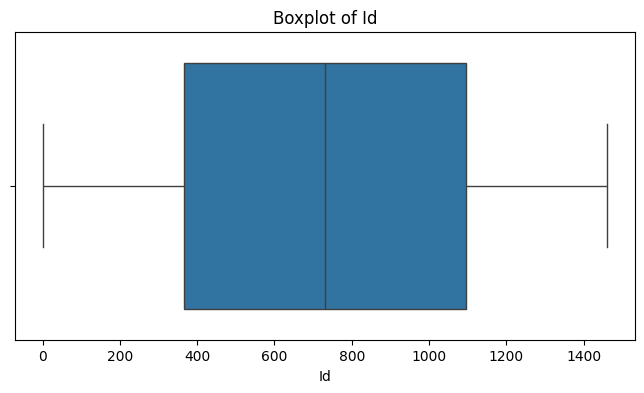

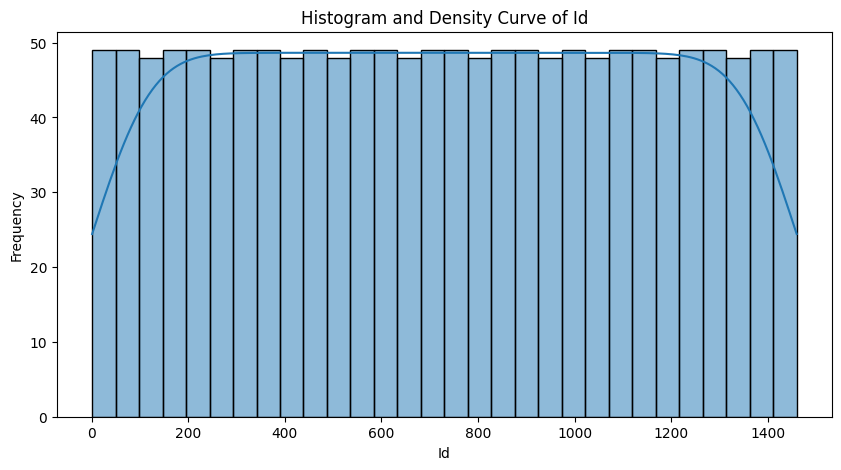

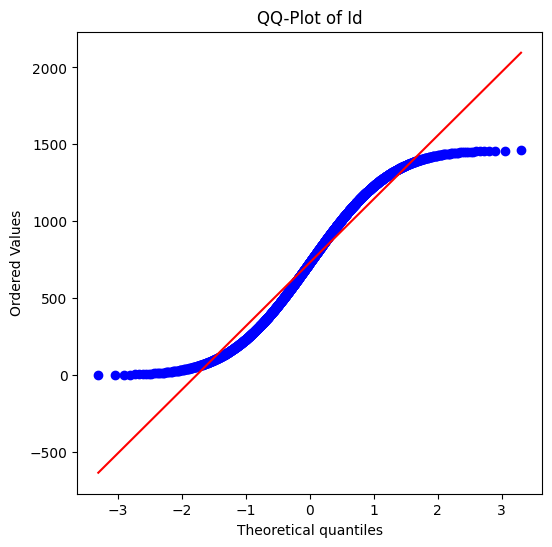

Shapiro-Wilk Test for Id:
Statistic: 0.9548, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for Id:
Statistic: 1134.2059, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: MSSubClass ---


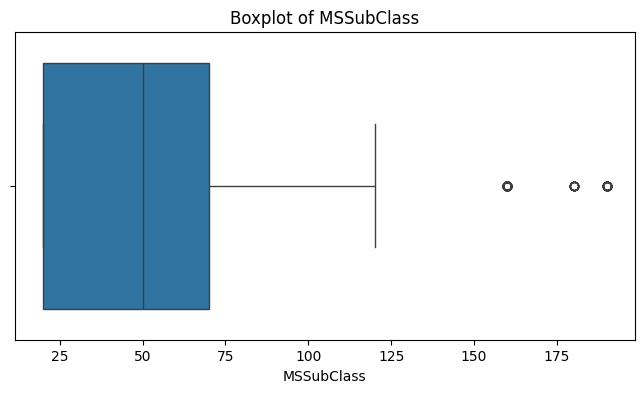

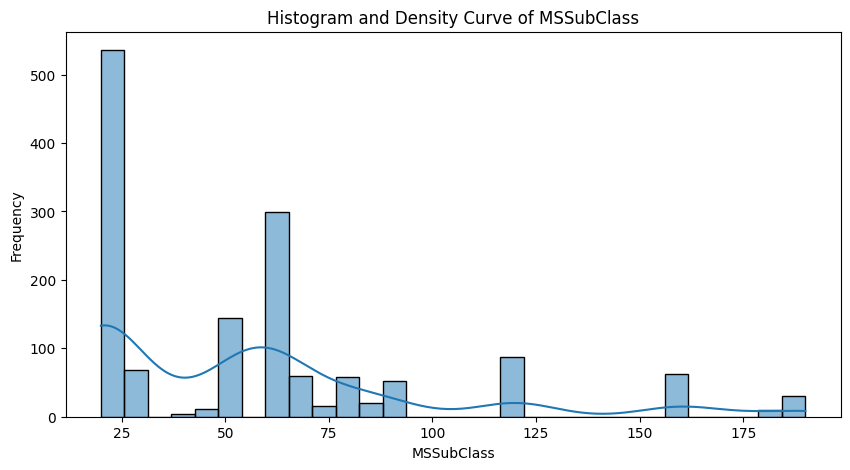

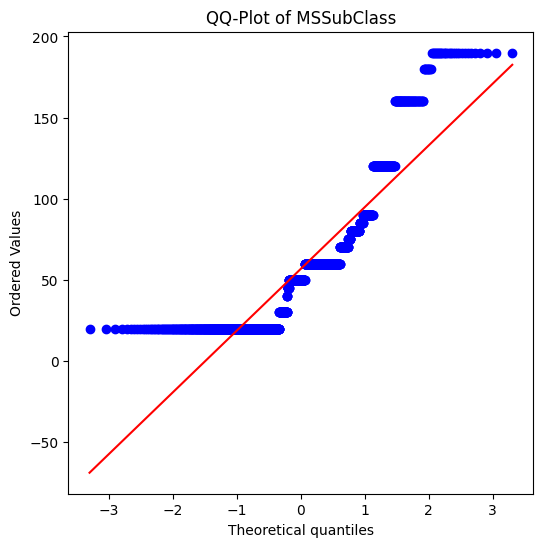

Shapiro-Wilk Test for MSSubClass:
Statistic: 0.8046, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for MSSubClass:
Statistic: 337.1866, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: LotArea ---


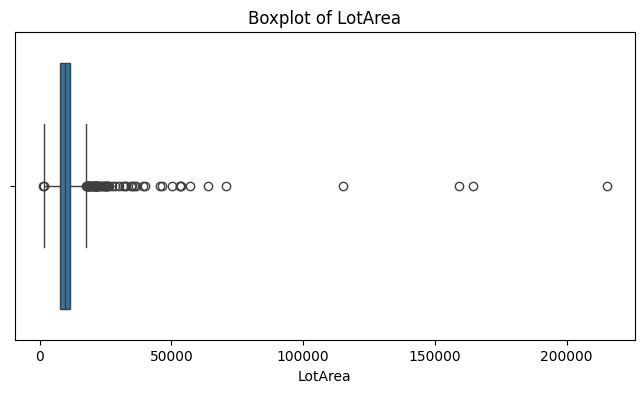

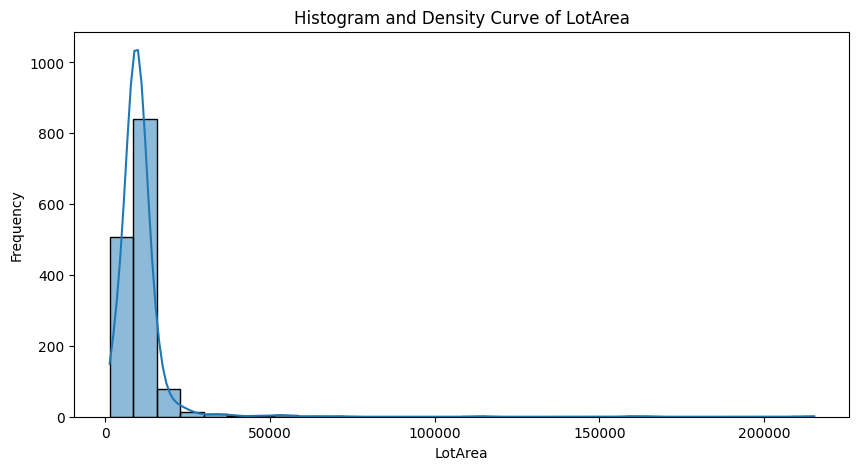

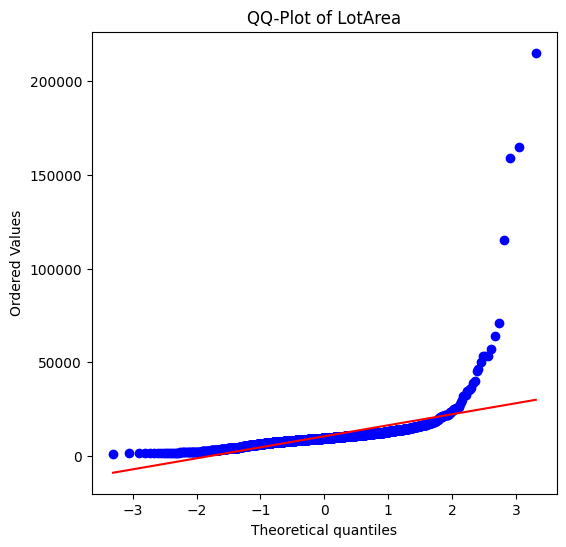

Shapiro-Wilk Test for LotArea:
Statistic: 0.3511, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for LotArea:
Statistic: 2590.5919, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: OverallQual ---


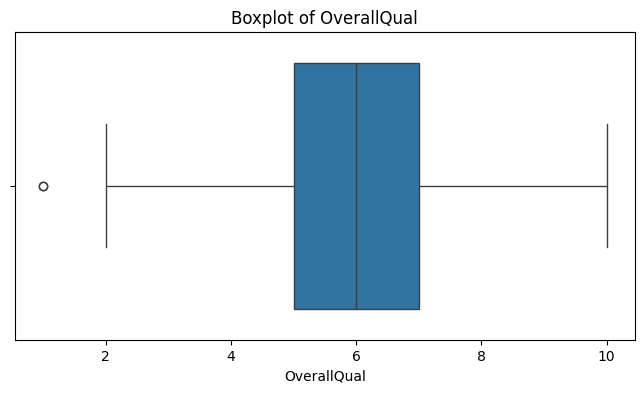

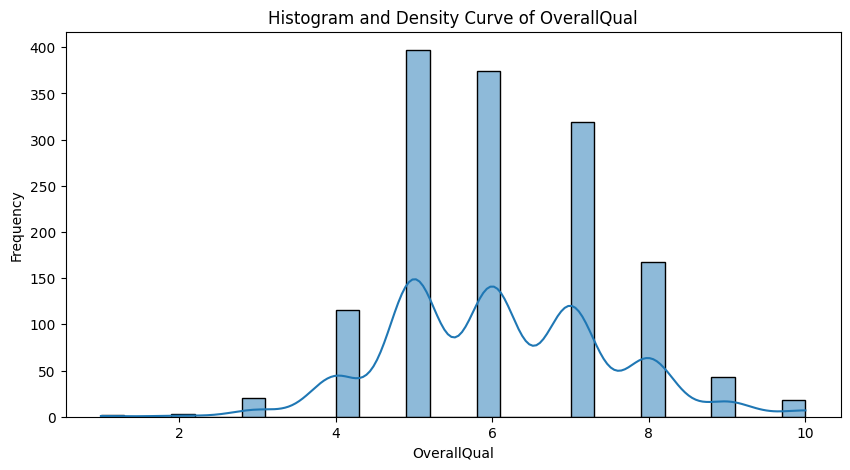

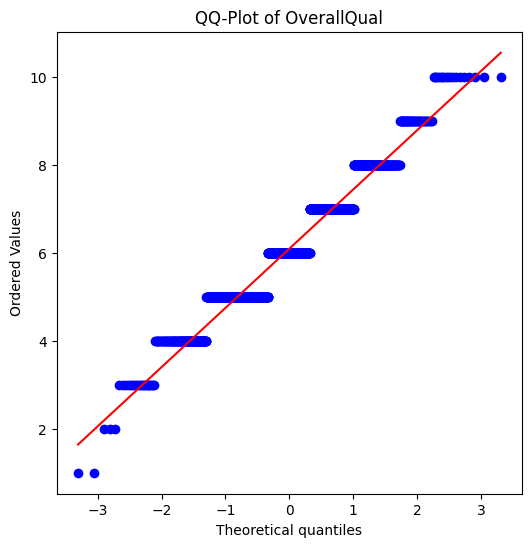

Shapiro-Wilk Test for OverallQual:
Statistic: 0.9480, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for OverallQual:
Statistic: 11.9046, p-value: 0.0026
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: OverallCond ---


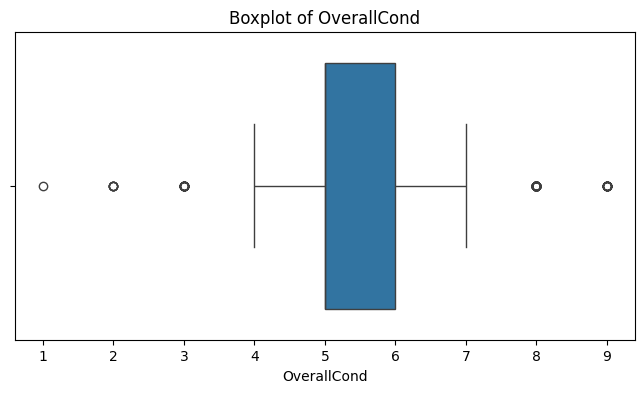

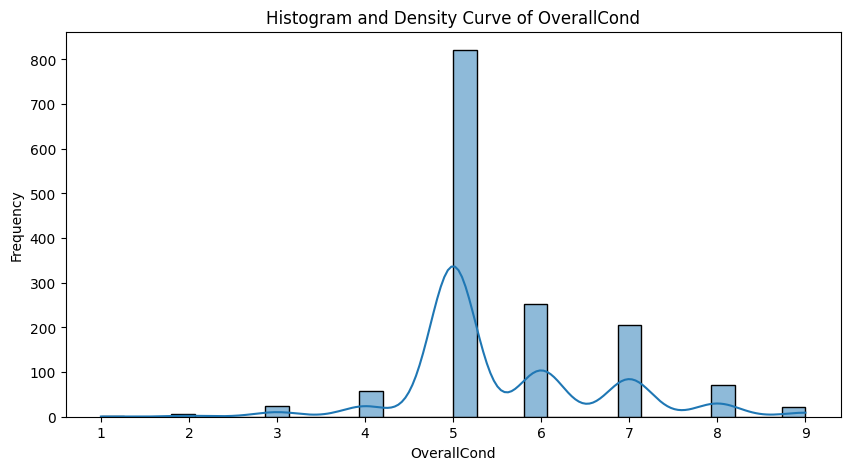

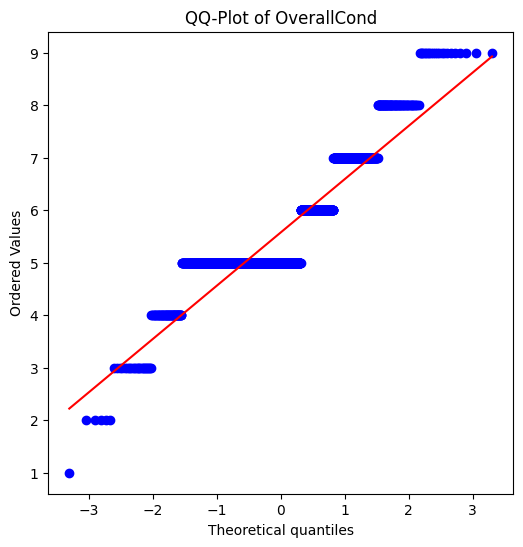

Shapiro-Wilk Test for OverallCond:
Statistic: 0.8289, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for OverallCond:
Statistic: 131.2918, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: YearBuilt ---


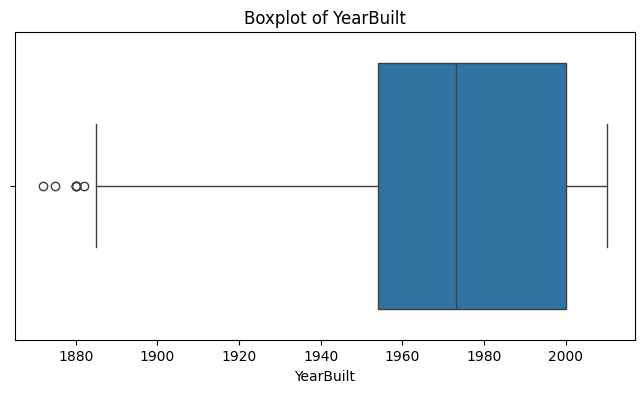

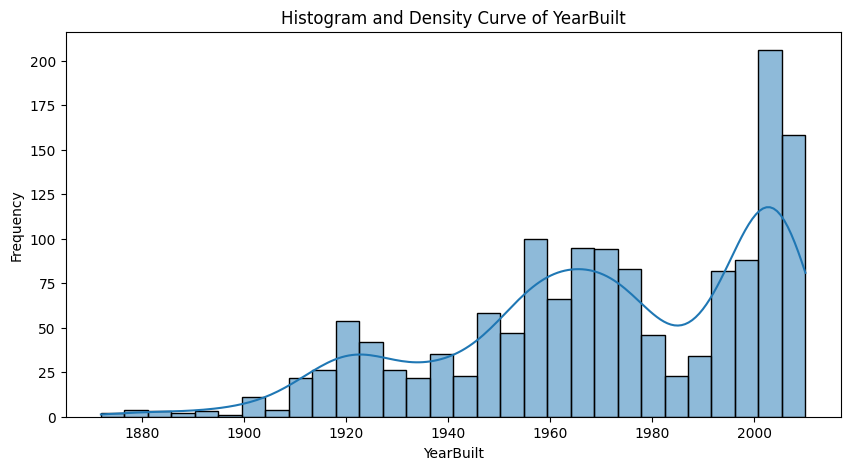

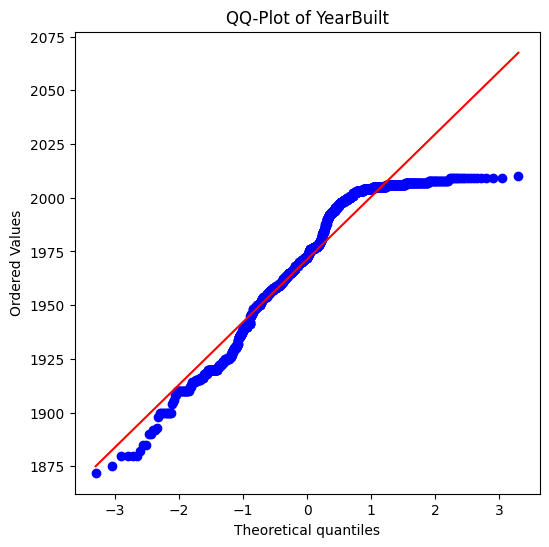

Shapiro-Wilk Test for YearBuilt:
Statistic: 0.9256, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for YearBuilt:
Statistic: 98.3320, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: YearRemodAdd ---


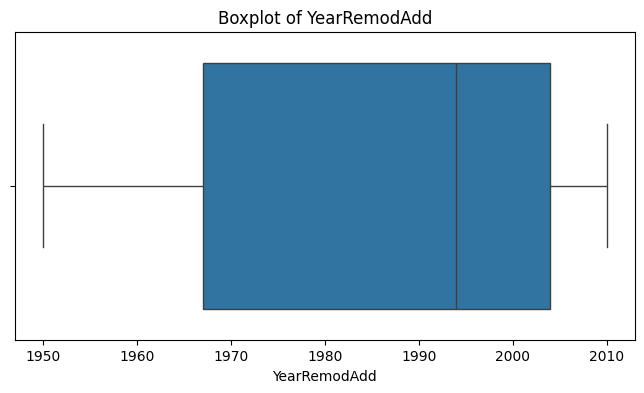

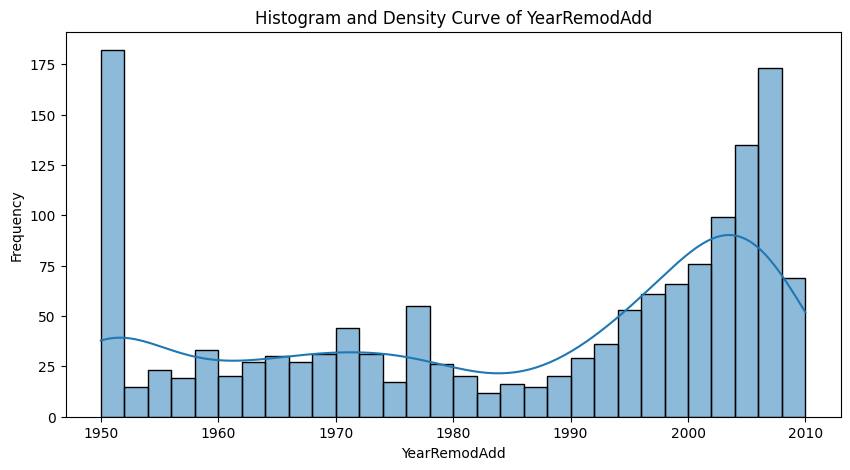

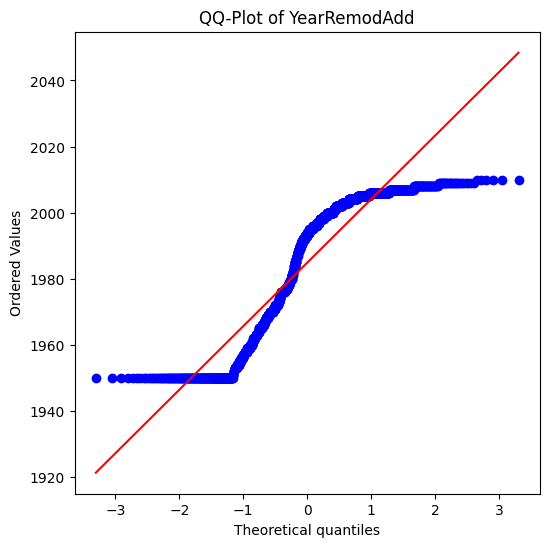

Shapiro-Wilk Test for YearRemodAdd:
Statistic: 0.8628, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for YearRemodAdd:
Statistic: 2431.4936, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: MasVnrArea ---


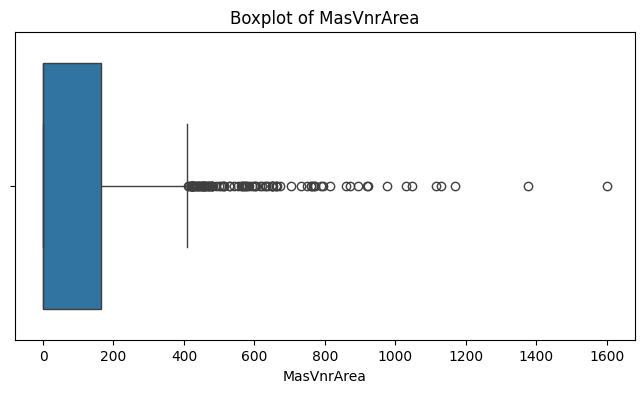

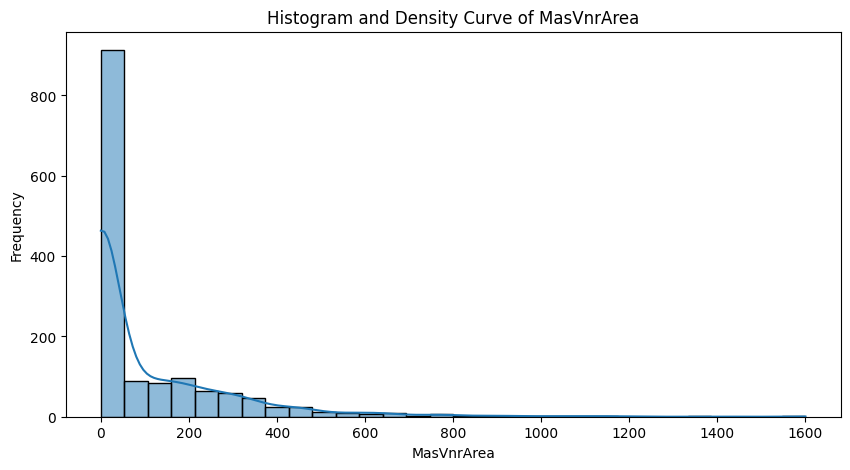

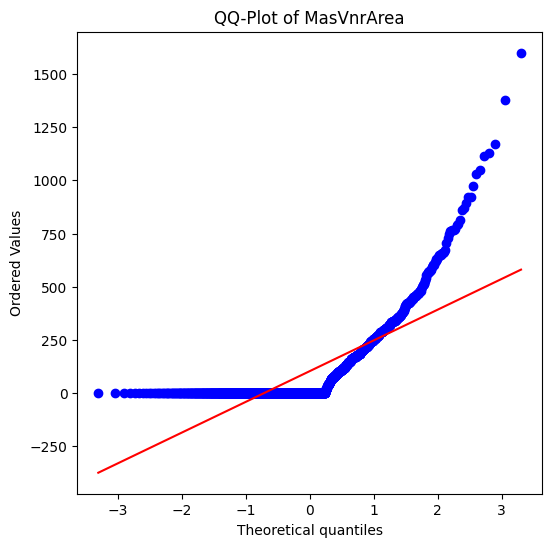

Shapiro-Wilk Test for MasVnrArea:
Statistic: 0.6376, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for MasVnrArea:
Statistic: 865.1344, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: BsmtFinSF1 ---


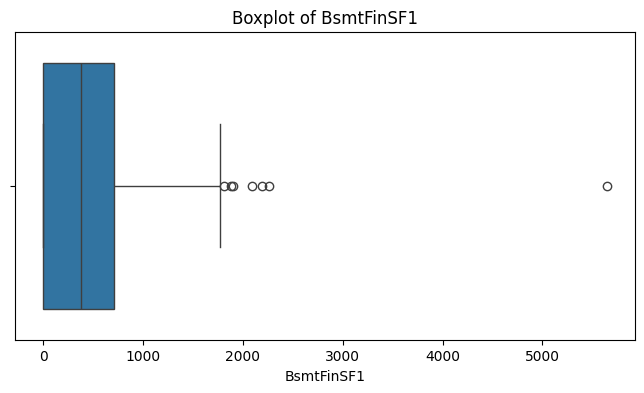

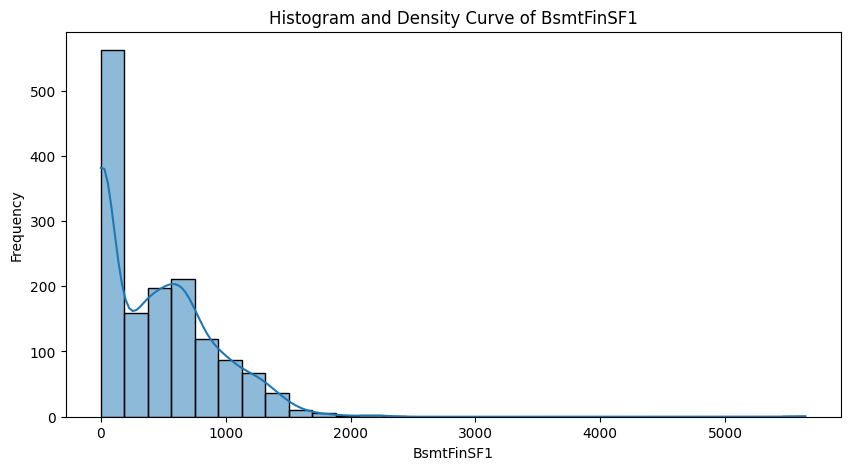

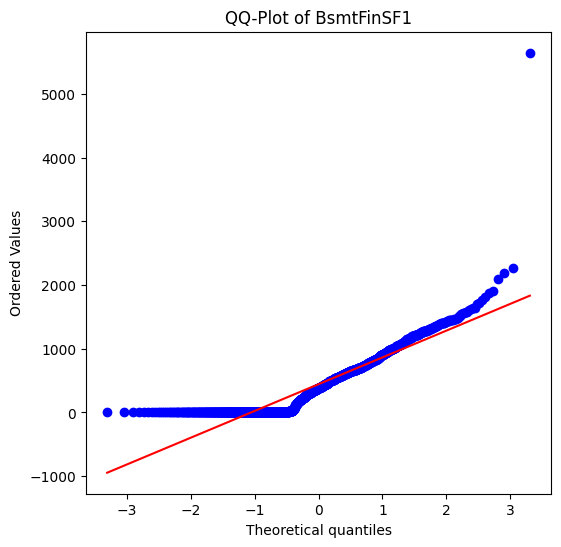

Shapiro-Wilk Test for BsmtFinSF1:
Statistic: 0.8480, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for BsmtFinSF1:
Statistic: 638.2866, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: BsmtFinSF2 ---


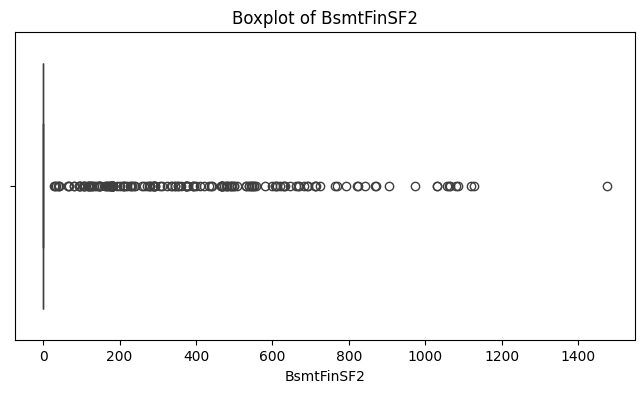

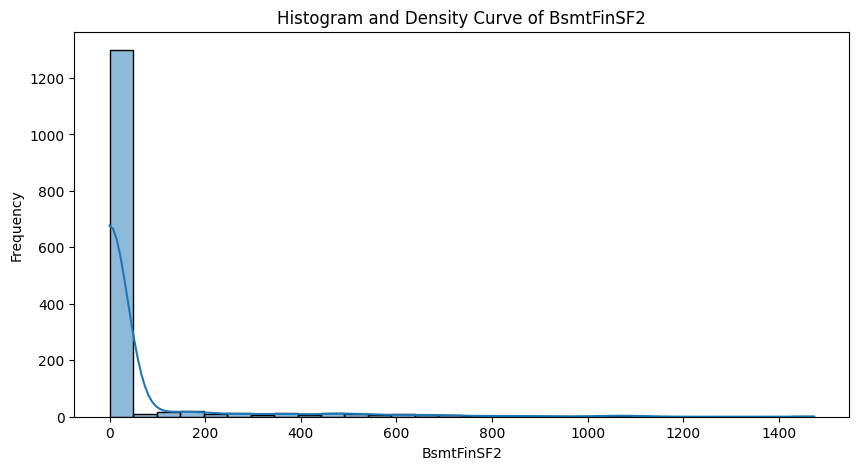

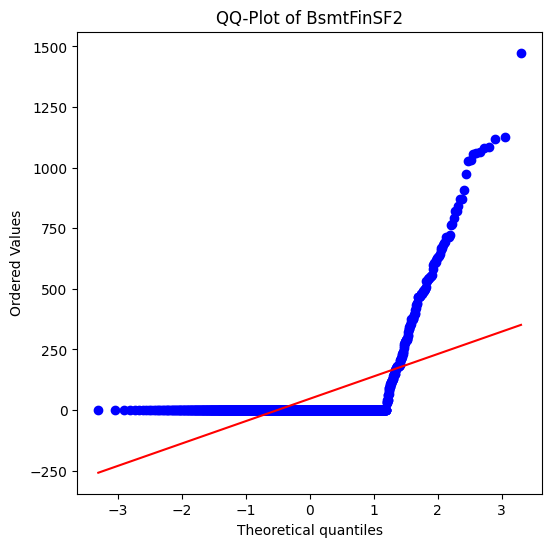

Shapiro-Wilk Test for BsmtFinSF2:
Statistic: 0.3273, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for BsmtFinSF2:
Statistic: 1287.4437, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: BsmtUnfSF ---


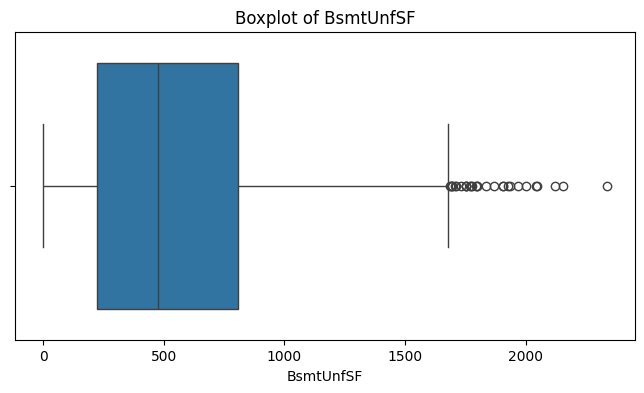

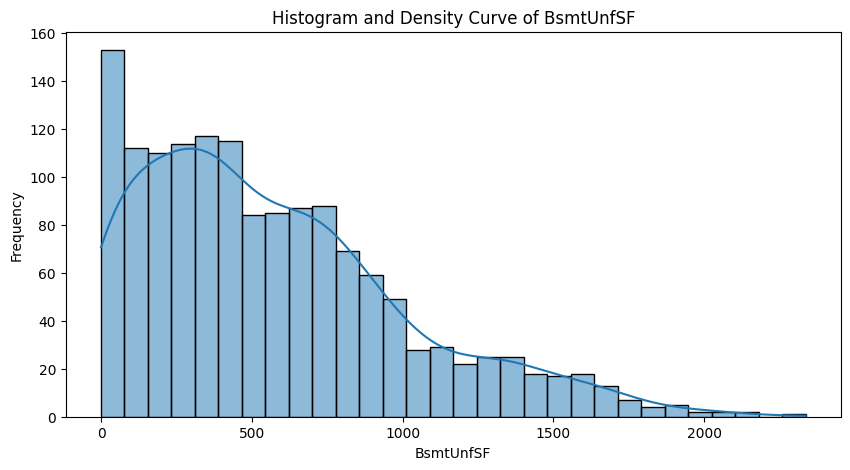

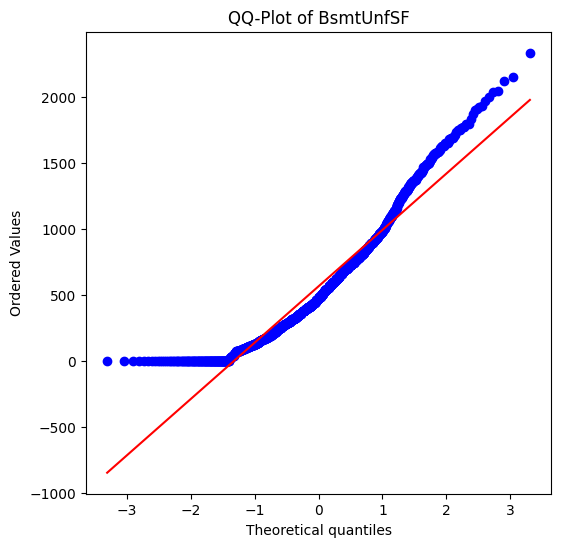

Shapiro-Wilk Test for BsmtUnfSF:
Statistic: 0.9304, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for BsmtUnfSF:
Statistic: 163.6465, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: TotalBsmtSF ---


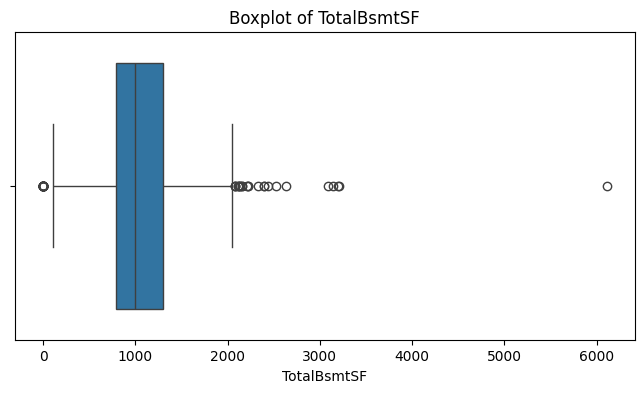

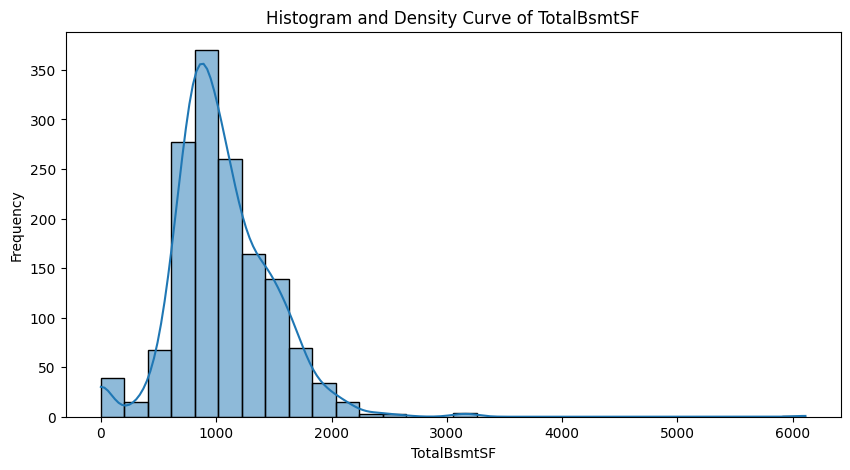

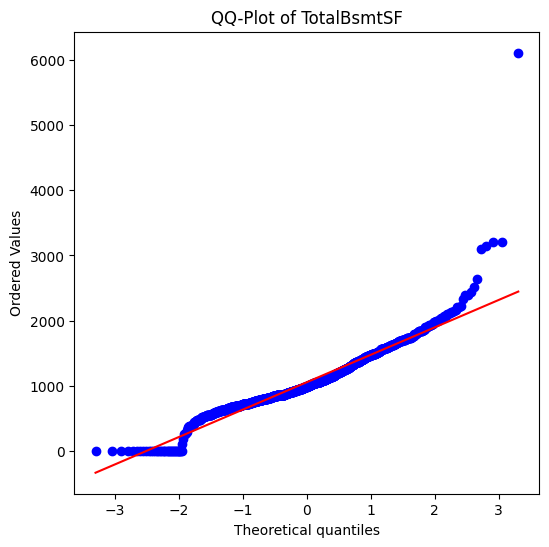

Shapiro-Wilk Test for TotalBsmtSF:
Statistic: 0.9174, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for TotalBsmtSF:
Statistic: 622.8951, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: 1stFlrSF ---


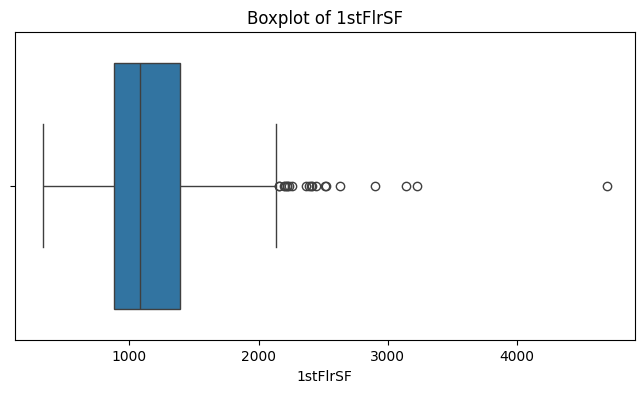

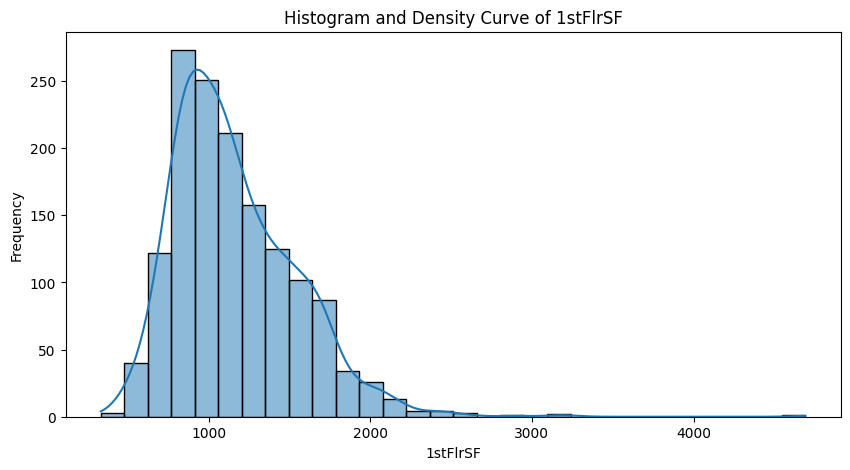

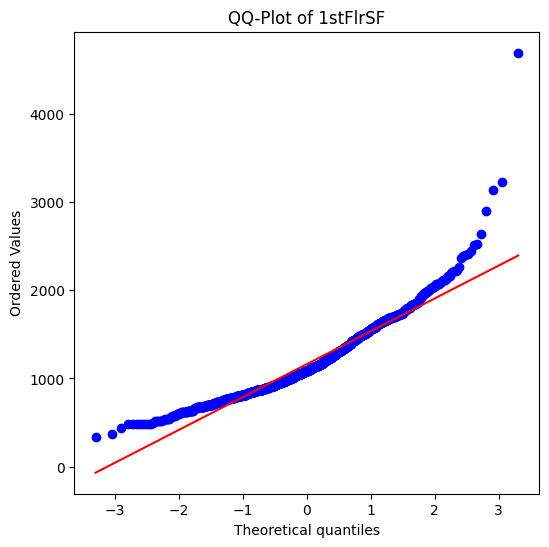

Shapiro-Wilk Test for 1stFlrSF:
Statistic: 0.9269, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for 1stFlrSF:
Statistic: 461.0067, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: 2ndFlrSF ---


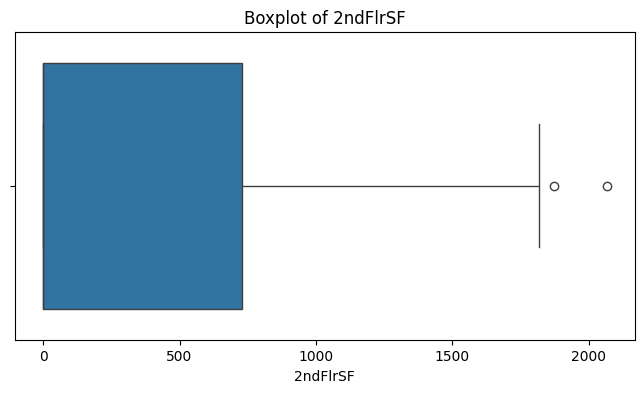

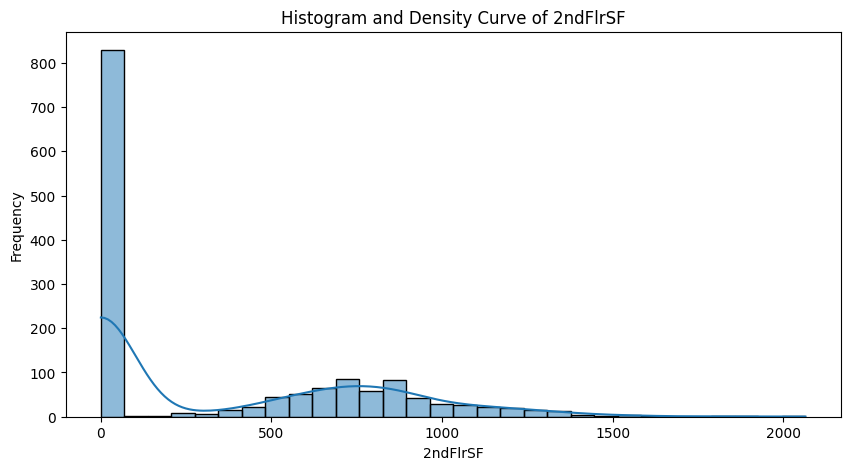

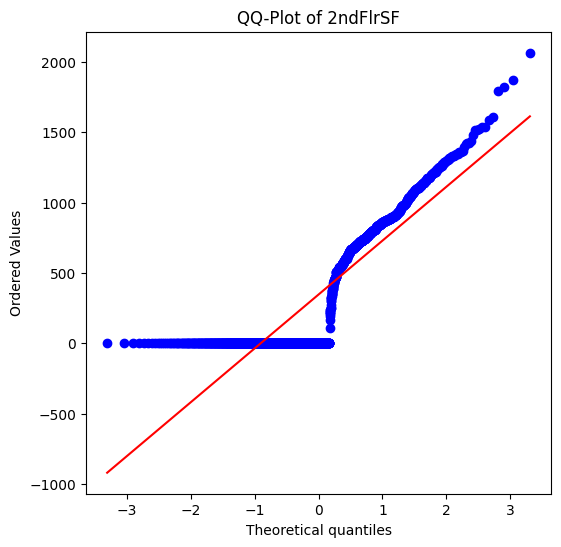

Shapiro-Wilk Test for 2ndFlrSF:
Statistic: 0.7668, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for 2ndFlrSF:
Statistic: 163.1424, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: LowQualFinSF ---


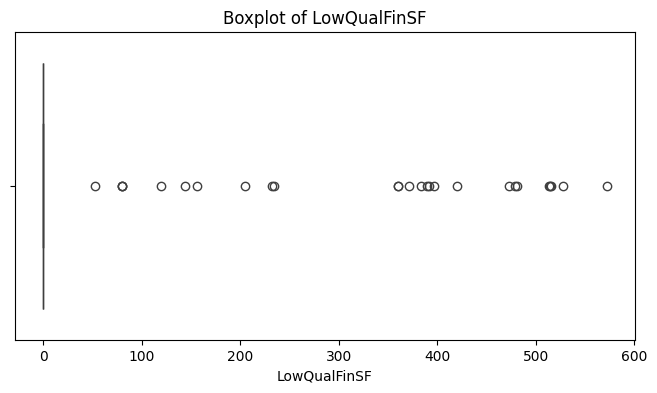

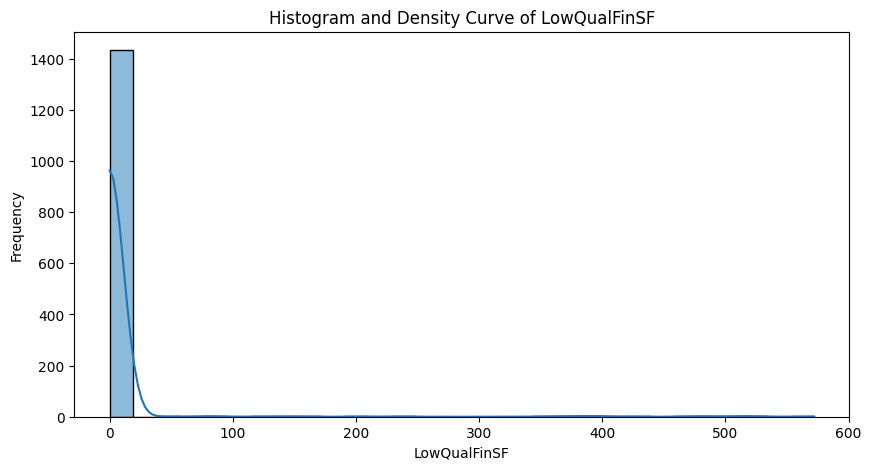

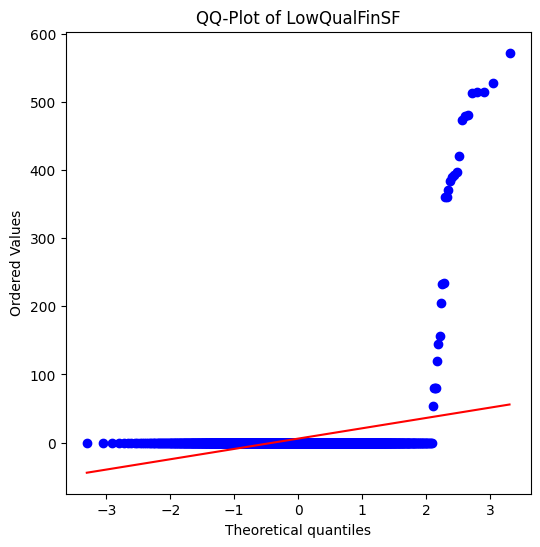

Shapiro-Wilk Test for LowQualFinSF:
Statistic: 0.0980, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for LowQualFinSF:
Statistic: 2161.4954, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: GrLivArea ---


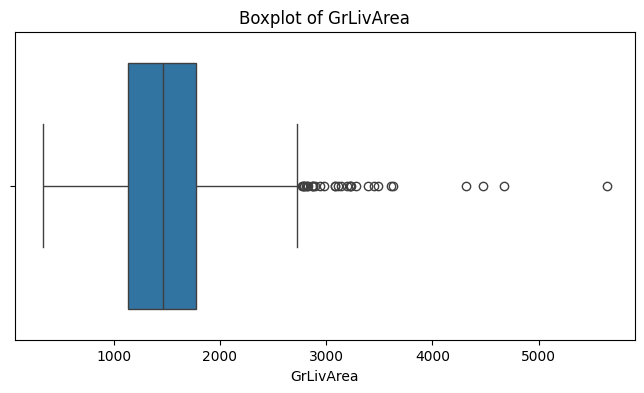

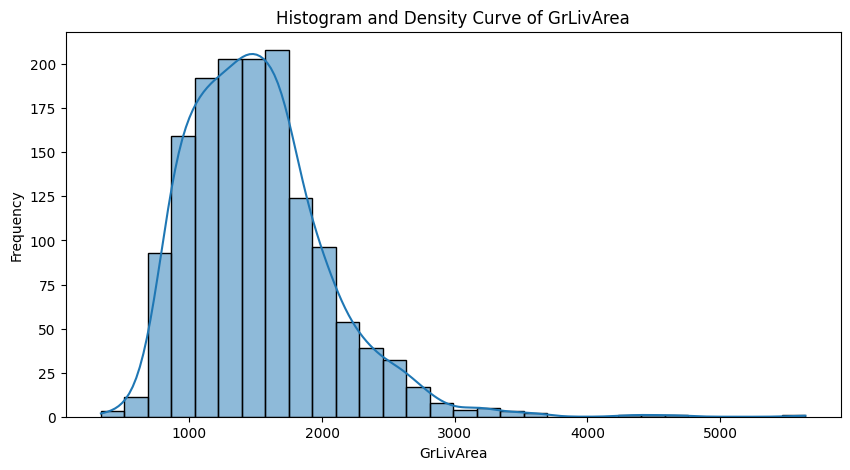

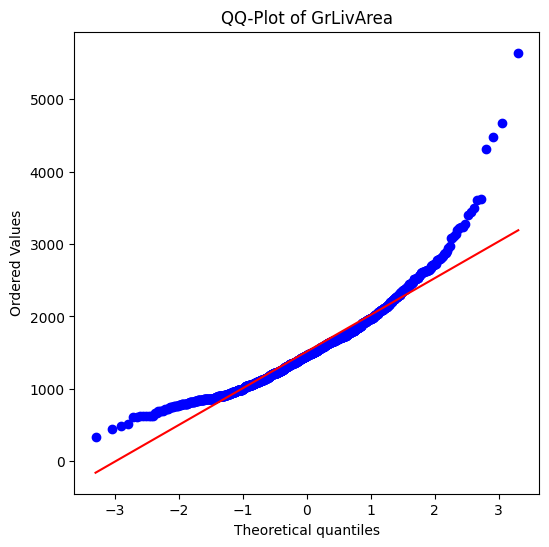

Shapiro-Wilk Test for GrLivArea:
Statistic: 0.9280, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for GrLivArea:
Statistic: 437.1203, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: BsmtFullBath ---


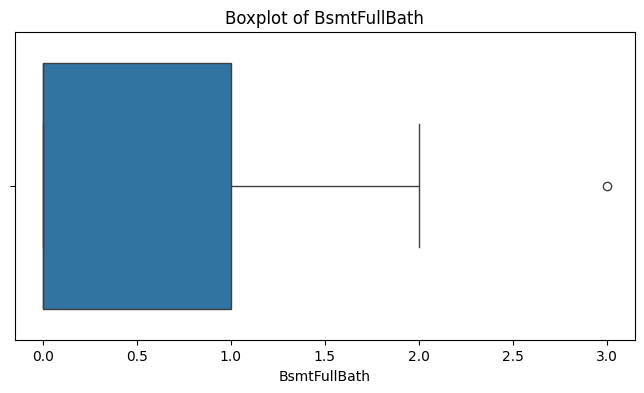

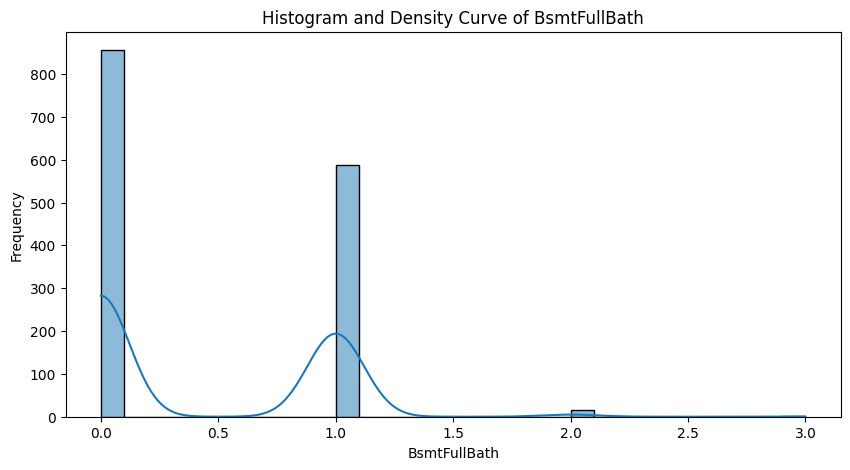

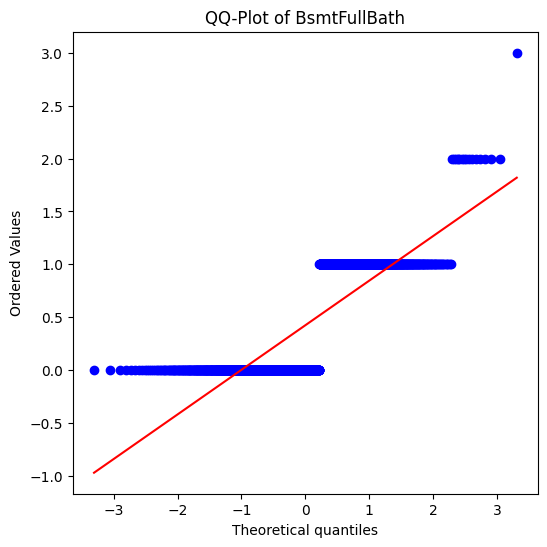

Shapiro-Wilk Test for BsmtFullBath:
Statistic: 0.6583, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for BsmtFullBath:
Statistic: 220.4964, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: BsmtHalfBath ---


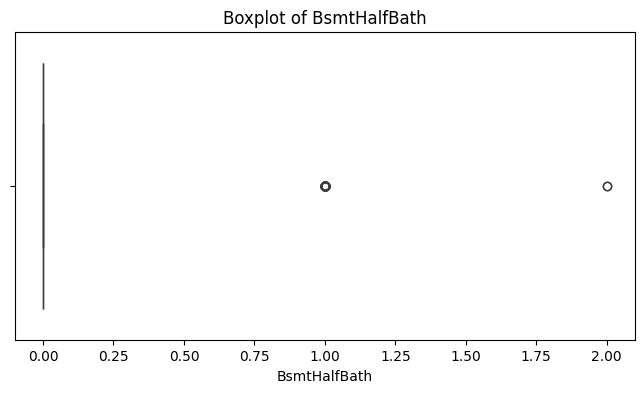

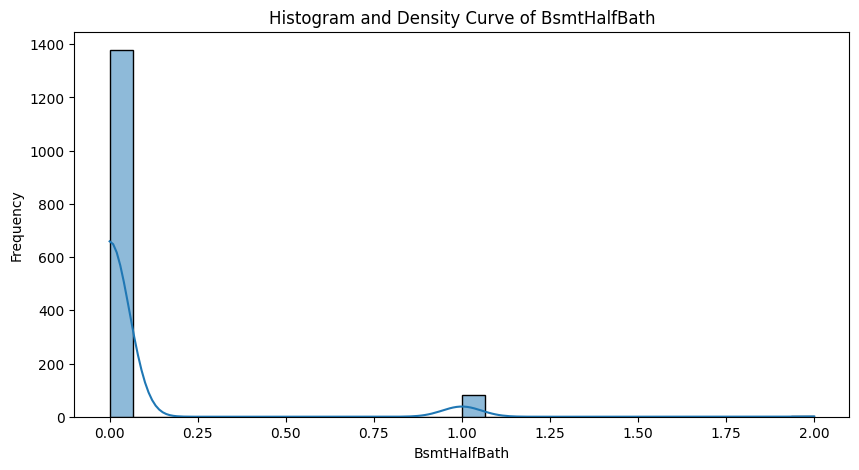

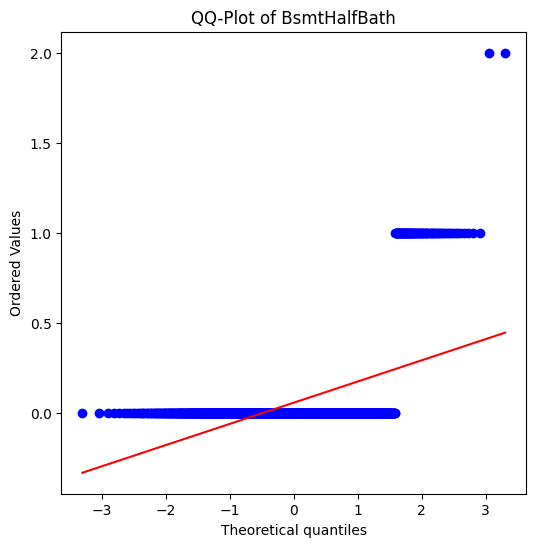

Shapiro-Wilk Test for BsmtHalfBath:
Statistic: 0.2429, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for BsmtHalfBath:
Statistic: 1228.3595, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: FullBath ---


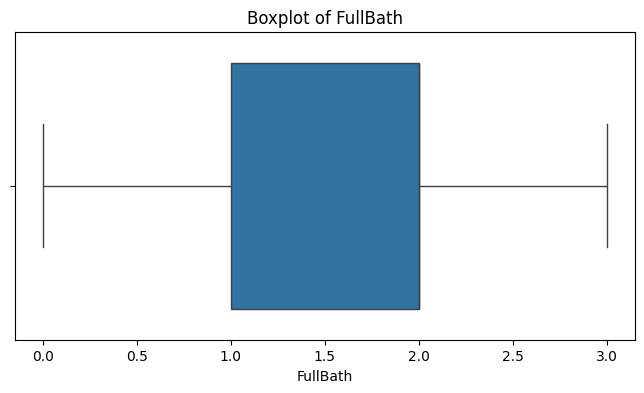

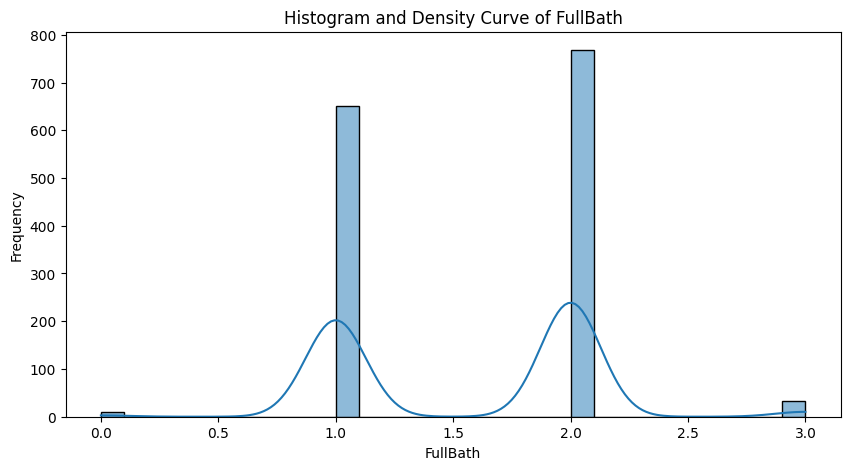

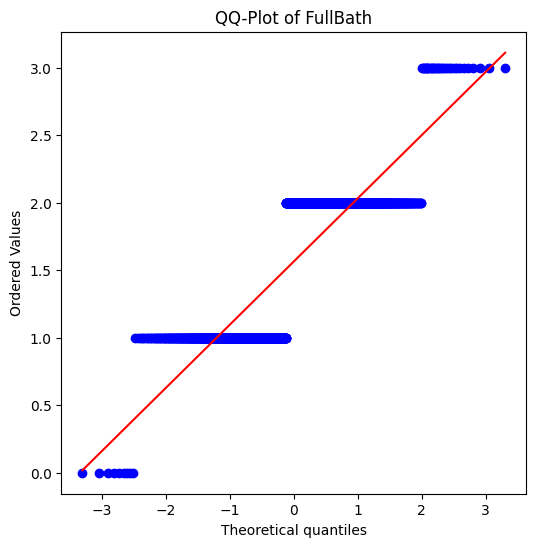

Shapiro-Wilk Test for FullBath:
Statistic: 0.7194, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for FullBath:
Statistic: 158.5427, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: HalfBath ---


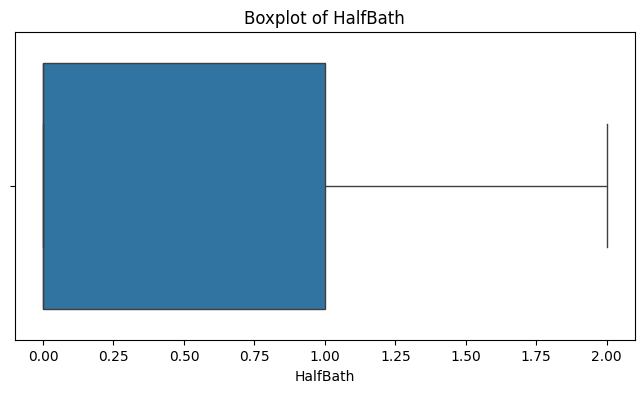

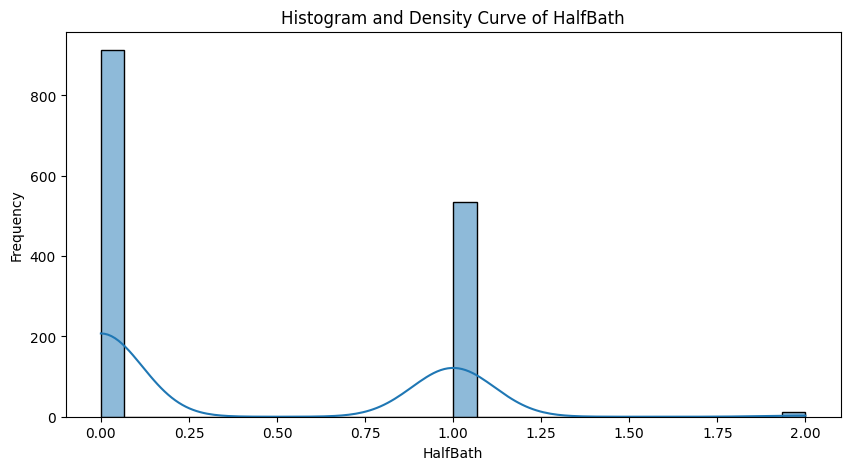

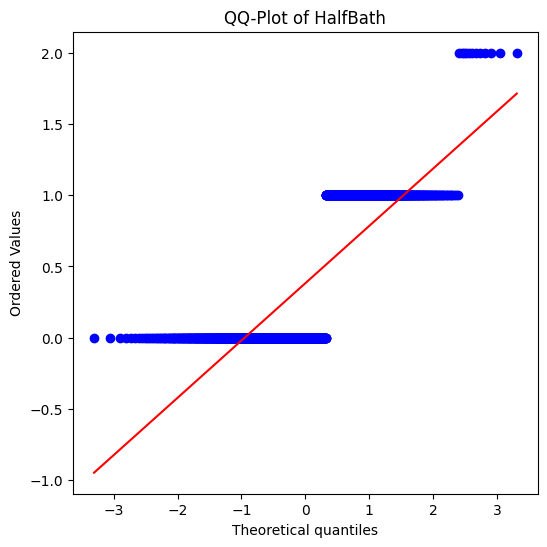

Shapiro-Wilk Test for HalfBath:
Statistic: 0.6380, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for HalfBath:
Statistic: 581.8311, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: BedroomAbvGr ---


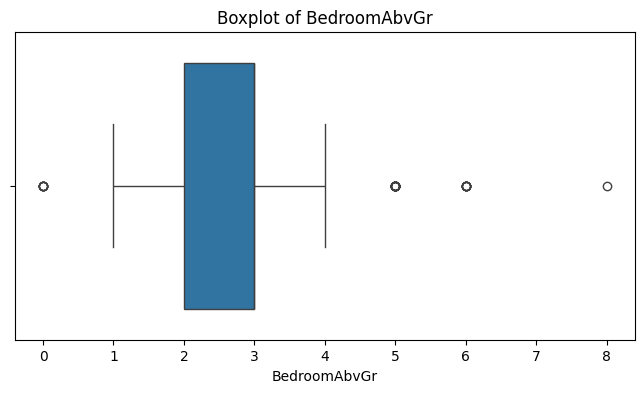

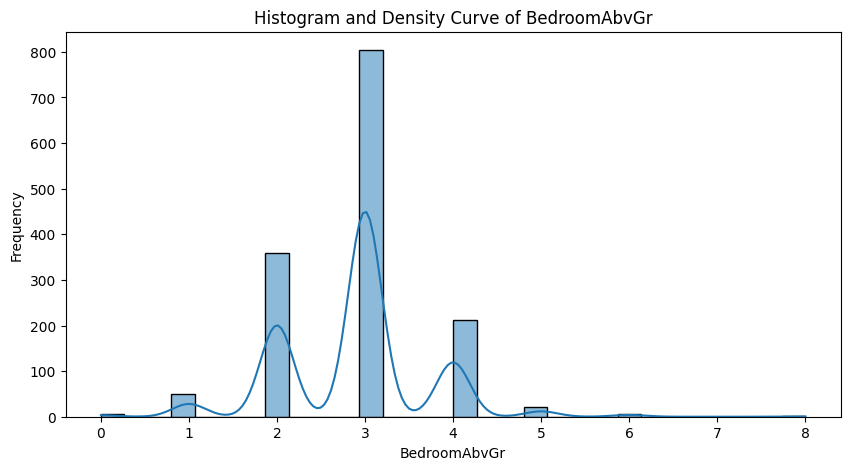

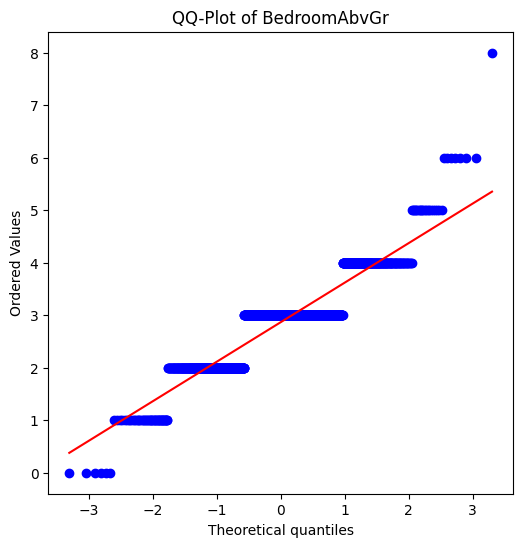

Shapiro-Wilk Test for BedroomAbvGr:
Statistic: 0.8498, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for BedroomAbvGr:
Statistic: 90.2897, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: KitchenAbvGr ---


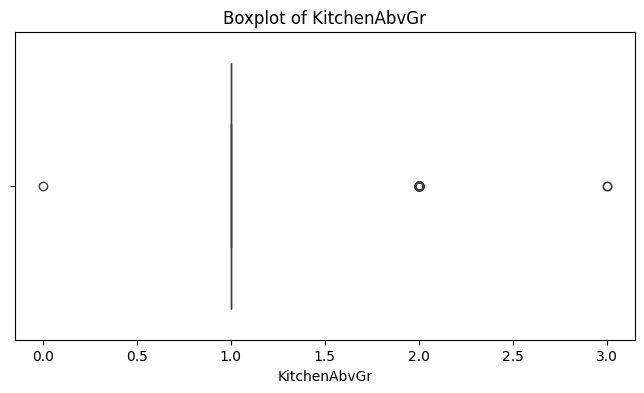

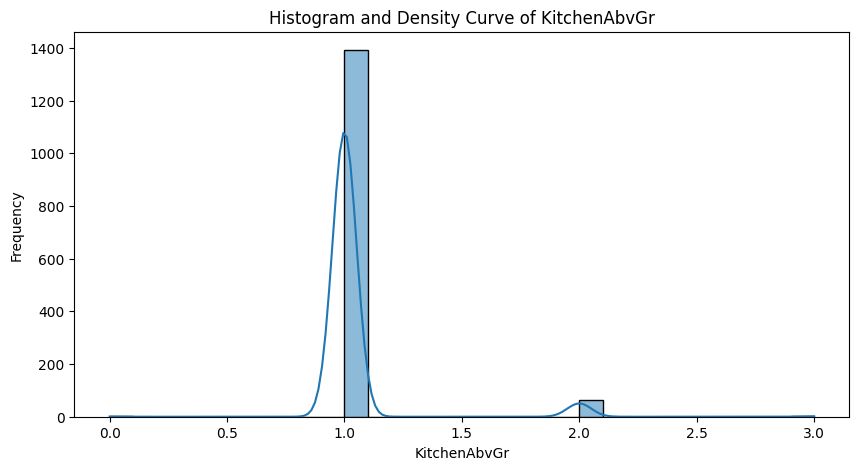

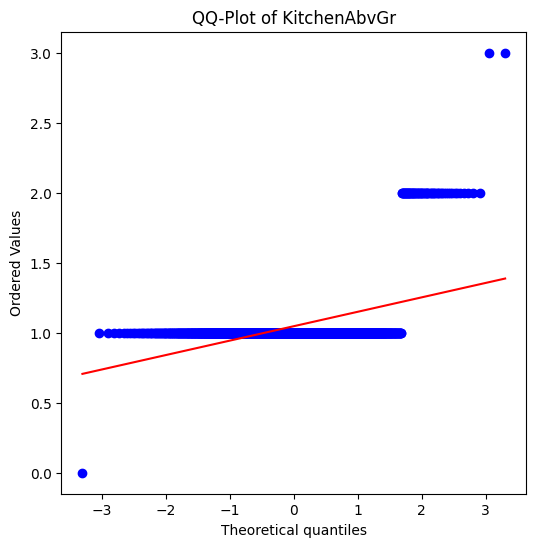

Shapiro-Wilk Test for KitchenAbvGr:
Statistic: 0.2198, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for KitchenAbvGr:
Statistic: 1339.2544, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: TotRmsAbvGrd ---


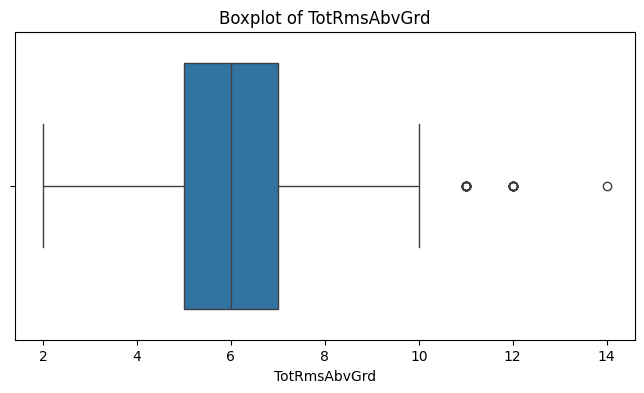

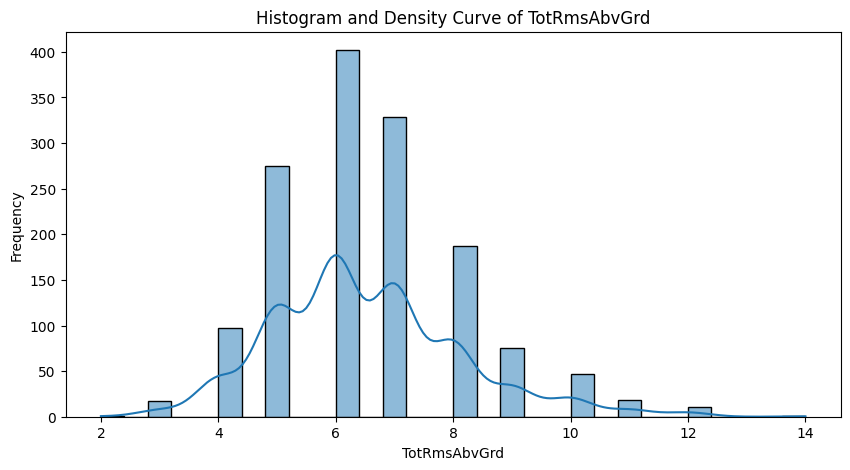

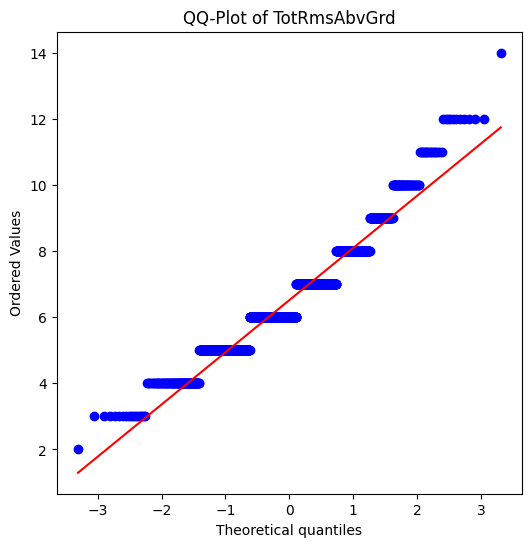

Shapiro-Wilk Test for TotRmsAbvGrd:
Statistic: 0.9423, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for TotRmsAbvGrd:
Statistic: 118.1385, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: Fireplaces ---


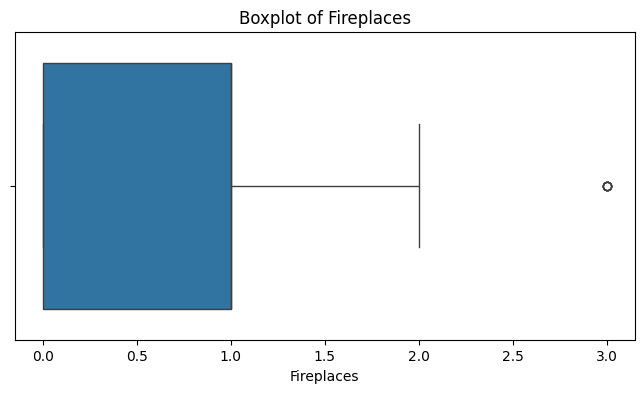

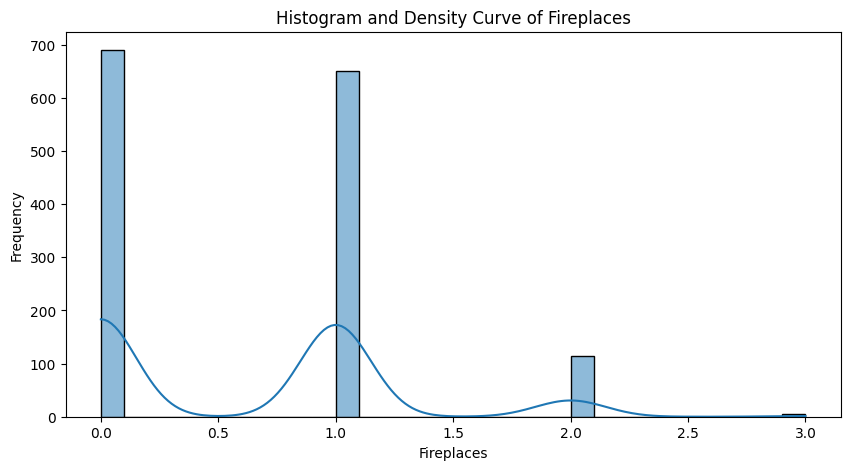

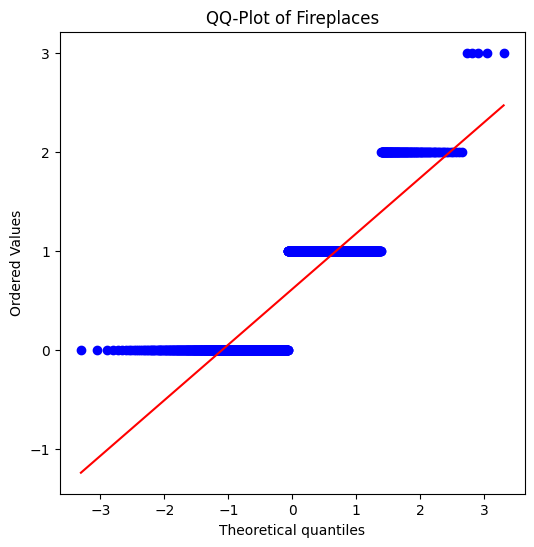

Shapiro-Wilk Test for Fireplaces:
Statistic: 0.7552, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for Fireplaces:
Statistic: 90.6096, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: GarageYrBlt ---


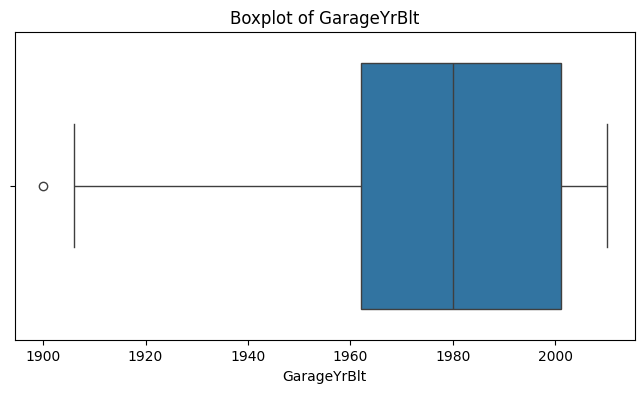

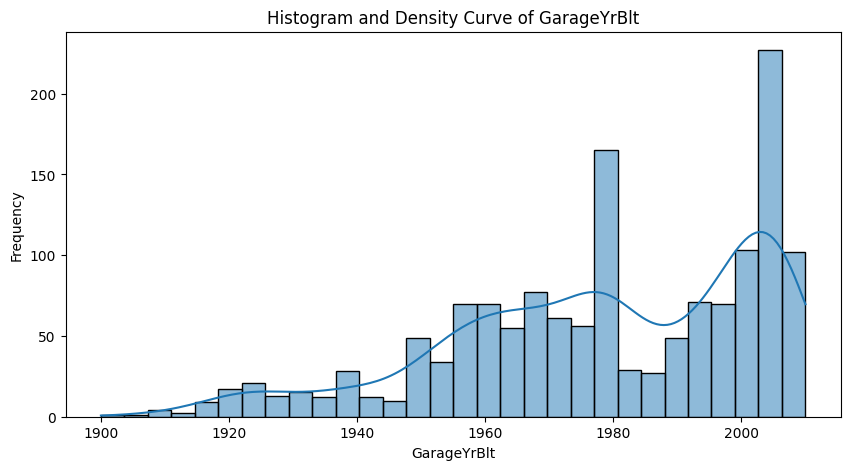

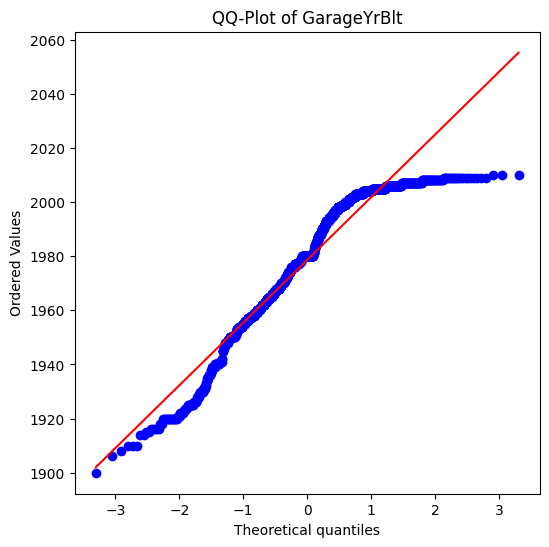

Shapiro-Wilk Test for GarageYrBlt:
Statistic: 0.9282, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for GarageYrBlt:
Statistic: 99.0036, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: GarageCars ---


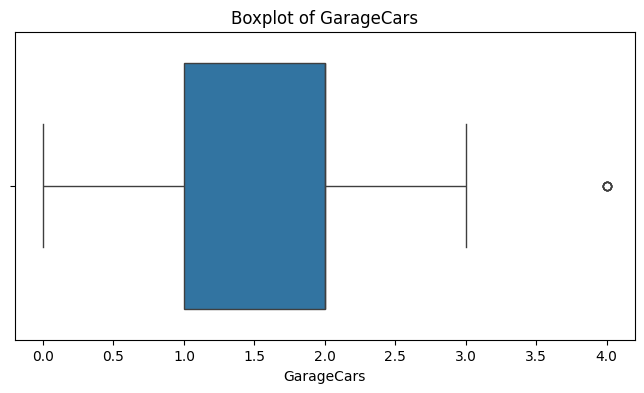

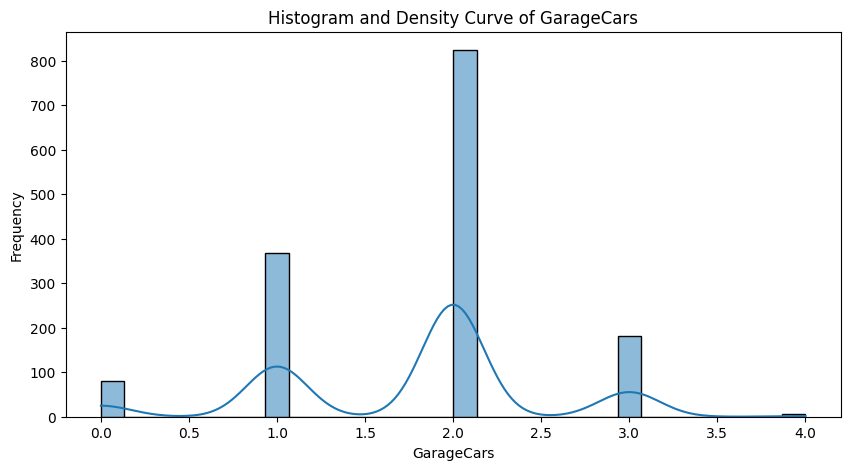

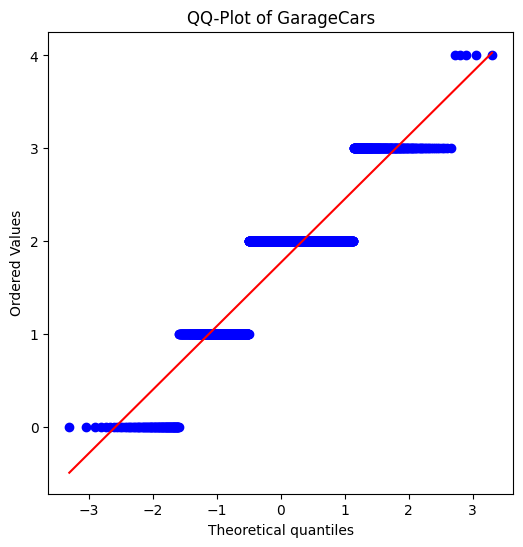

Shapiro-Wilk Test for GarageCars:
Statistic: 0.8354, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for GarageCars:
Statistic: 29.9253, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: GarageArea ---


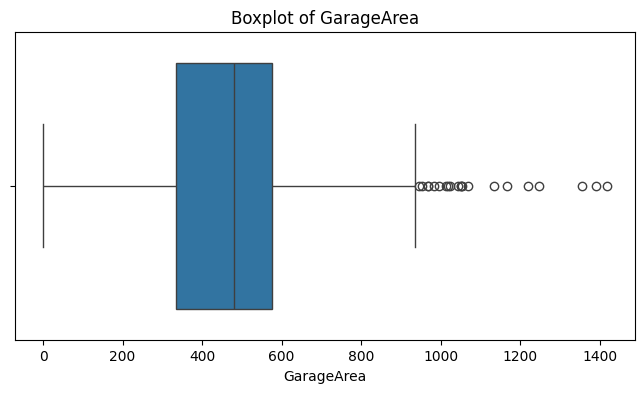

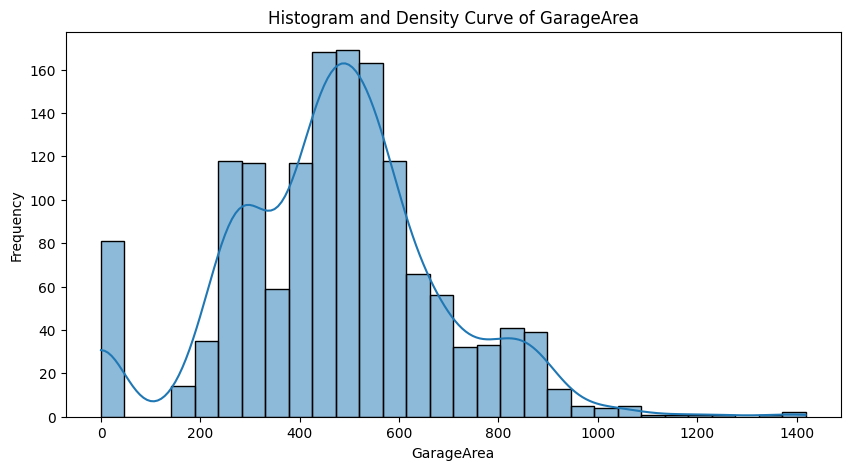

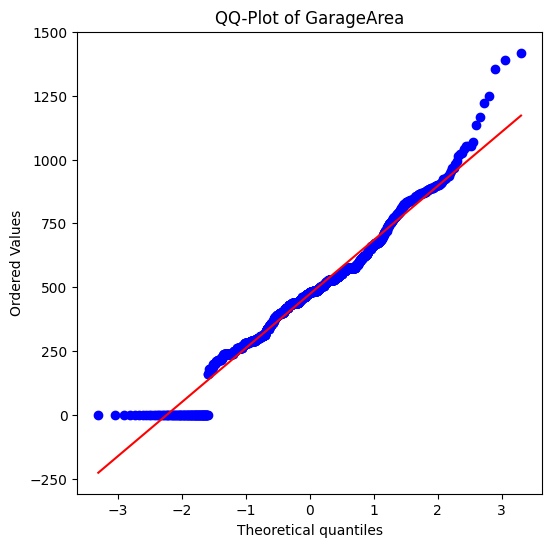

Shapiro-Wilk Test for GarageArea:
Statistic: 0.9753, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for GarageArea:
Statistic: 34.0414, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: WoodDeckSF ---


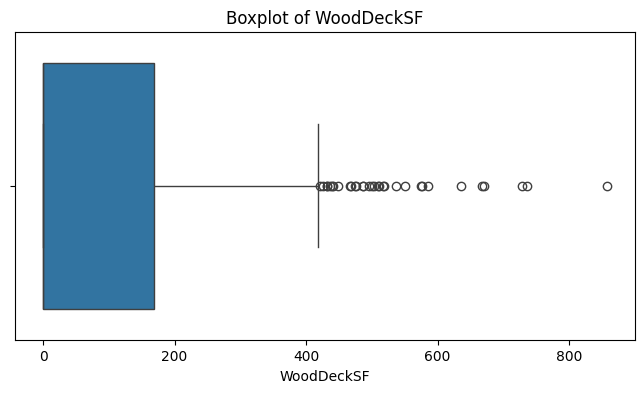

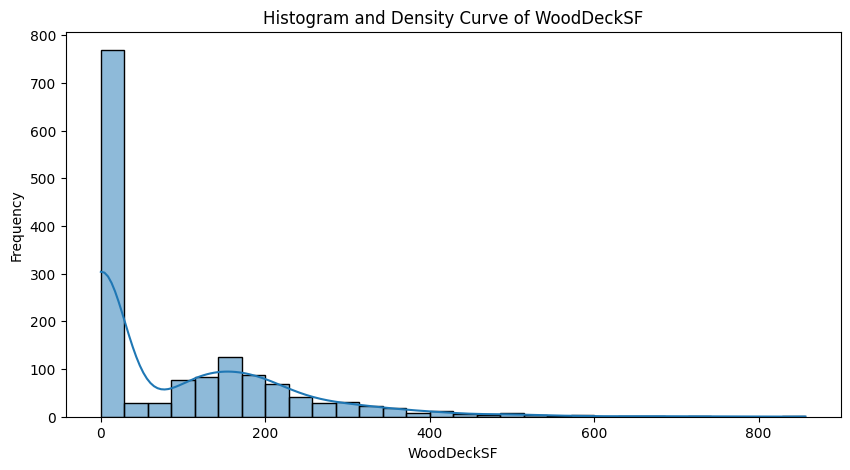

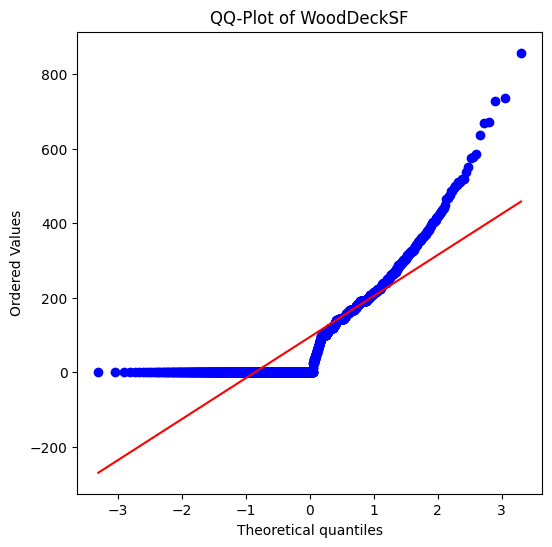

Shapiro-Wilk Test for WoodDeckSF:
Statistic: 0.7685, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for WoodDeckSF:
Statistic: 426.2672, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: OpenPorchSF ---


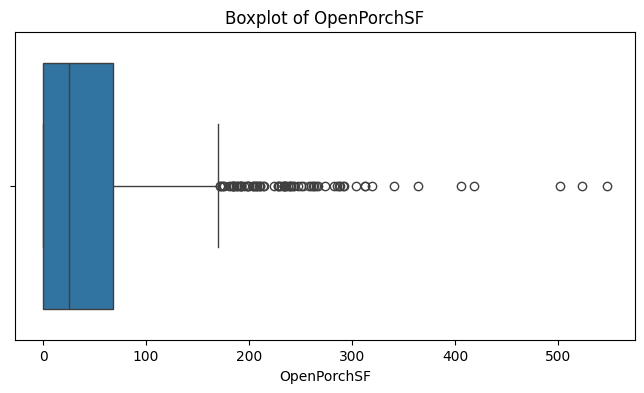

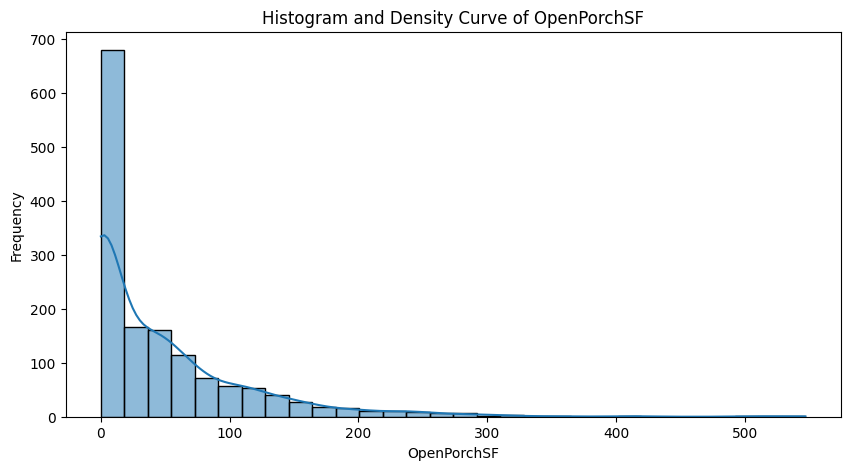

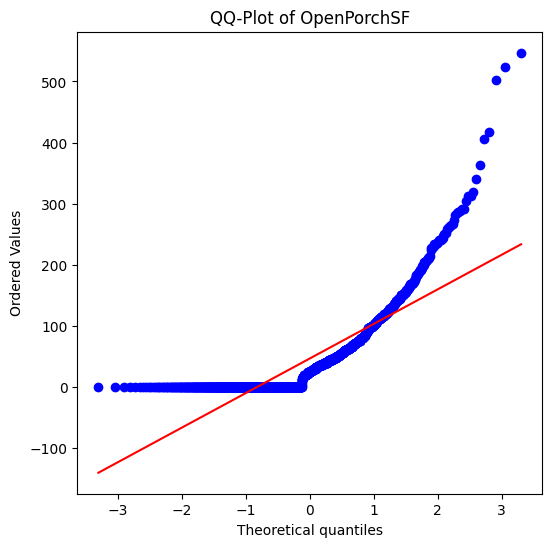

Shapiro-Wilk Test for OpenPorchSF:
Statistic: 0.7272, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for OpenPorchSF:
Statistic: 766.3708, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: EnclosedPorch ---


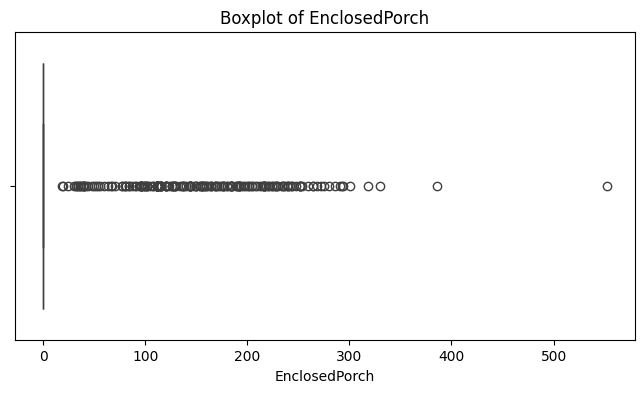

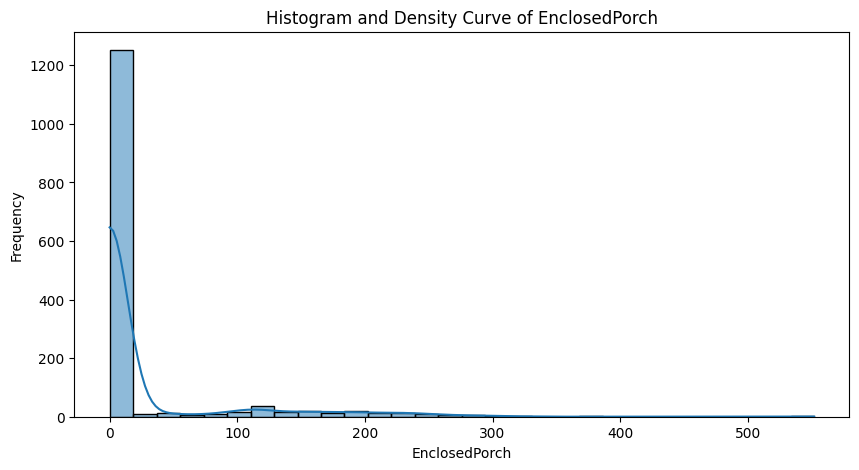

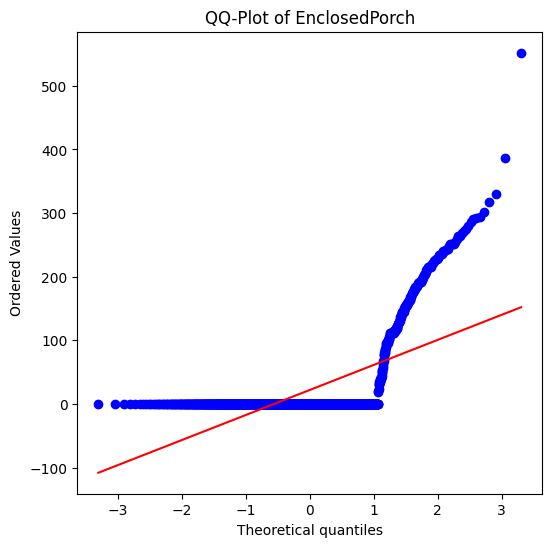

Shapiro-Wilk Test for EnclosedPorch:
Statistic: 0.4144, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for EnclosedPorch:
Statistic: 959.3509, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: 3SsnPorch ---


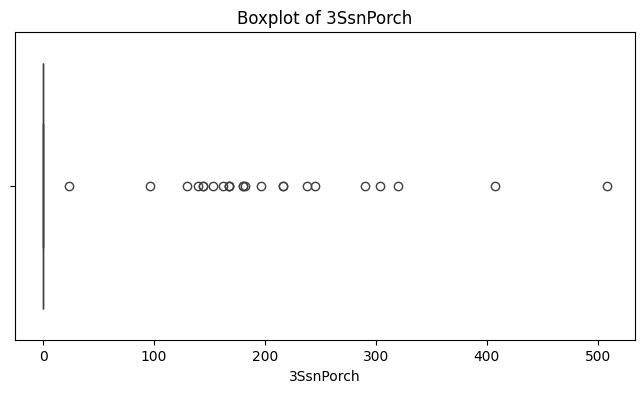

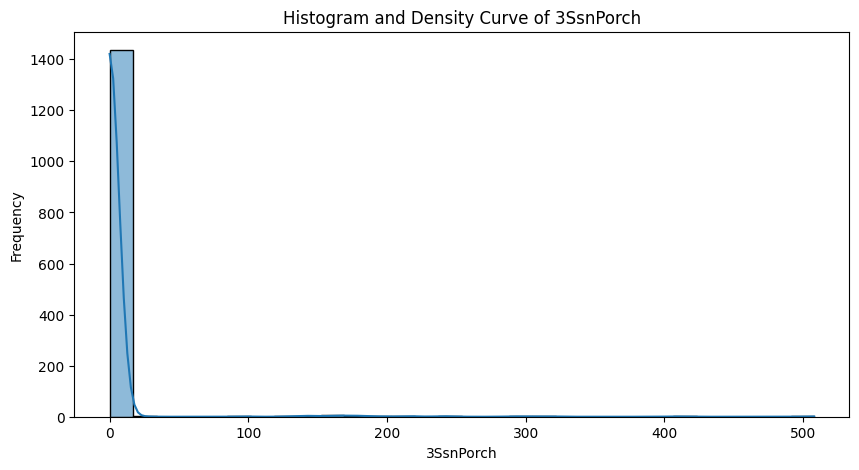

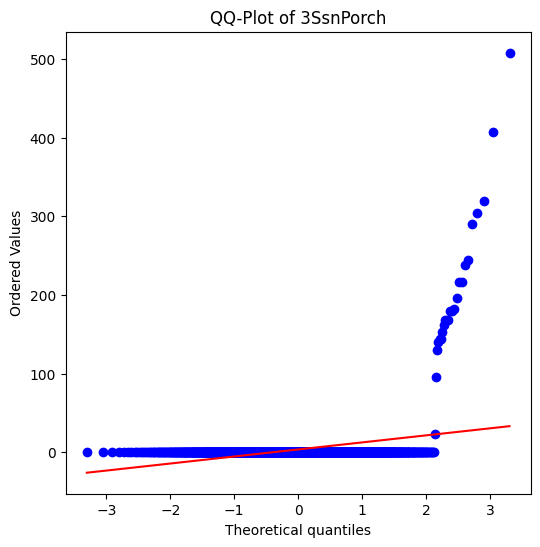

Shapiro-Wilk Test for 3SsnPorch:
Statistic: 0.0949, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for 3SsnPorch:
Statistic: 2349.9352, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: ScreenPorch ---


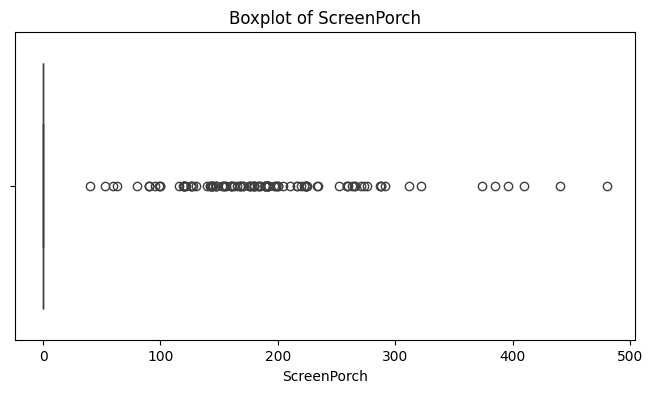

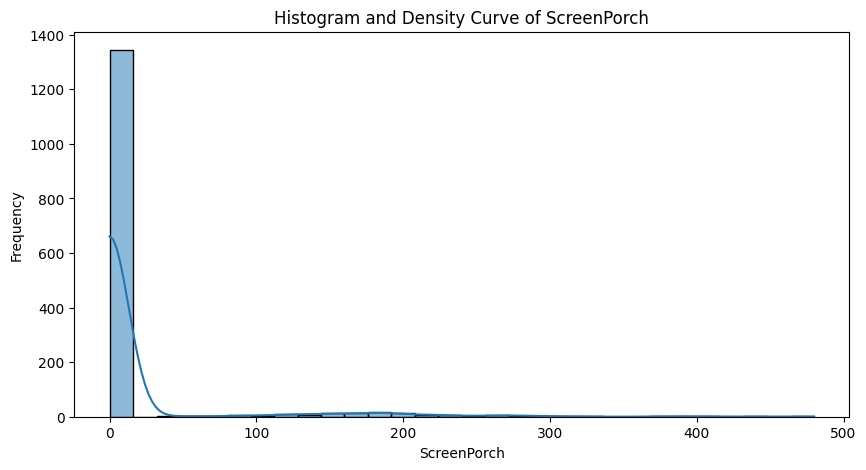

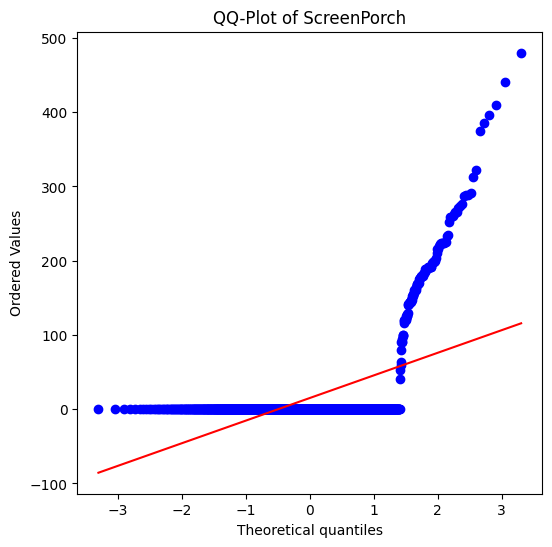

Shapiro-Wilk Test for ScreenPorch:
Statistic: 0.2982, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for ScreenPorch:
Statistic: 1249.9151, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: PoolArea ---


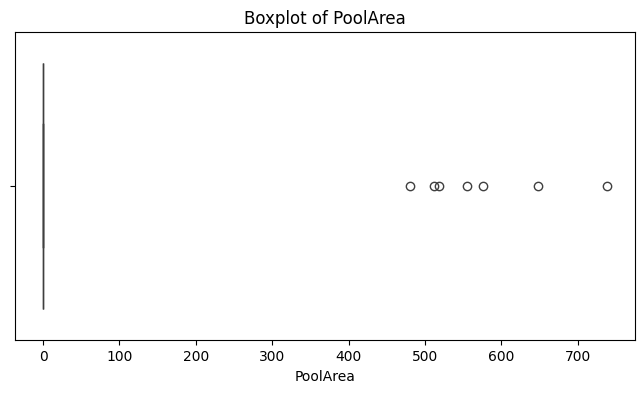

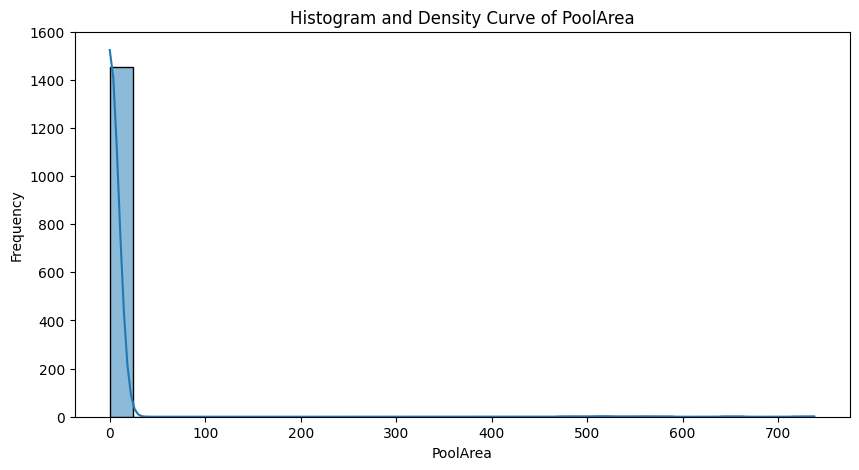

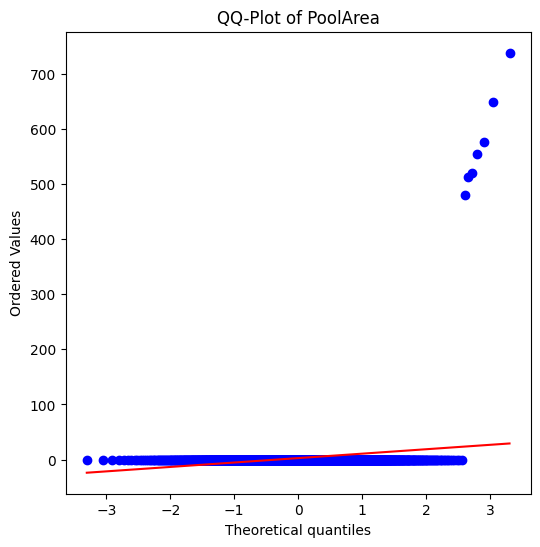

Shapiro-Wilk Test for PoolArea:
Statistic: 0.0412, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for PoolArea:
Statistic: 2825.5070, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: MiscVal ---


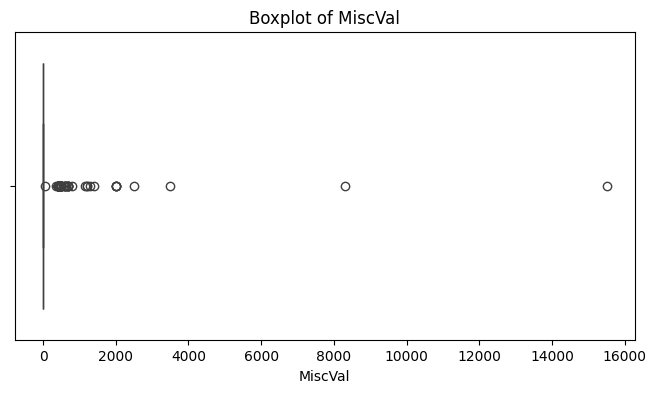

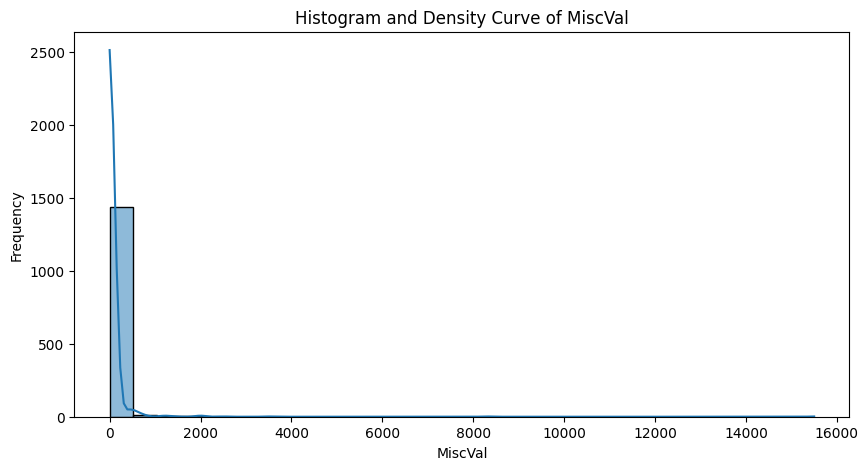

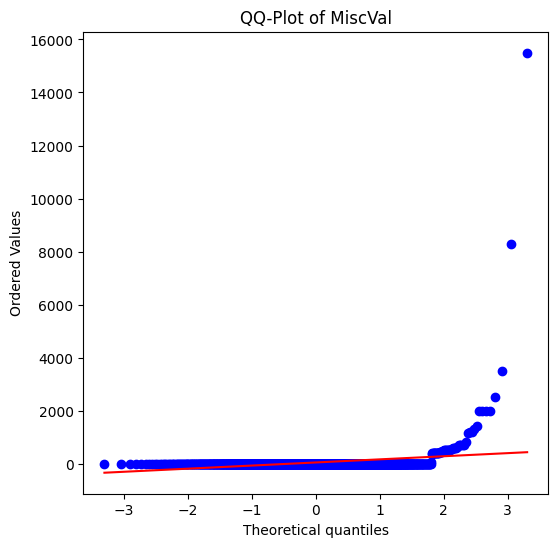

Shapiro-Wilk Test for MiscVal:
Statistic: 0.0582, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for MiscVal:
Statistic: 3564.4600, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: MoSold ---


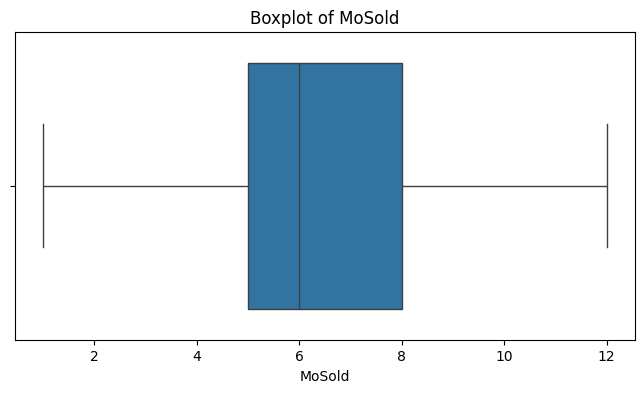

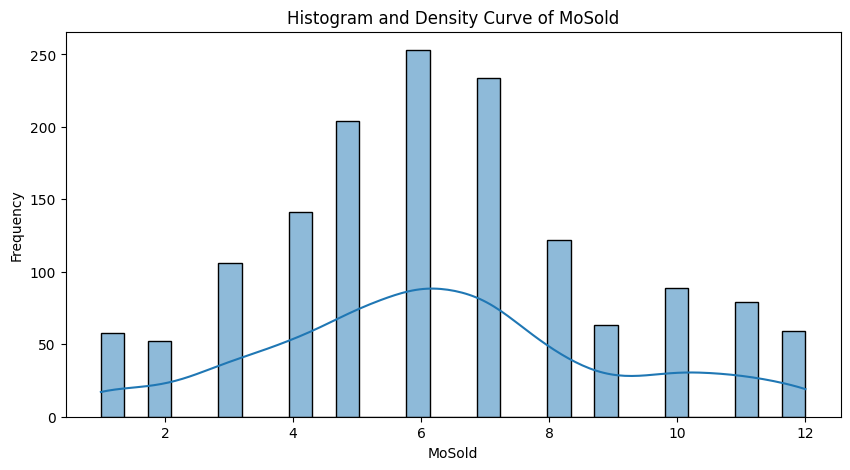

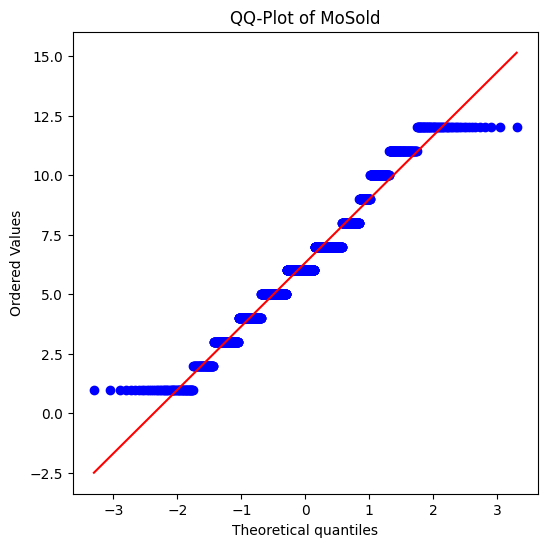

Shapiro-Wilk Test for MoSold:
Statistic: 0.9688, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for MoSold:
Statistic: 26.3135, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: YrSold ---


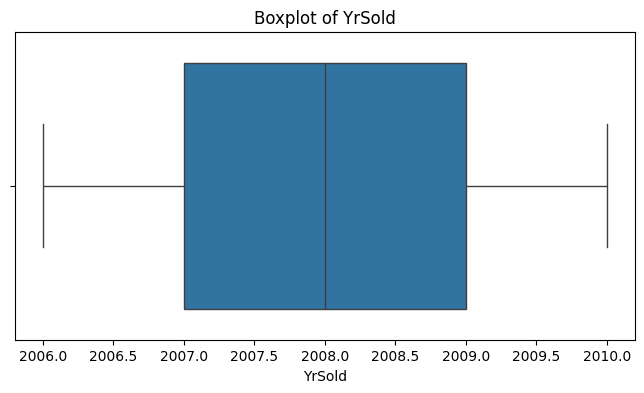

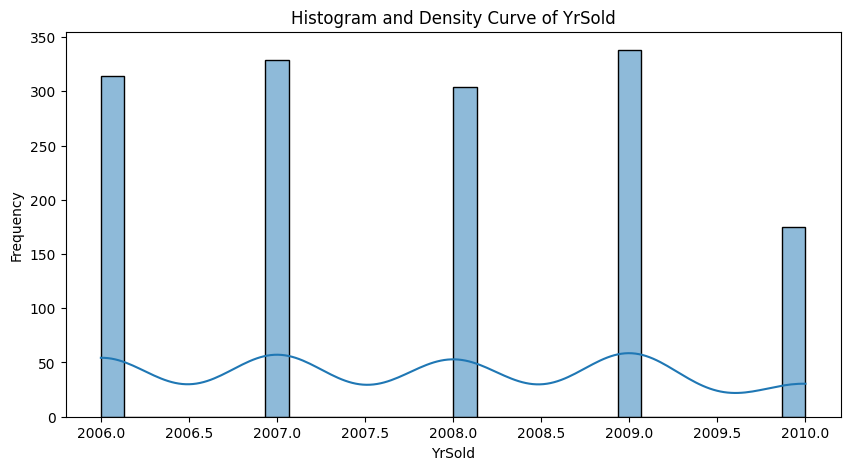

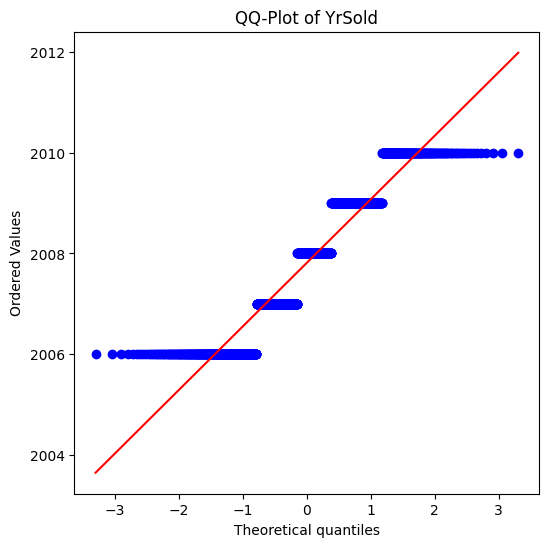

Shapiro-Wilk Test for YrSold:
Statistic: 0.8971, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for YrSold:
Statistic: 1051.8360, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)

--- Analysis for variable: SalePrice ---


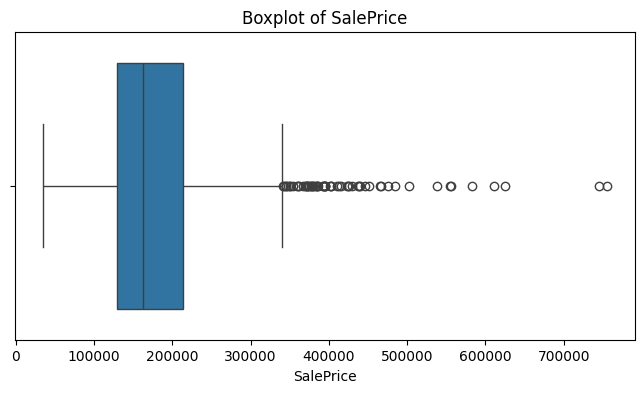

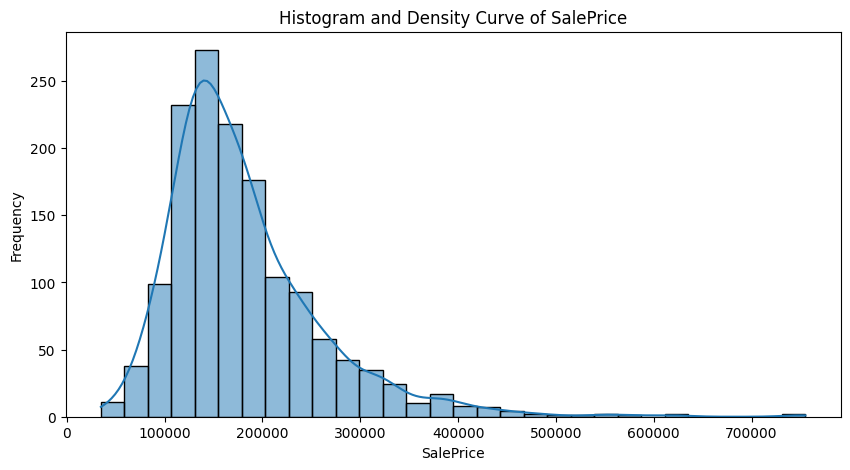

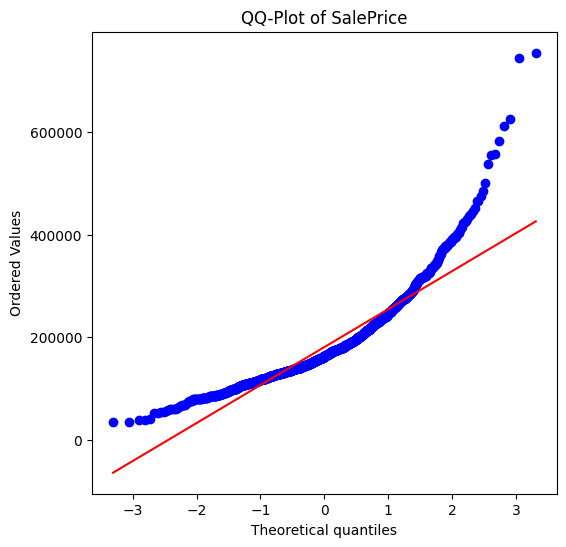

Shapiro-Wilk Test for SalePrice:
Statistic: 0.8697, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)
D'Agostino-Pearson Test for SalePrice:
Statistic: 610.8359, p-value: 0.0000
Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)


In [ ]:
# prompt: pour les quantitatives fait un tableau avec les caractéristiques de dtendance centrale, les caractéristique de dispersion, les caractéristiques de symétrie, l'étendu etc et le boxplot, l'histogramme, la courbe de densité, le qqplot et les tests de normalité

import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats

# Create a dictionary to store characteristics
quantitative_characteristics = {}

for col in quantitative_cols:
    # Characteristics of central tendency
    mean = df[col].mean()
    median = df[col].median()
    mode = df[col].mode()[0] if not df[col].mode().empty else 'N/A' # Handle cases with no mode

    # Characteristics of dispersion
    std_dev = df[col].std()
    variance = df[col].var()
    iqr = df[col].quantile(0.75) - df[col].quantile(0.25)
    range_val = df[col].max() - df[col].min()

    # Characteristics of symmetry and shape
    skewness = df[col].skew()
    kurtosis = df[col].kurtosis()

    # Store in the dictionary
    quantitative_characteristics[col] = {
        'Mean': mean,
        'Median': median,
        'Mode': mode,
        'Standard Deviation': std_dev,
        'Variance': variance,
        'IQR': iqr,
        'Range': range_val,
        'Skewness': skewness,
        'Kurtosis': kurtosis
    }

# Display the characteristics in a DataFrame
characteristics_df = pd.DataFrame(quantitative_characteristics).T
print("\nQuantitative Variable Characteristics:")
print(characteristics_df)

# Plotting and tests for each quantitative variable
for col in quantitative_cols:
    print(f"\n--- Analysis for variable: {col} ---")

    # Boxplot
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df[col])
    plt.title(f'Boxplot of {col}')
    plt.show()

    # Histogram and Density Curve
    plt.figure(figsize=(10, 5))
    sns.histplot(df[col], kde=True, bins=30)
    plt.title(f'Histogram and Density Curve of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

    # QQ-Plot
    plt.figure(figsize=(6, 6))
    stats.probplot(df[col], dist="norm", plot=plt)
    plt.title(f'QQ-Plot of {col}')
    plt.show()

    # Normality Tests
    # Shapiro-Wilk Test
    shapiro_test = stats.shapiro(df[col])
    print(f"Shapiro-Wilk Test for {col}:")
    print(f"Statistic: {shapiro_test.statistic:.4f}, p-value: {shapiro_test.pvalue:.4f}")
    if shapiro_test.pvalue < 0.05:
        print("Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)")
    else:
        print("Fail to reject null hypothesis: Data is likely normally distributed (at 5% significance level)")

    # D'Agostino-Pearson Test
    dagostino_test = stats.normaltest(df[col])
    print(f"D'Agostino-Pearson Test for {col}:")
    print(f"Statistic: {dagostino_test.statistic:.4f}, p-value: {dagostino_test.pvalue:.4f}")
    if dagostino_test.pvalue < 0.05:
        print("Reject null hypothesis: Data is likely not normally distributed (at 5% significance level)")
    else:
        print("Fail to reject null hypothesis: Data is likely normally distributed (at 5% significance level)")




--- Analyse pour la variable qualitative : MSZoning ---

Tableau récapitulatif des effectifs et proportions:
          Effectifs  Proportions (%)
MSZoning                            
RL             1151        78.835616
RM              218        14.931507
FV               65         4.452055
RH               16         1.095890
C (all)          10         0.684932


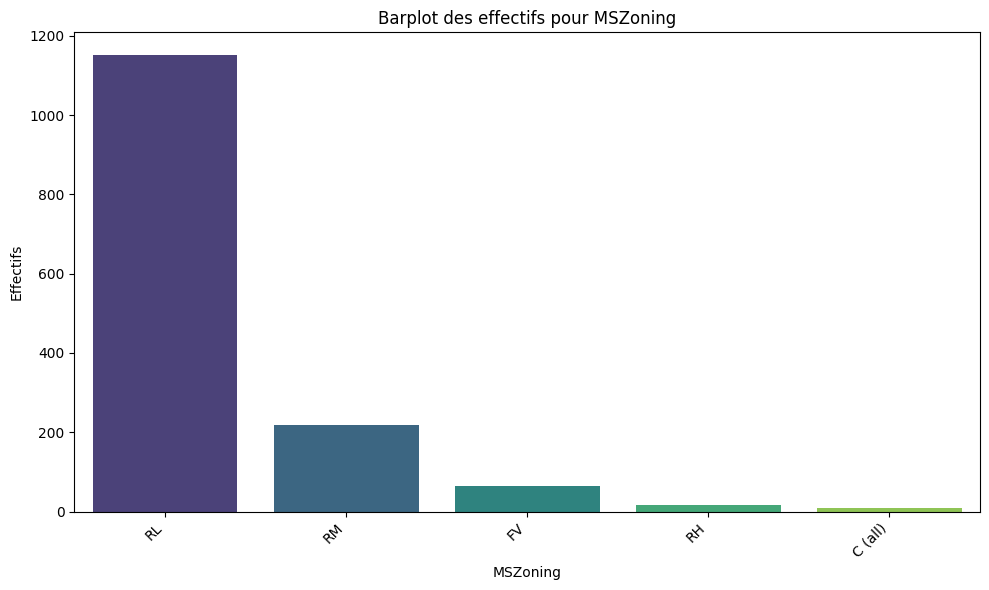

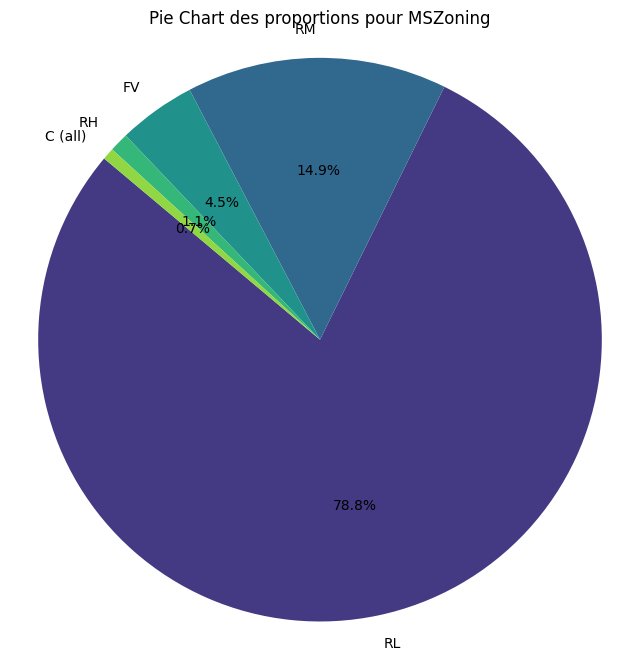


--- Analyse pour la variable qualitative : Street ---

Tableau récapitulatif des effectifs et proportions:
        Effectifs  Proportions (%)
Street                            
Pave         1454        99.589041
Grvl            6         0.410959


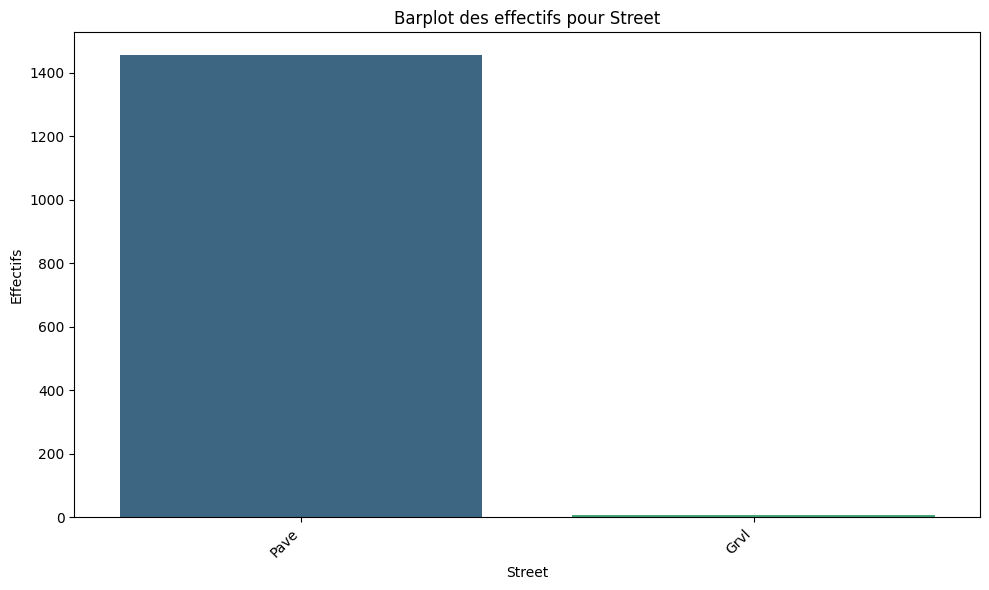

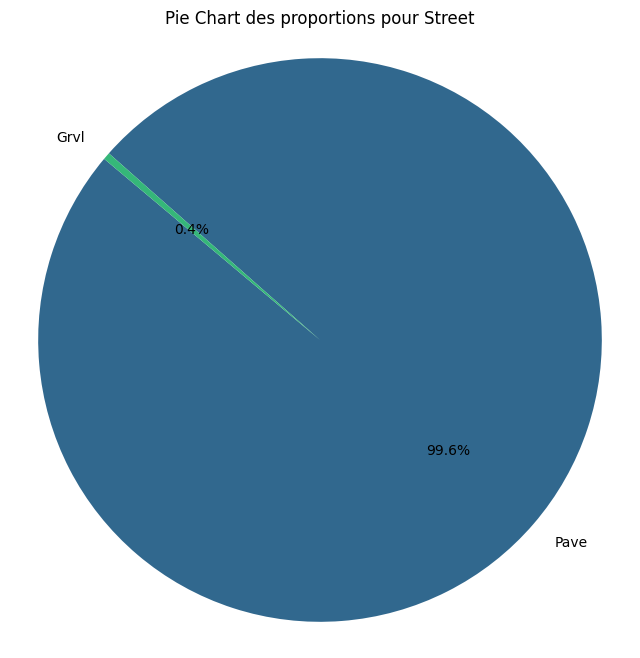


--- Analyse pour la variable qualitative : LotShape ---

Tableau récapitulatif des effectifs et proportions:
          Effectifs  Proportions (%)
LotShape                            
Reg             925        63.356164
IR1             484        33.150685
IR2              41         2.808219
IR3              10         0.684932


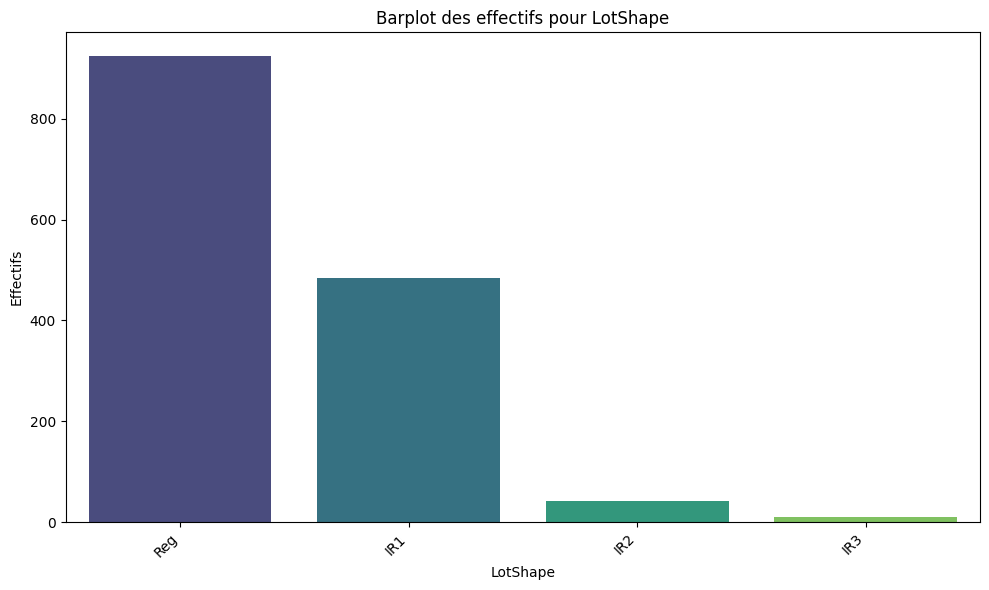

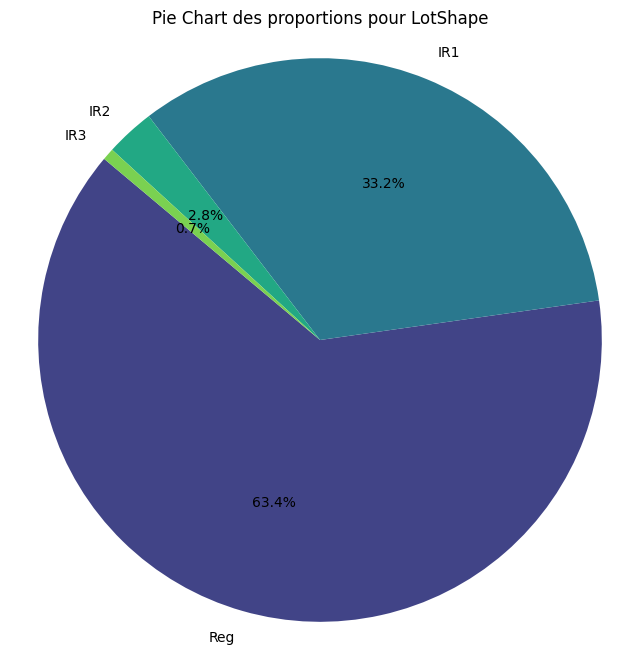


--- Analyse pour la variable qualitative : LandContour ---

Tableau récapitulatif des effectifs et proportions:
             Effectifs  Proportions (%)
LandContour                            
Lvl               1311        89.794521
Bnk                 63         4.315068
HLS                 50         3.424658
Low                 36         2.465753


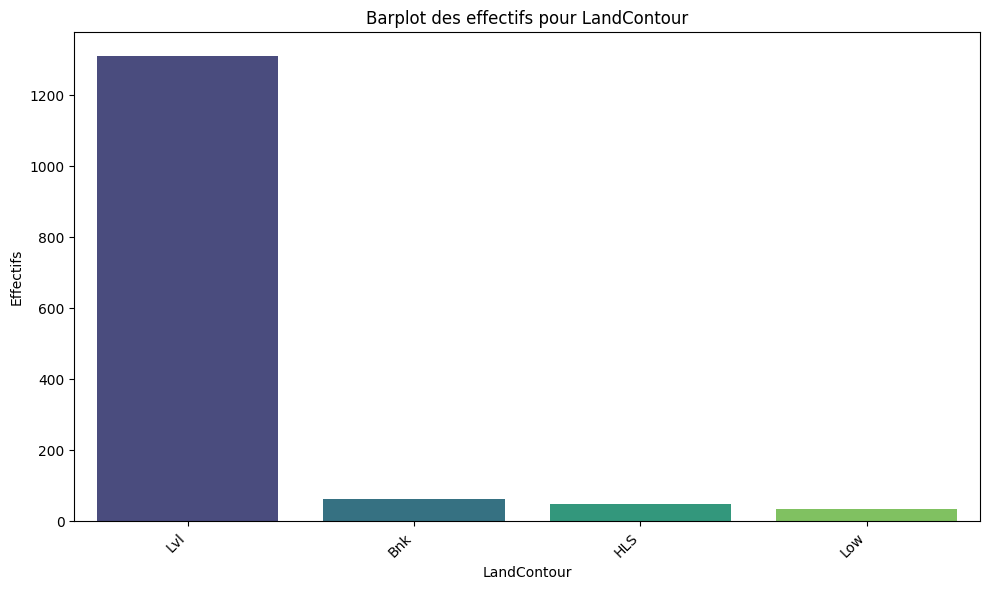

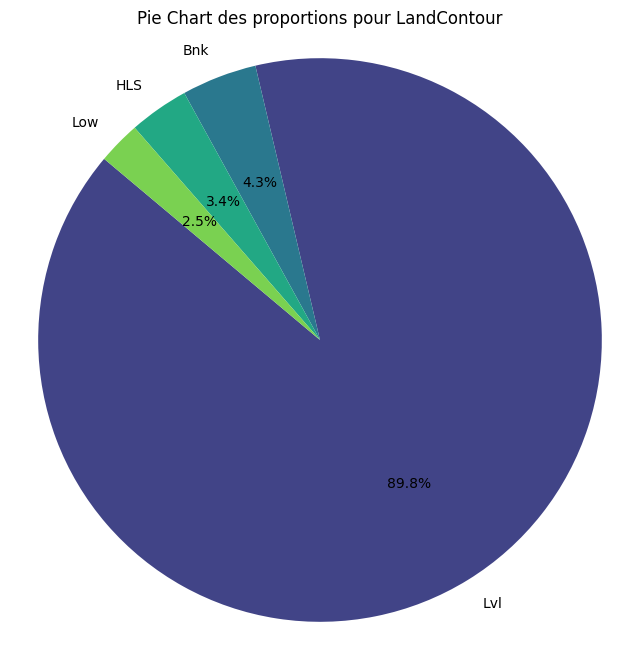


--- Analyse pour la variable qualitative : Utilities ---

Tableau récapitulatif des effectifs et proportions:
           Effectifs  Proportions (%)
Utilities                            
AllPub          1459        99.931507
NoSeWa             1         0.068493


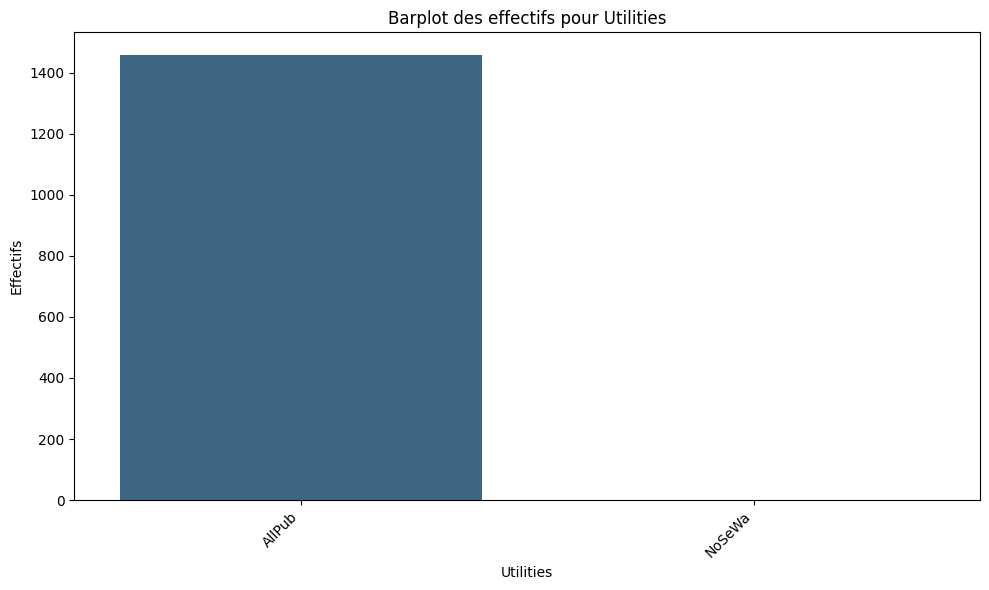

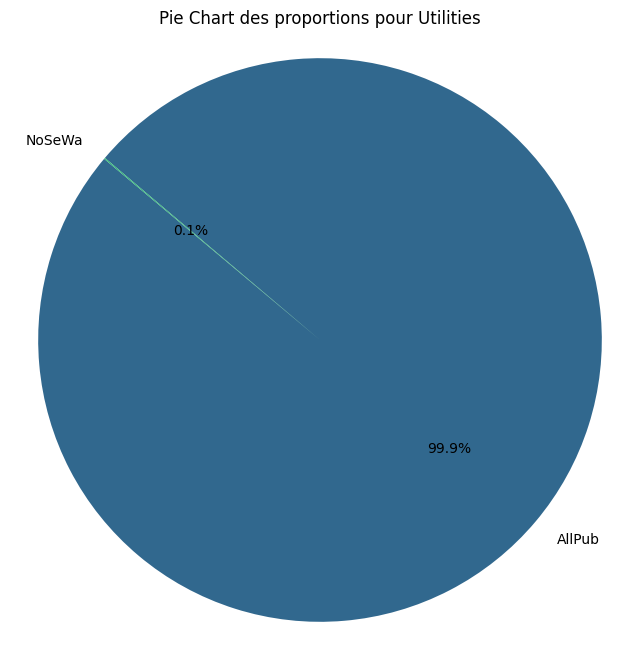


--- Analyse pour la variable qualitative : LotConfig ---

Tableau récapitulatif des effectifs et proportions:
           Effectifs  Proportions (%)
LotConfig                            
Inside          1052        72.054795
Corner           263        18.013699
CulDSac           94         6.438356
FR2               47         3.219178
FR3                4         0.273973


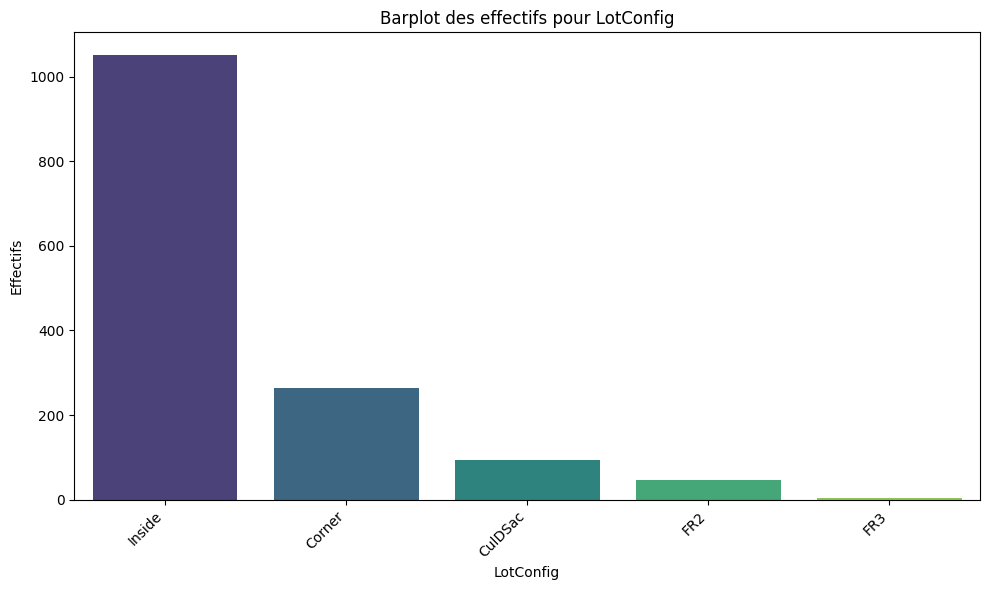

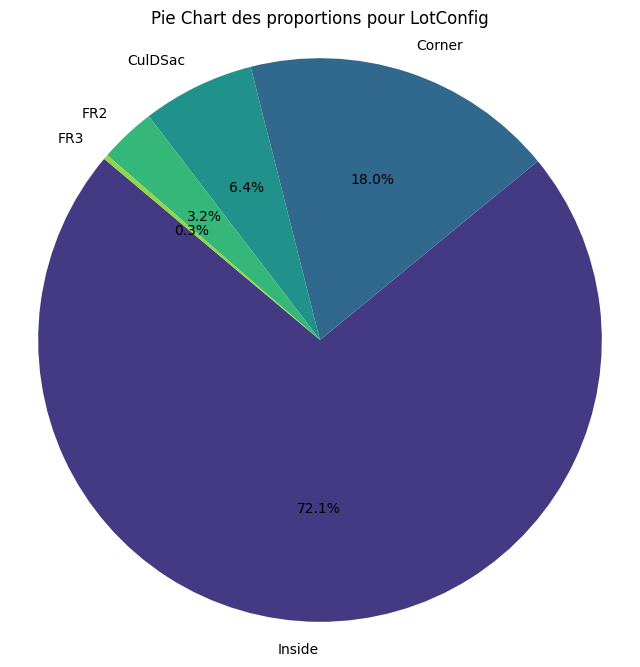


--- Analyse pour la variable qualitative : LandSlope ---

Tableau récapitulatif des effectifs et proportions:
           Effectifs  Proportions (%)
LandSlope                            
Gtl             1382        94.657534
Mod               65         4.452055
Sev               13         0.890411


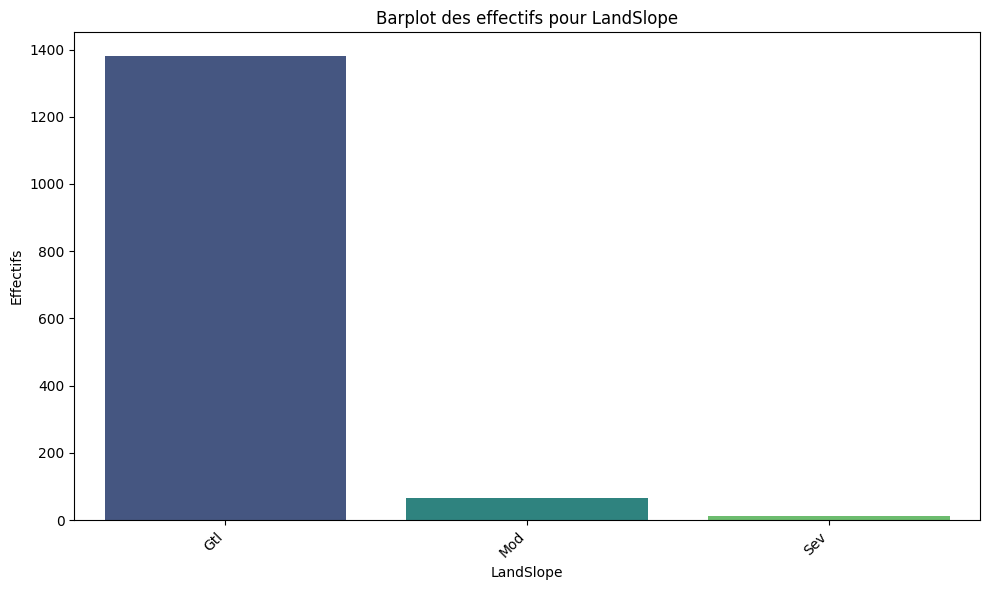

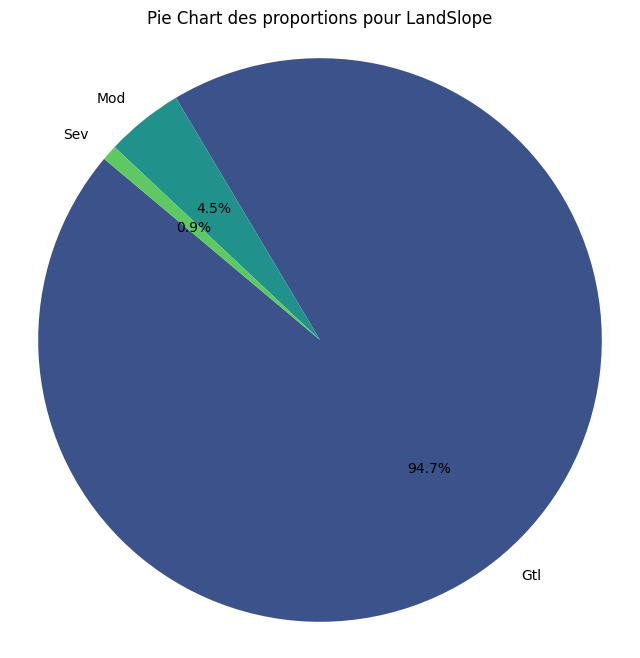


--- Analyse pour la variable qualitative : Neighborhood ---

Tableau récapitulatif des effectifs et proportions:
              Effectifs  Proportions (%)
Neighborhood                            
NAmes               225        15.410959
CollgCr             150        10.273973
OldTown             113         7.739726
Edwards             100         6.849315
Somerst              86         5.890411
Gilbert              79         5.410959
NridgHt              77         5.273973
Sawyer               74         5.068493
NWAmes               73         5.000000
SawyerW              59         4.041096
BrkSide              58         3.972603
Crawfor              51         3.493151
Mitchel              49         3.356164
NoRidge              41         2.808219
Timber               38         2.602740
IDOTRR               37         2.534247
ClearCr              28         1.917808
SWISU                25         1.712329
StoneBr              25         1.712329
Blmngtn              17  

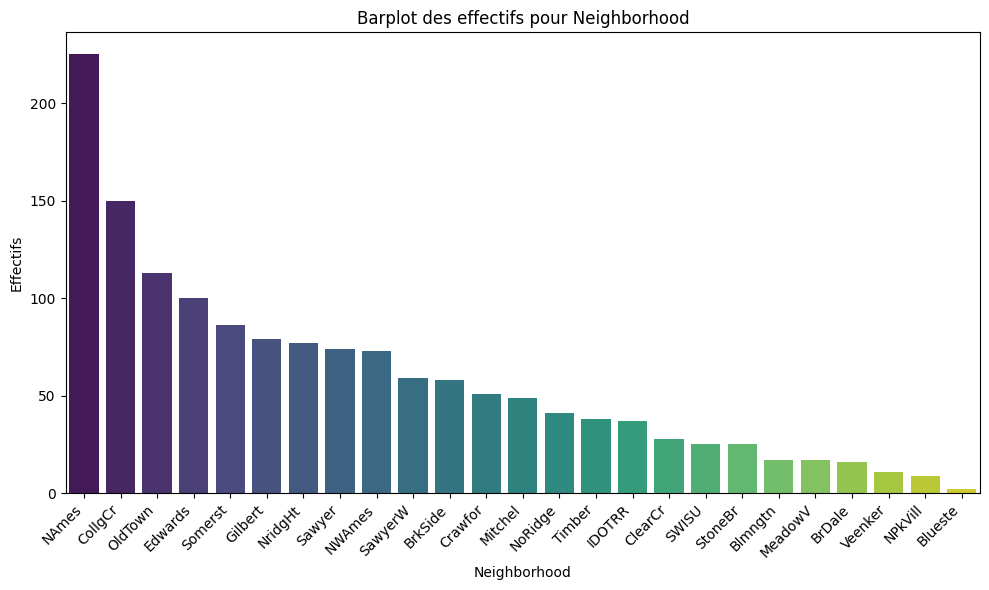

Trop de catégories (25) pour afficher un Pie Chart lisible pour Neighborhood.

--- Analyse pour la variable qualitative : Condition1 ---

Tableau récapitulatif des effectifs et proportions:
            Effectifs  Proportions (%)
Condition1                            
Norm             1260        86.301370
Feedr              81         5.547945
Artery             48         3.287671
RRAn               26         1.780822
PosN               19         1.301370
RRAe               11         0.753425
PosA                8         0.547945
RRNn                5         0.342466
RRNe                2         0.136986


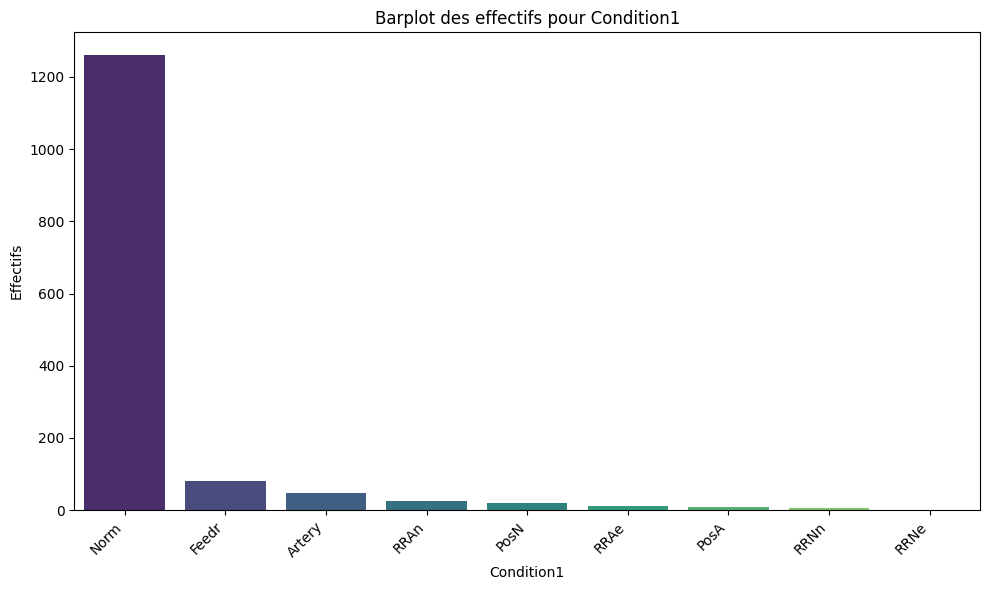

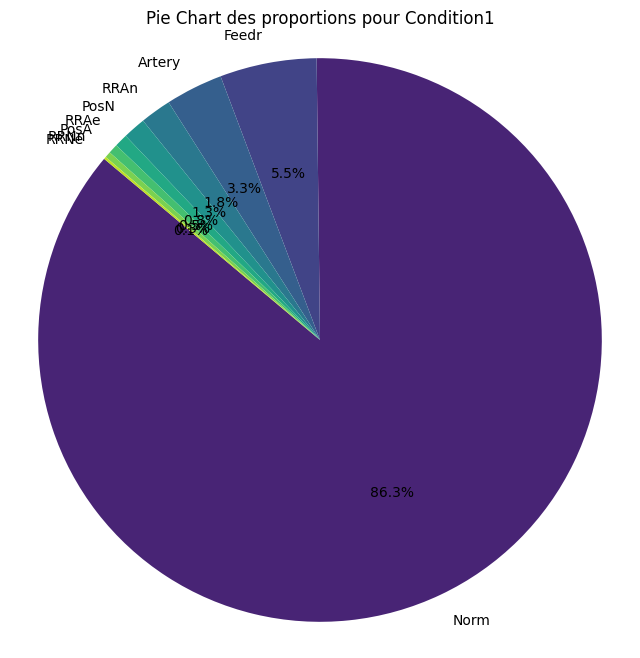


--- Analyse pour la variable qualitative : Condition2 ---

Tableau récapitulatif des effectifs et proportions:
            Effectifs  Proportions (%)
Condition2                            
Norm             1445        98.972603
Feedr               6         0.410959
Artery              2         0.136986
RRNn                2         0.136986
PosN                2         0.136986
PosA                1         0.068493
RRAn                1         0.068493
RRAe                1         0.068493


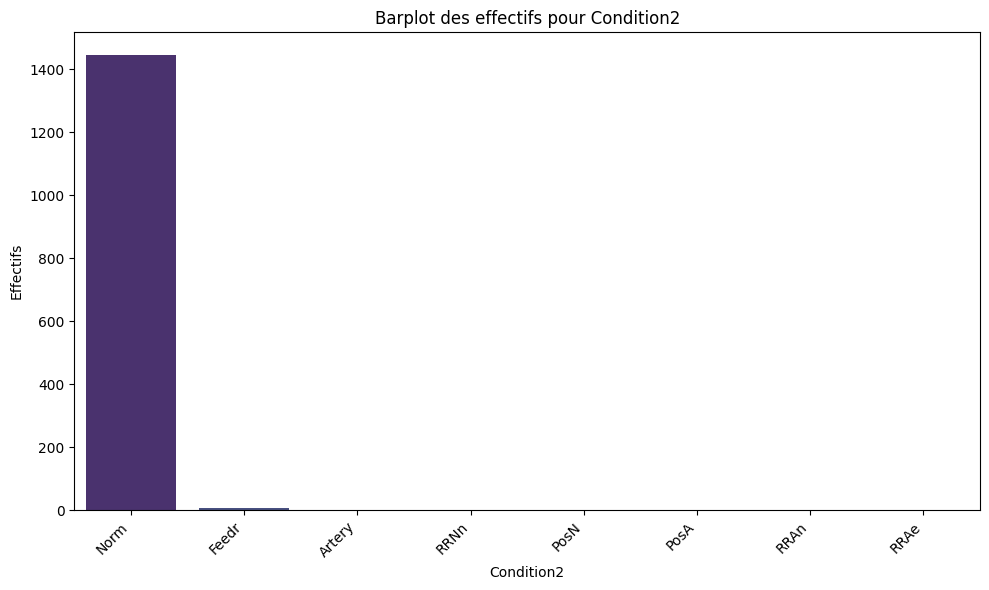

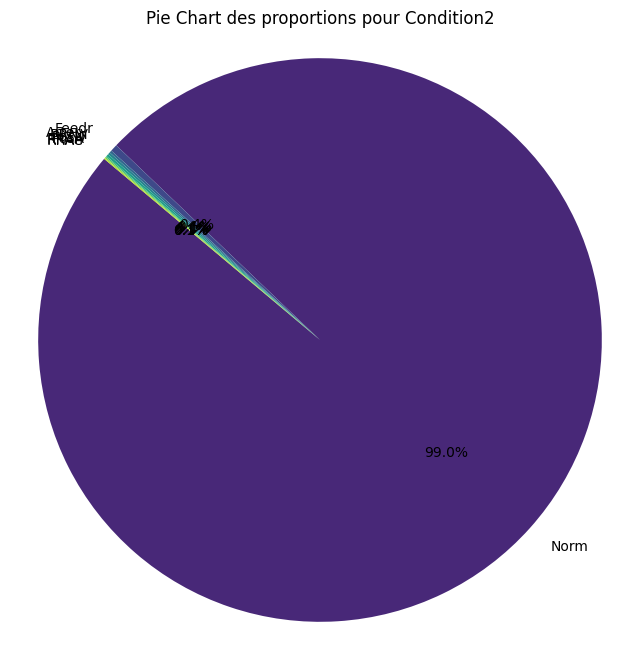


--- Analyse pour la variable qualitative : BldgType ---

Tableau récapitulatif des effectifs et proportions:
          Effectifs  Proportions (%)
BldgType                            
1Fam           1220        83.561644
TwnhsE          114         7.808219
Duplex           52         3.561644
Twnhs            43         2.945205
2fmCon           31         2.123288


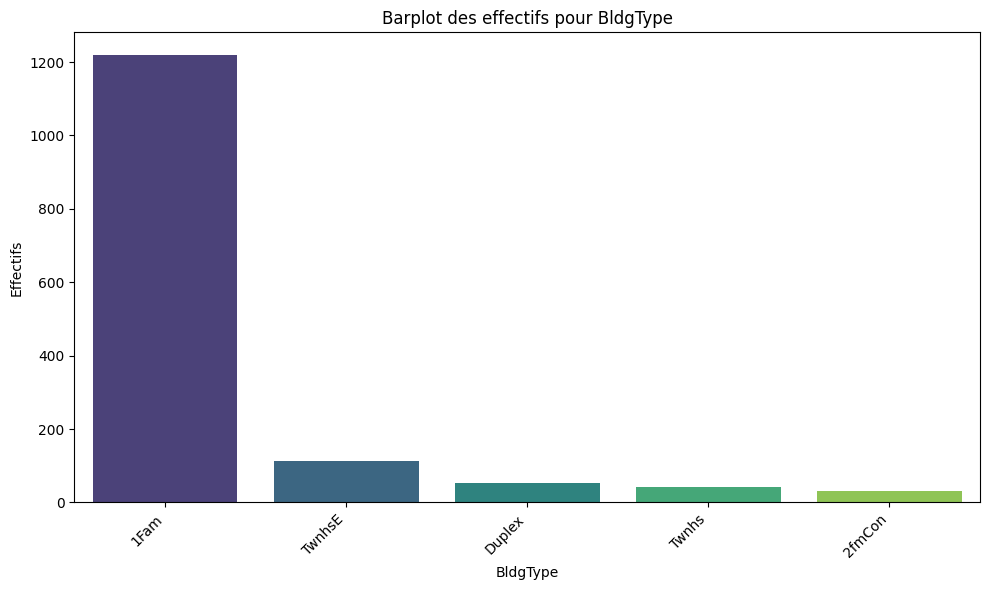

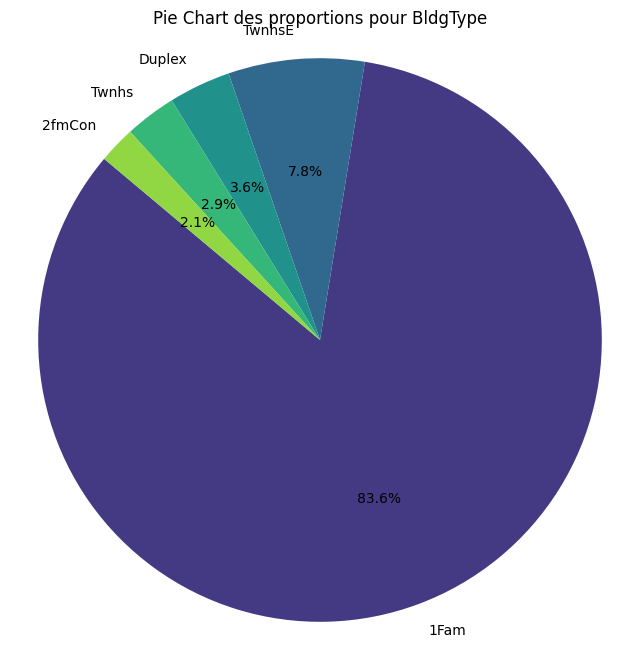


--- Analyse pour la variable qualitative : HouseStyle ---

Tableau récapitulatif des effectifs et proportions:
            Effectifs  Proportions (%)
HouseStyle                            
1Story            726        49.726027
2Story            445        30.479452
1.5Fin            154        10.547945
SLvl               65         4.452055
SFoyer             37         2.534247
1.5Unf             14         0.958904
2.5Unf             11         0.753425
2.5Fin              8         0.547945


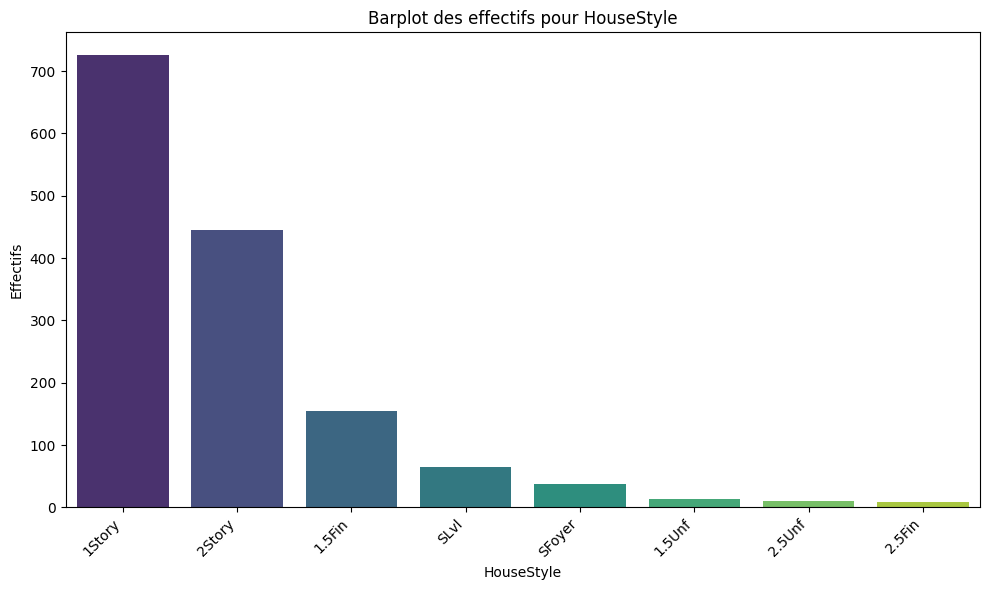

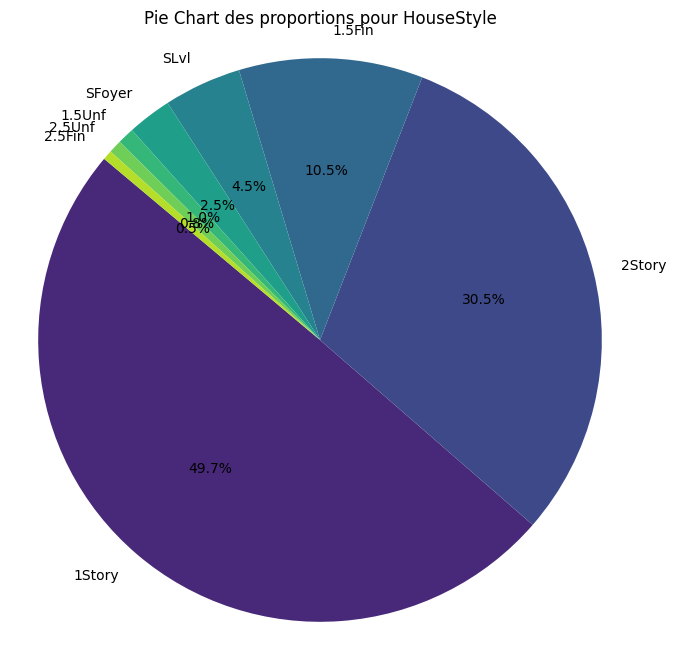


--- Analyse pour la variable qualitative : RoofStyle ---

Tableau récapitulatif des effectifs et proportions:
           Effectifs  Proportions (%)
RoofStyle                            
Gable           1141        78.150685
Hip              286        19.589041
Flat              13         0.890411
Gambrel           11         0.753425
Mansard            7         0.479452
Shed               2         0.136986


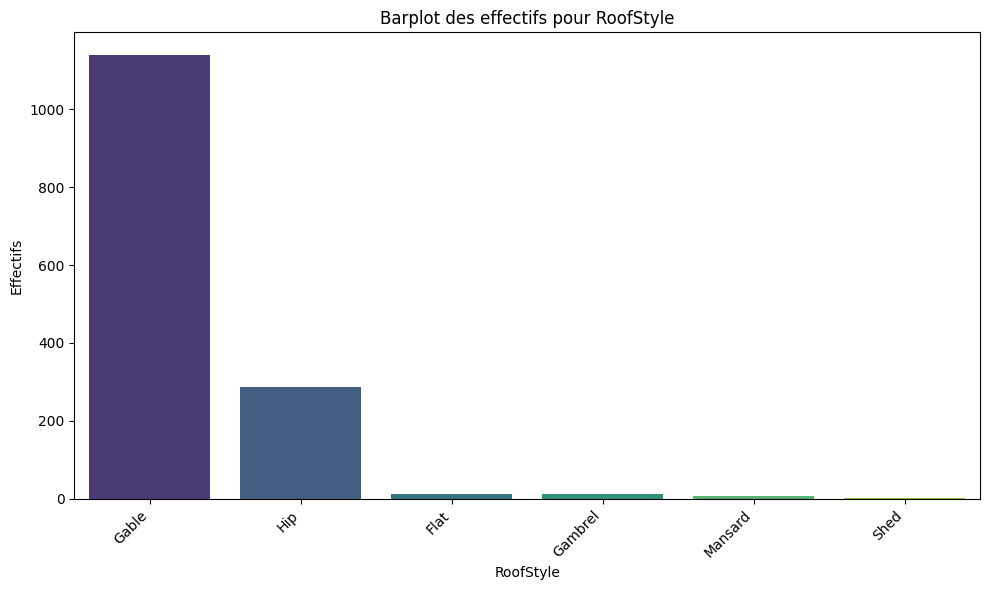

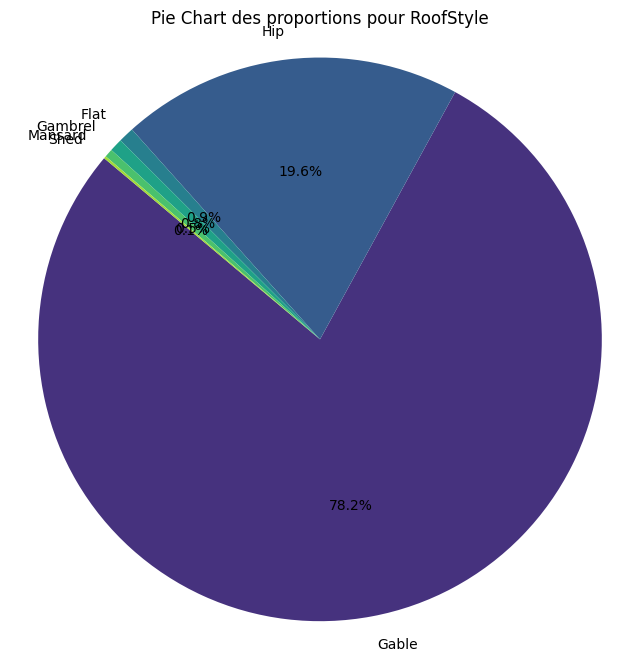


--- Analyse pour la variable qualitative : RoofMatl ---

Tableau récapitulatif des effectifs et proportions:
          Effectifs  Proportions (%)
RoofMatl                            
CompShg        1434        98.219178
Tar&Grv          11         0.753425
WdShngl           6         0.410959
WdShake           5         0.342466
Metal             1         0.068493
Membran           1         0.068493
Roll              1         0.068493
ClyTile           1         0.068493


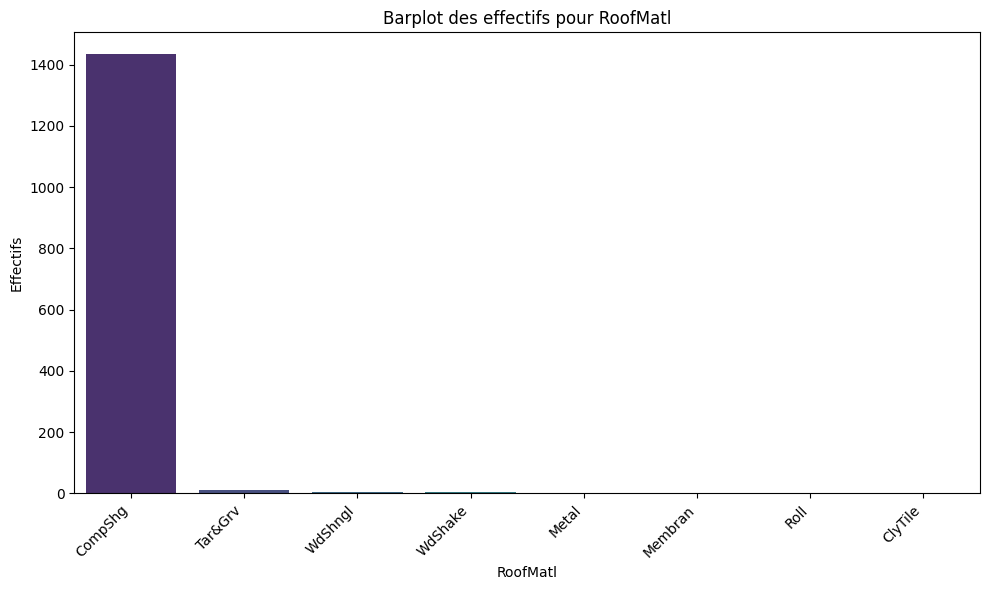

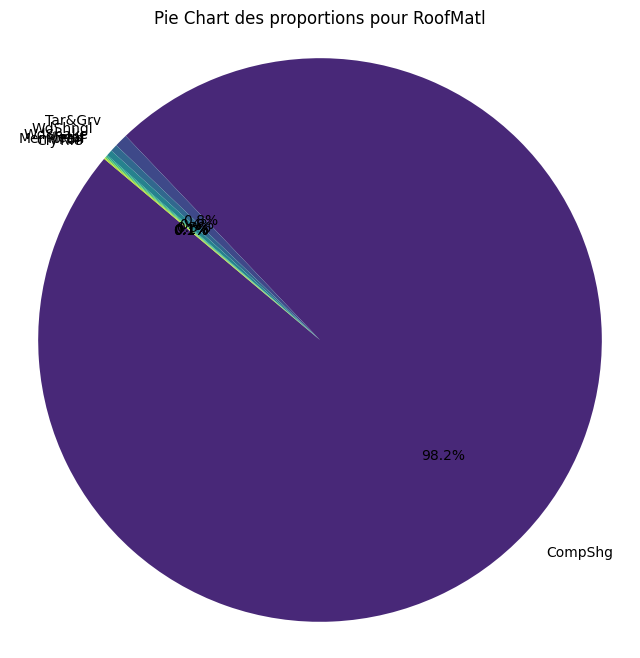


--- Analyse pour la variable qualitative : Exterior1st ---

Tableau récapitulatif des effectifs et proportions:
             Effectifs  Proportions (%)
Exterior1st                            
VinylSd            515        35.273973
HdBoard            222        15.205479
MetalSd            220        15.068493
Wd Sdng            206        14.109589
Plywood            108         7.397260
CemntBd             61         4.178082
BrkFace             50         3.424658
WdShing             26         1.780822
Stucco              25         1.712329
AsbShng             20         1.369863
BrkComm              2         0.136986
Stone                2         0.136986
AsphShn              1         0.068493
ImStucc              1         0.068493
CBlock               1         0.068493


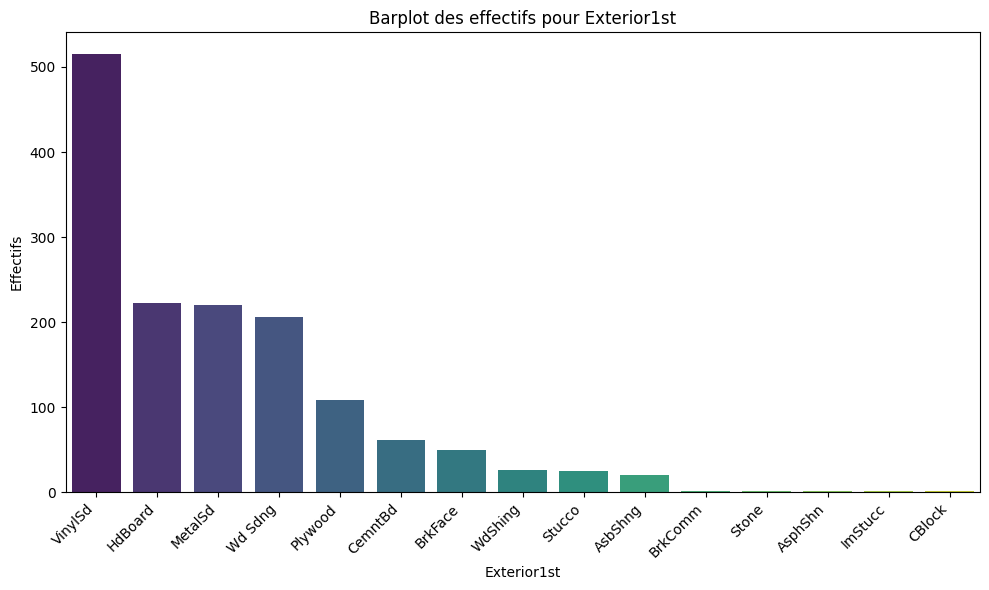

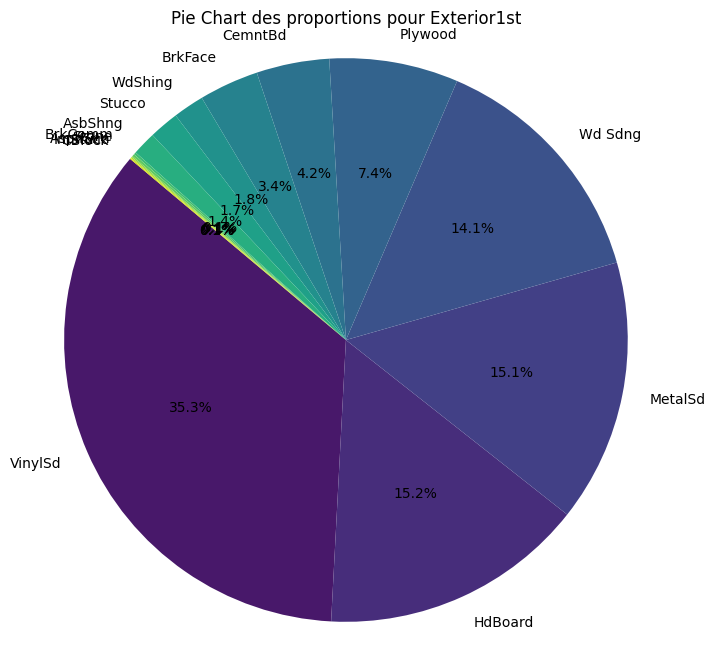


--- Analyse pour la variable qualitative : Exterior2nd ---

Tableau récapitulatif des effectifs et proportions:
             Effectifs  Proportions (%)
Exterior2nd                            
VinylSd            504        34.520548
MetalSd            214        14.657534
HdBoard            207        14.178082
Wd Sdng            197        13.493151
Plywood            142         9.726027
CmentBd             60         4.109589
Wd Shng             38         2.602740
Stucco              26         1.780822
BrkFace             25         1.712329
AsbShng             20         1.369863
ImStucc             10         0.684932
Brk Cmn              7         0.479452
Stone                5         0.342466
AsphShn              3         0.205479
Other                1         0.068493
CBlock               1         0.068493


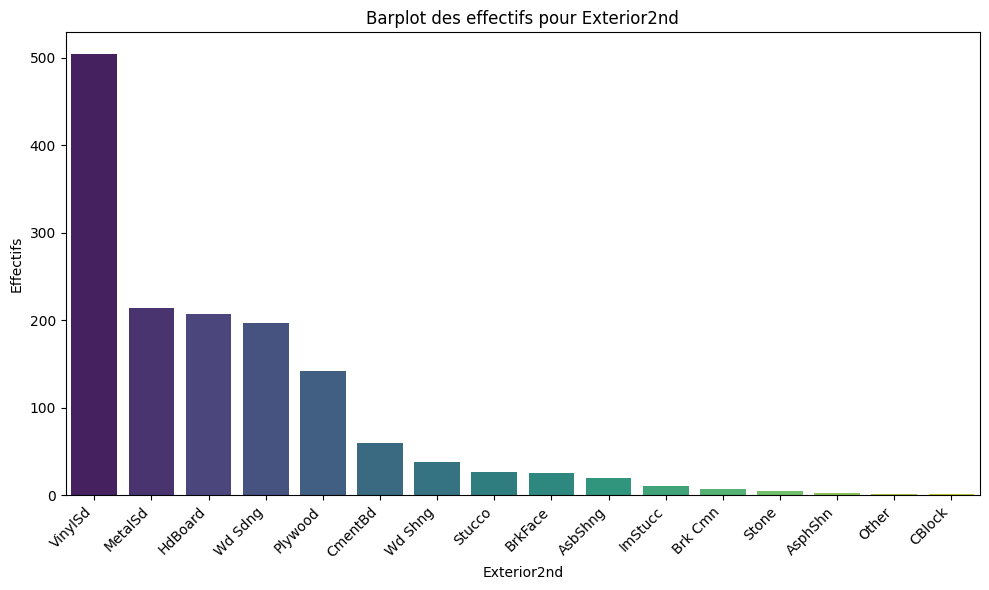

Trop de catégories (16) pour afficher un Pie Chart lisible pour Exterior2nd.

--- Analyse pour la variable qualitative : ExterQual ---

Tableau récapitulatif des effectifs et proportions:
           Effectifs  Proportions (%)
ExterQual                            
TA               906        62.054795
Gd               488        33.424658
Ex                52         3.561644
Fa                14         0.958904


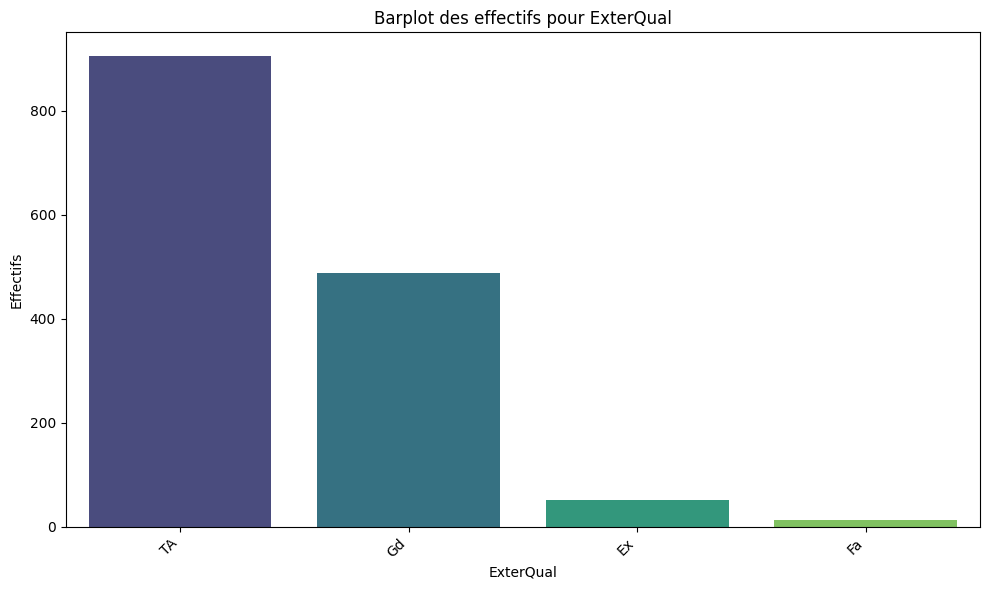

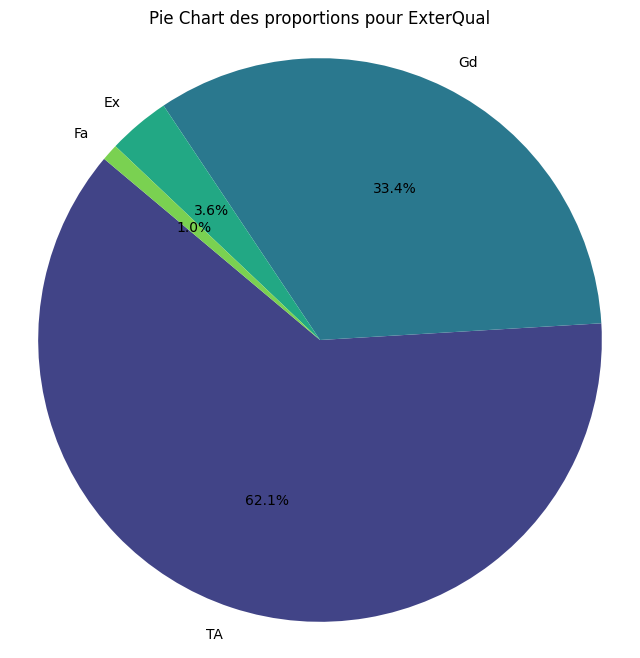


--- Analyse pour la variable qualitative : ExterCond ---

Tableau récapitulatif des effectifs et proportions:
           Effectifs  Proportions (%)
ExterCond                            
TA              1282        87.808219
Gd               146        10.000000
Fa                28         1.917808
Ex                 3         0.205479
Po                 1         0.068493


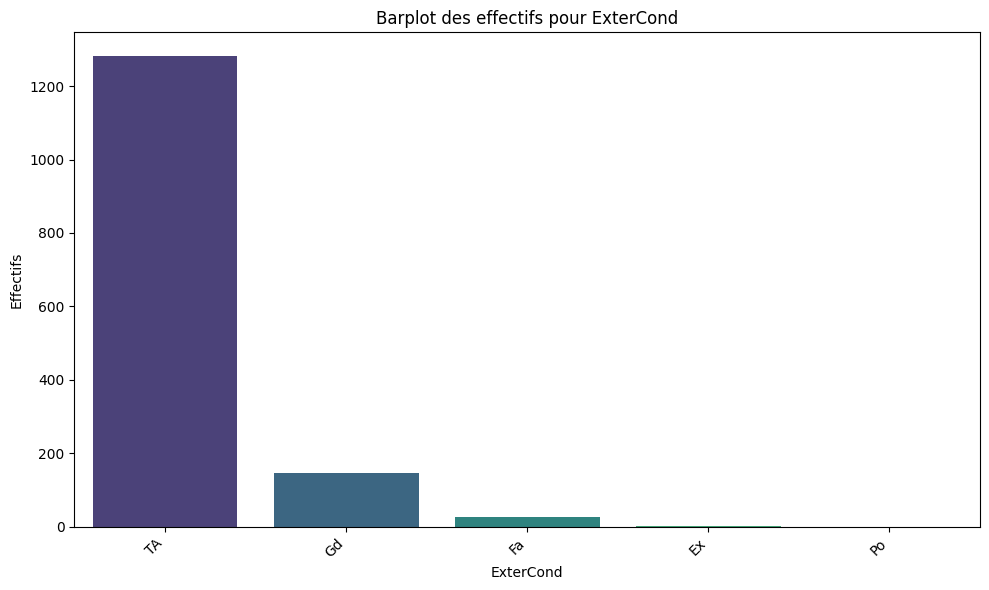

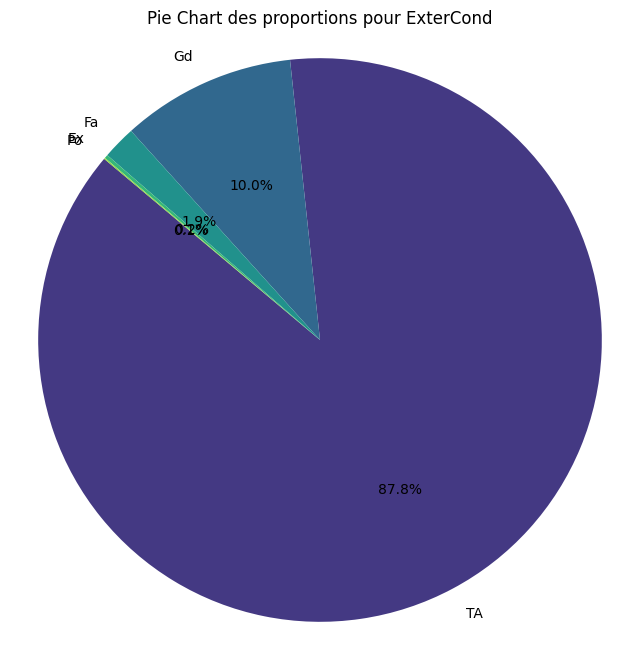


--- Analyse pour la variable qualitative : Foundation ---

Tableau récapitulatif des effectifs et proportions:
            Effectifs  Proportions (%)
Foundation                            
PConc             647        44.315068
CBlock            634        43.424658
BrkTil            146        10.000000
Slab               24         1.643836
Stone               6         0.410959
Wood                3         0.205479


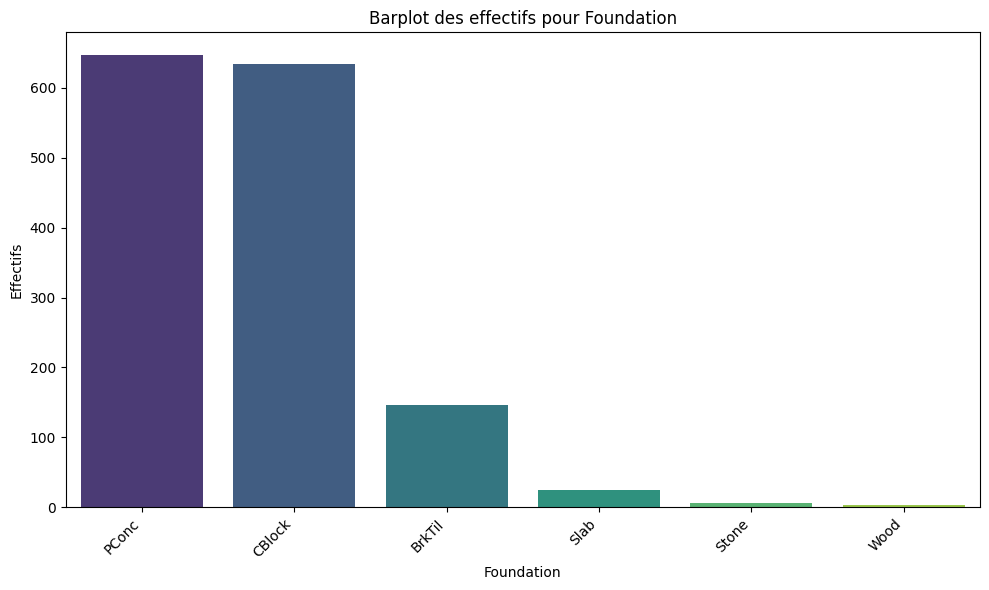

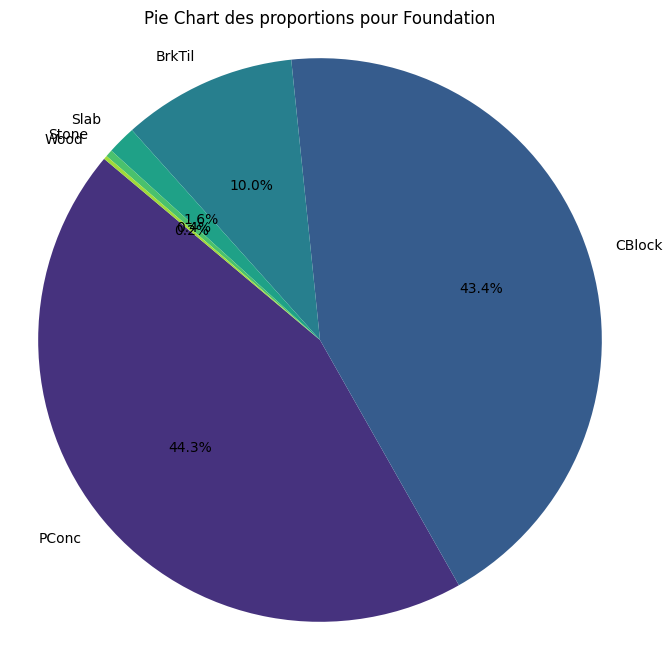


--- Analyse pour la variable qualitative : BsmtQual ---

Tableau récapitulatif des effectifs et proportions:
          Effectifs  Proportions (%)
BsmtQual                            
TA              686        46.986301
Gd              618        42.328767
Ex              121         8.287671
Fa               35         2.397260


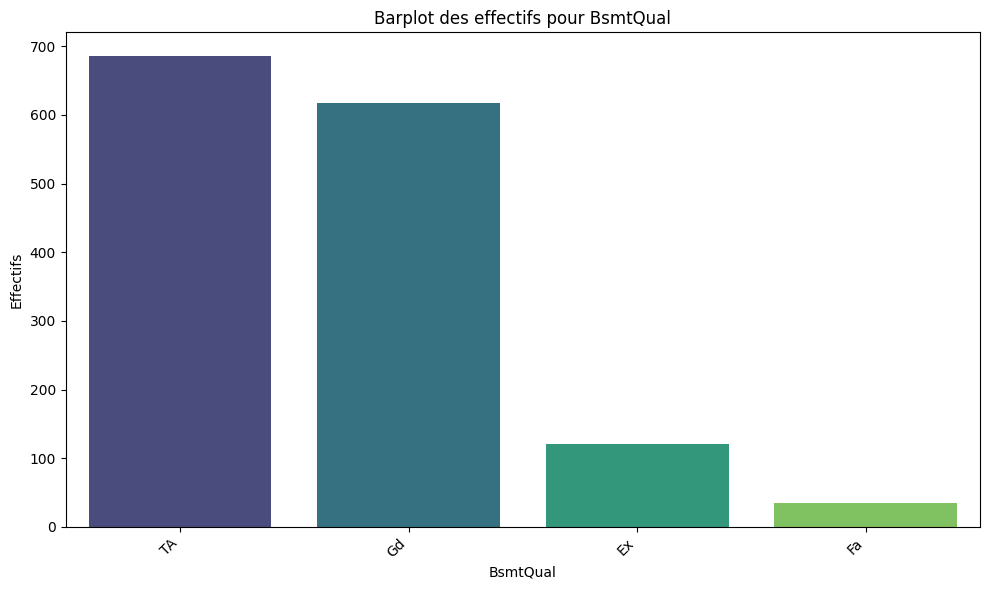

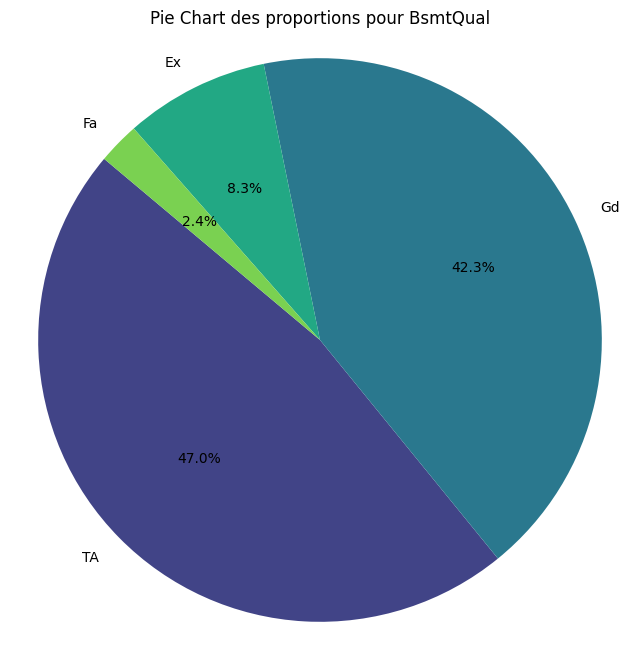


--- Analyse pour la variable qualitative : BsmtCond ---

Tableau récapitulatif des effectifs et proportions:
          Effectifs  Proportions (%)
BsmtCond                            
TA             1348        92.328767
Gd               65         4.452055
Fa               45         3.082192
Po                2         0.136986


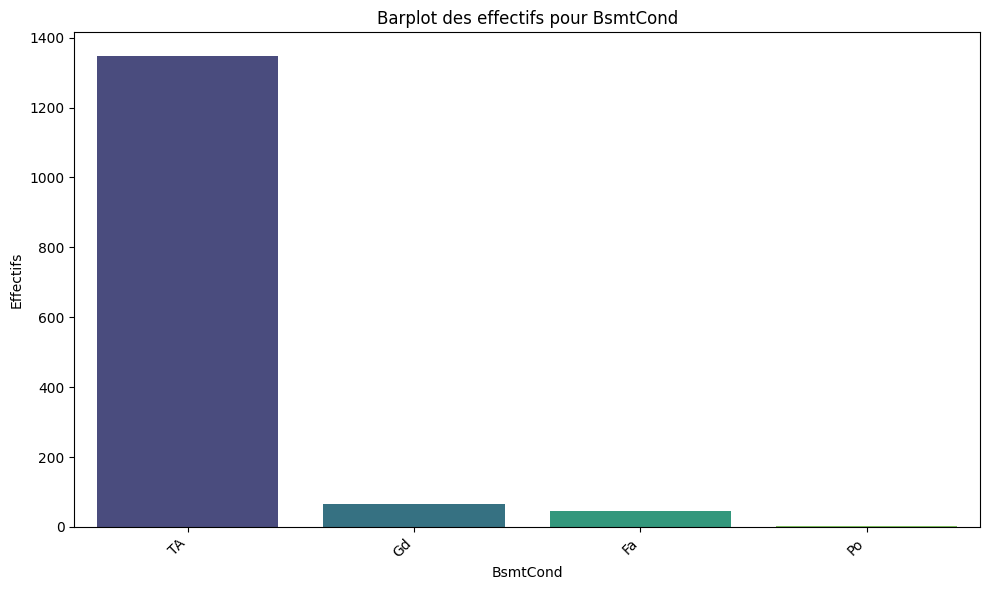

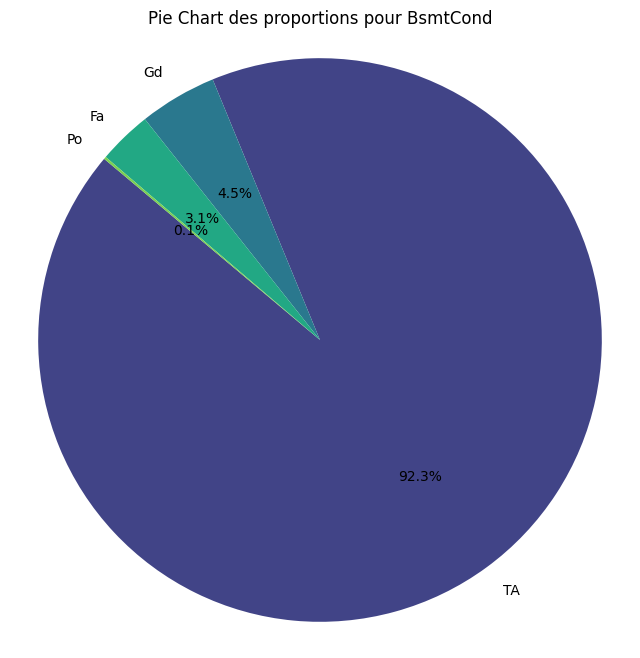


--- Analyse pour la variable qualitative : BsmtExposure ---

Tableau récapitulatif des effectifs et proportions:
              Effectifs  Proportions (%)
BsmtExposure                            
No                  991        67.876712
Av                  221        15.136986
Gd                  134         9.178082
Mn                  114         7.808219


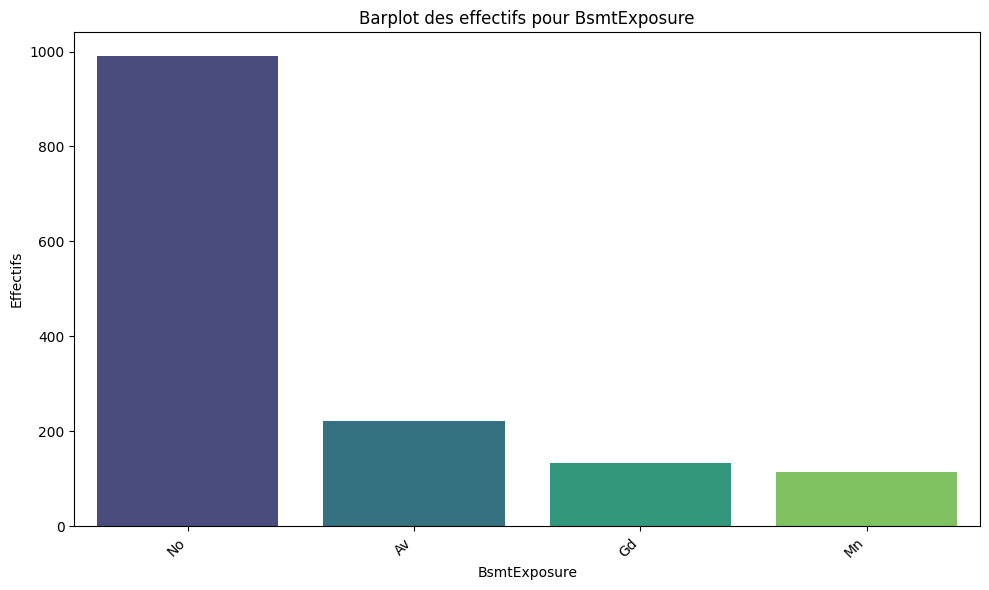

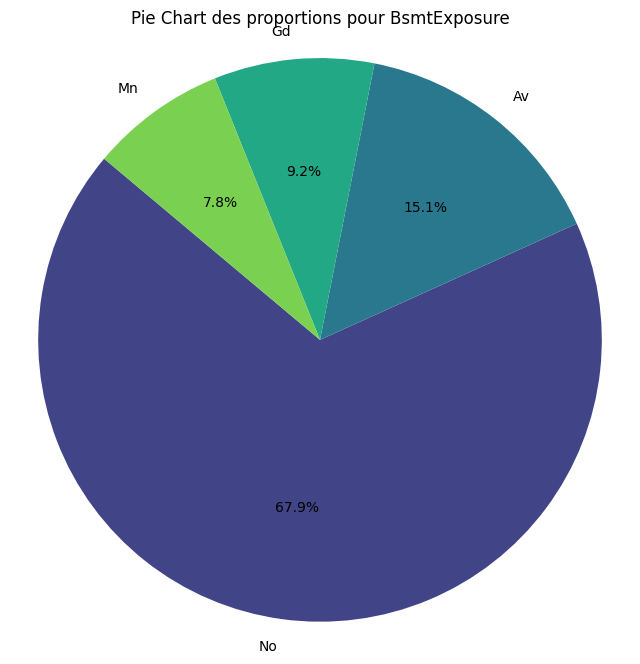


--- Analyse pour la variable qualitative : BsmtFinType1 ---

Tableau récapitulatif des effectifs et proportions:
              Effectifs  Proportions (%)
BsmtFinType1                            
Unf                 467        31.986301
GLQ                 418        28.630137
ALQ                 220        15.068493
BLQ                 148        10.136986
Rec                 133         9.109589
LwQ                  74         5.068493


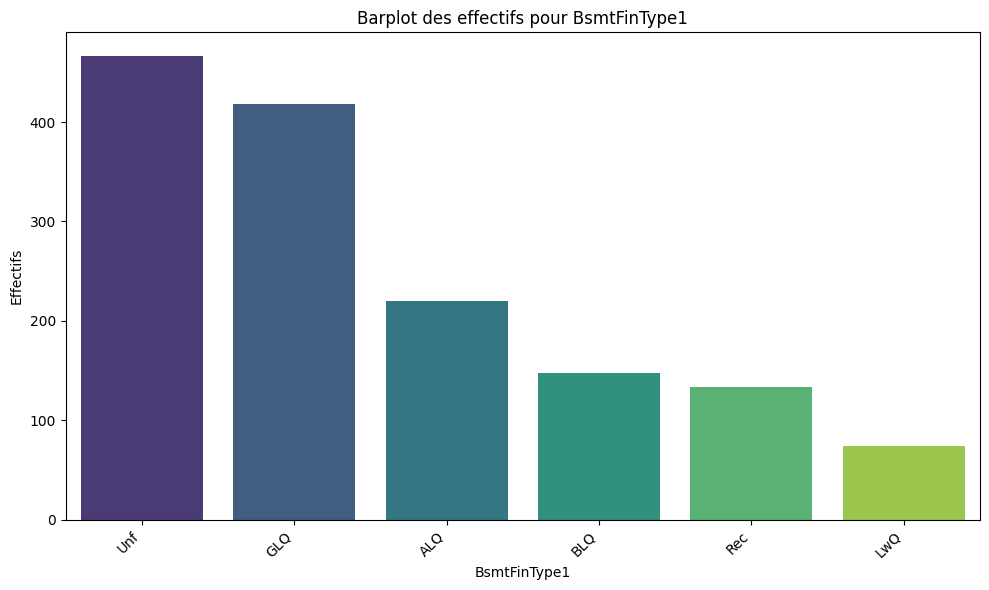

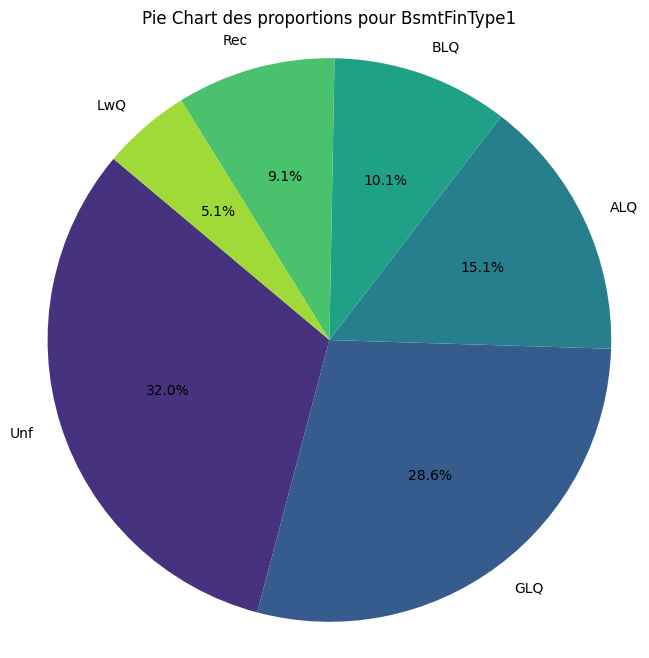


--- Analyse pour la variable qualitative : BsmtFinType2 ---

Tableau récapitulatif des effectifs et proportions:
              Effectifs  Proportions (%)
BsmtFinType2                            
Unf                1294        88.630137
Rec                  54         3.698630
LwQ                  46         3.150685
BLQ                  33         2.260274
ALQ                  19         1.301370
GLQ                  14         0.958904


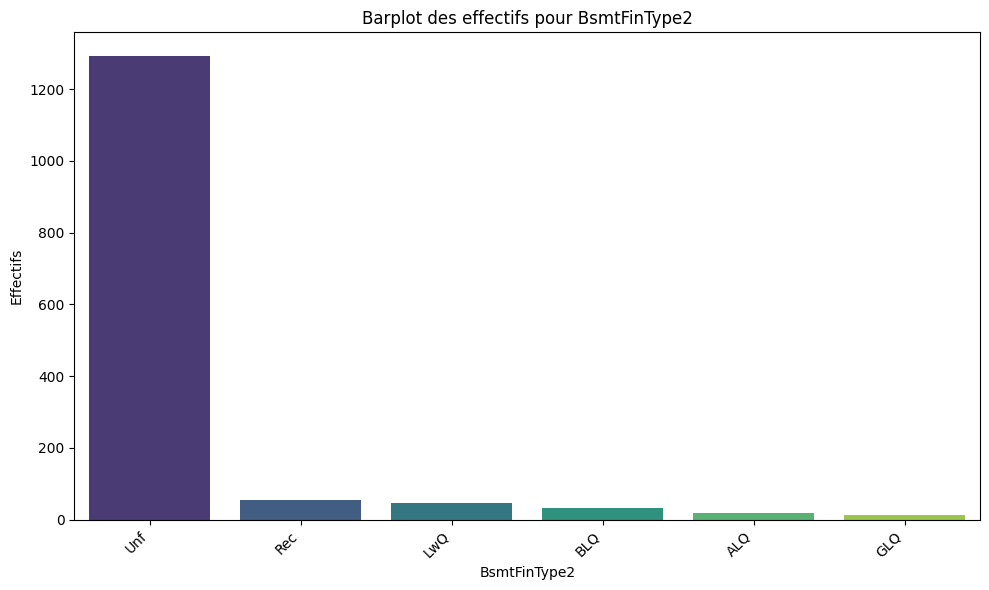

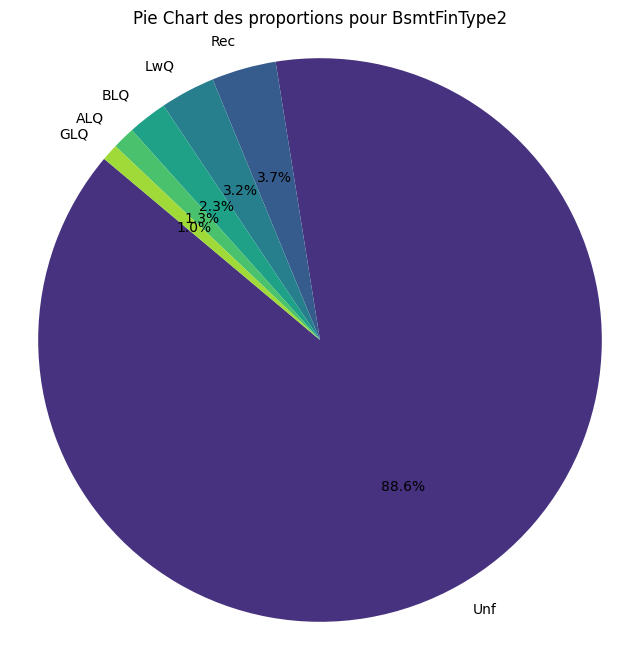


--- Analyse pour la variable qualitative : Heating ---

Tableau récapitulatif des effectifs et proportions:
         Effectifs  Proportions (%)
Heating                            
GasA          1428        97.808219
GasW            18         1.232877
Grav             7         0.479452
Wall             4         0.273973
OthW             2         0.136986
Floor            1         0.068493


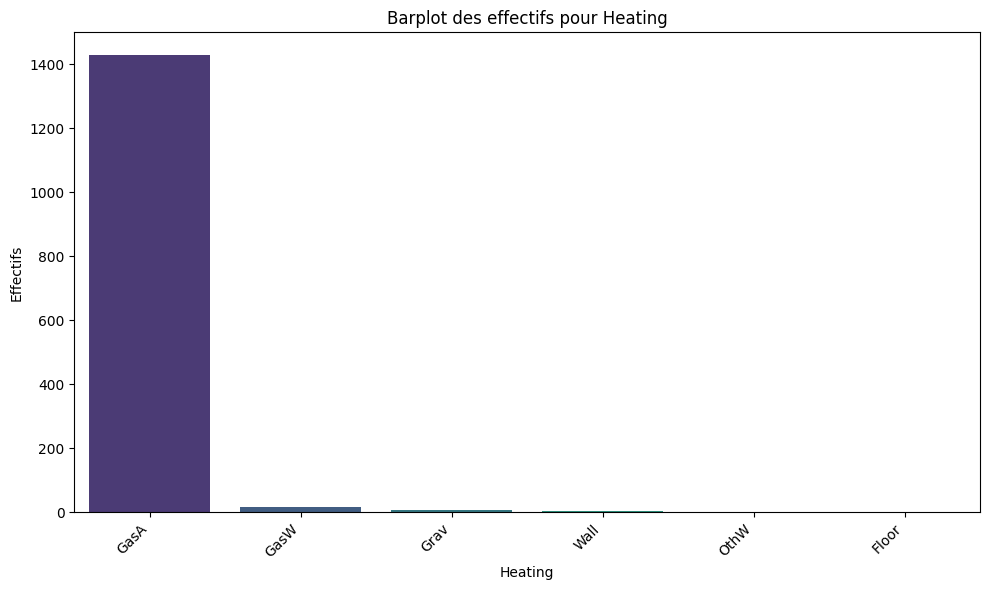

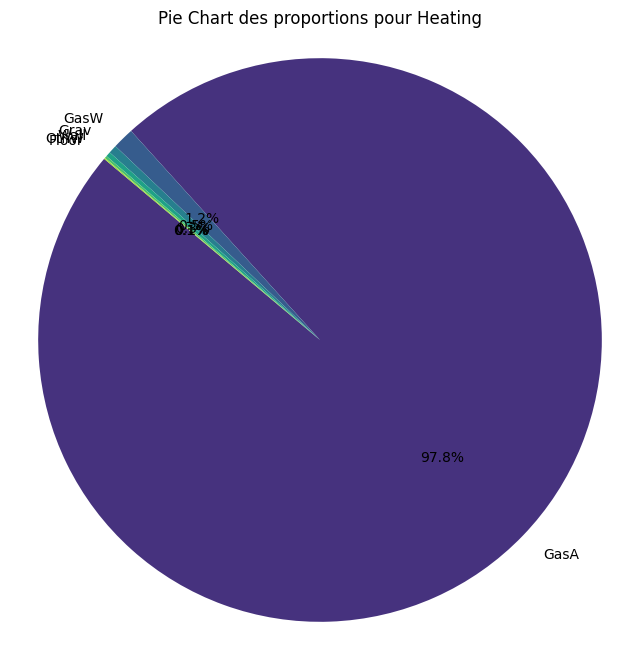


--- Analyse pour la variable qualitative : HeatingQC ---

Tableau récapitulatif des effectifs et proportions:
           Effectifs  Proportions (%)
HeatingQC                            
Ex               741        50.753425
TA               428        29.315068
Gd               241        16.506849
Fa                49         3.356164
Po                 1         0.068493


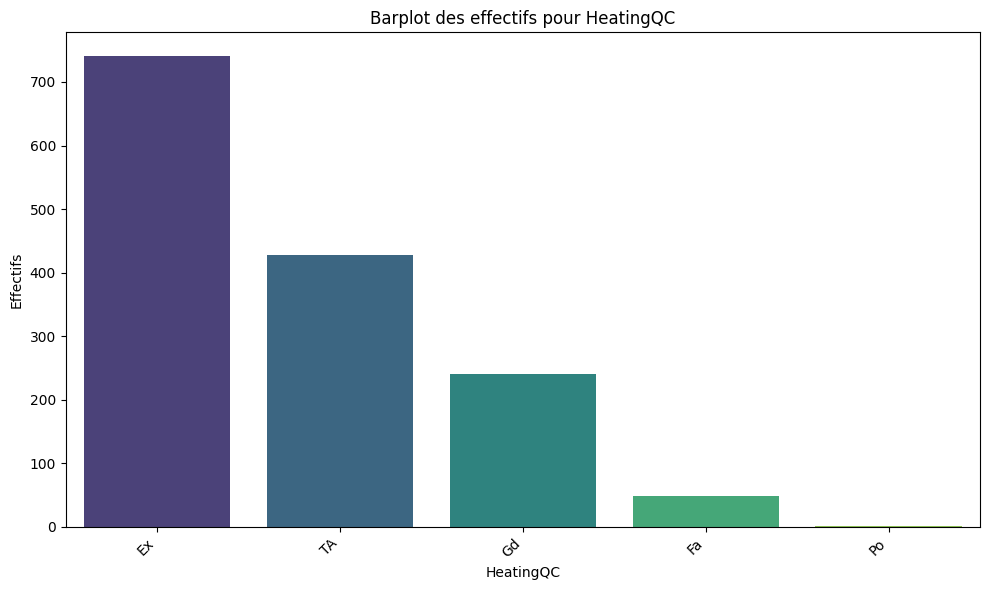

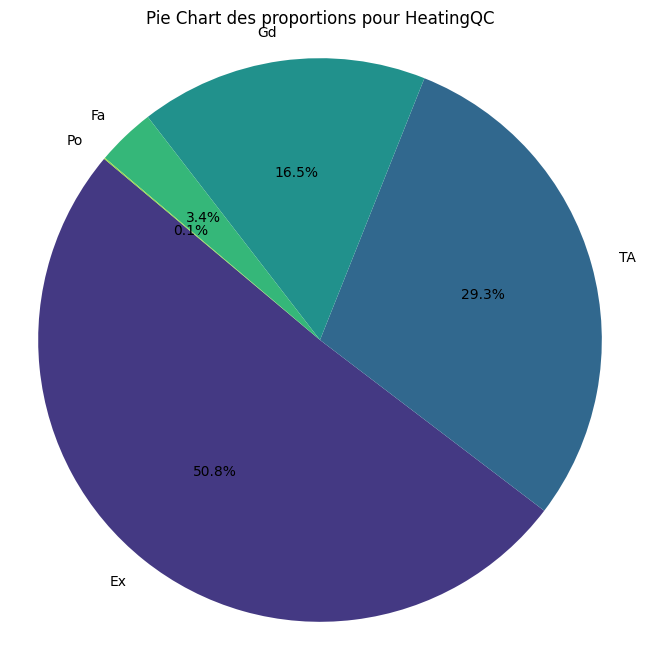


--- Analyse pour la variable qualitative : CentralAir ---

Tableau récapitulatif des effectifs et proportions:
            Effectifs  Proportions (%)
CentralAir                            
Y                1365        93.493151
N                  95         6.506849


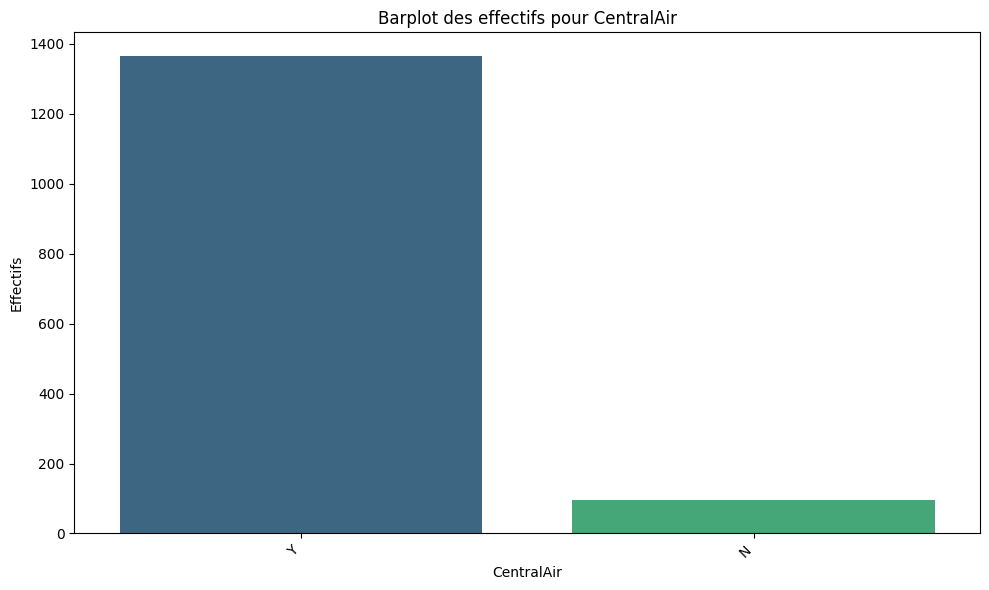

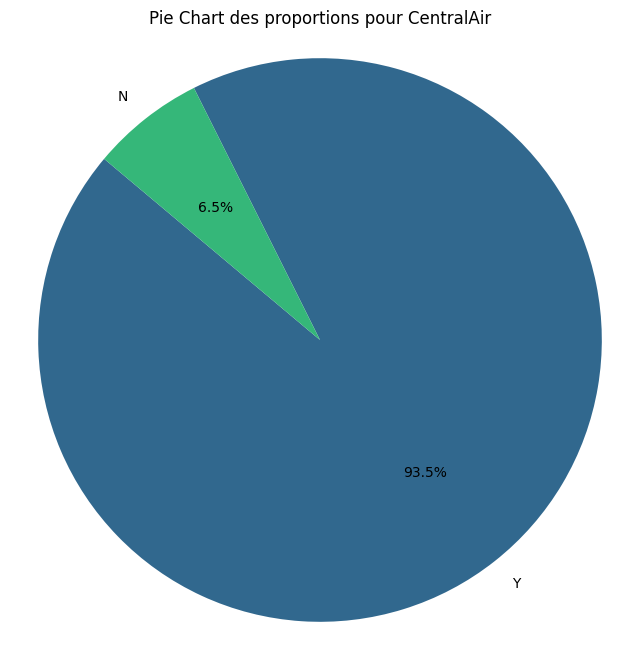


--- Analyse pour la variable qualitative : Electrical ---

Tableau récapitulatif des effectifs et proportions:
            Effectifs  Proportions (%)
Electrical                            
SBrkr            1335        91.438356
FuseA              94         6.438356
FuseF              27         1.849315
FuseP               3         0.205479
Mix                 1         0.068493


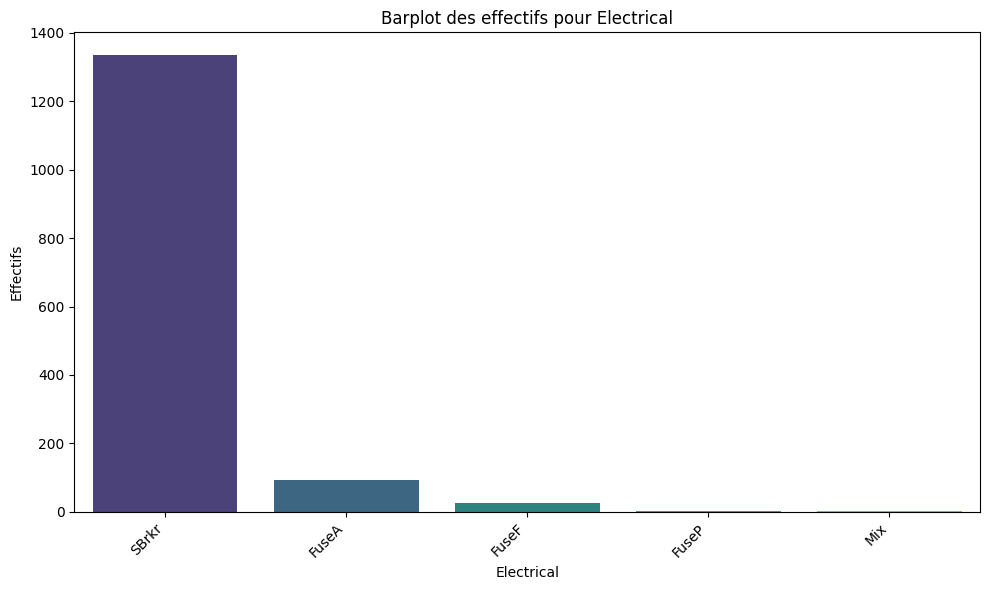

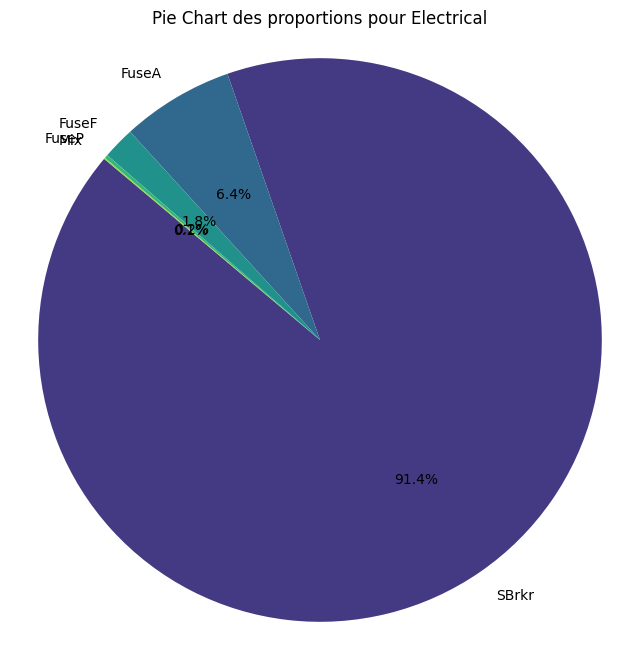


--- Analyse pour la variable qualitative : KitchenQual ---

Tableau récapitulatif des effectifs et proportions:
             Effectifs  Proportions (%)
KitchenQual                            
TA                 735        50.342466
Gd                 586        40.136986
Ex                 100         6.849315
Fa                  39         2.671233


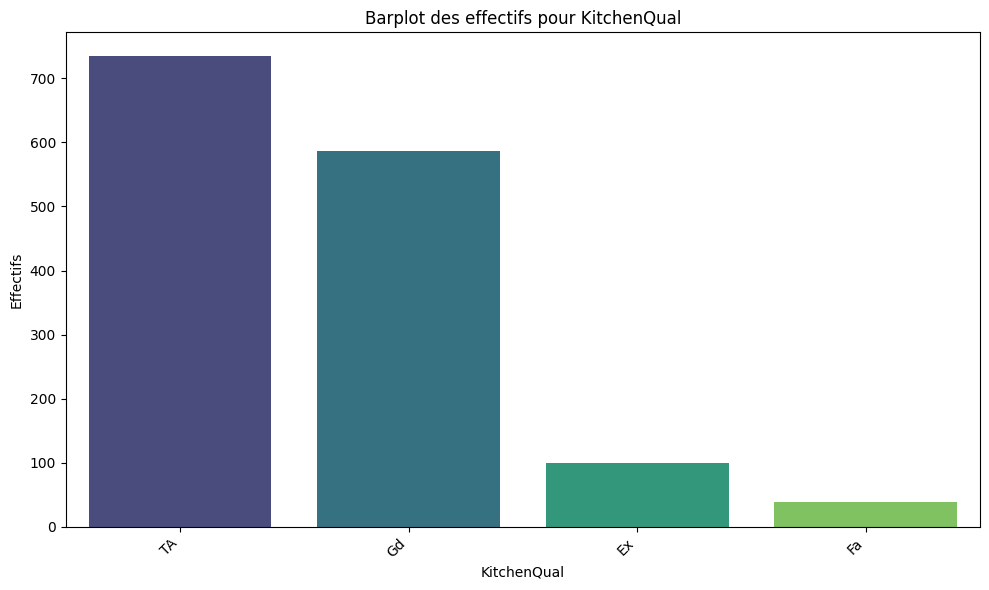

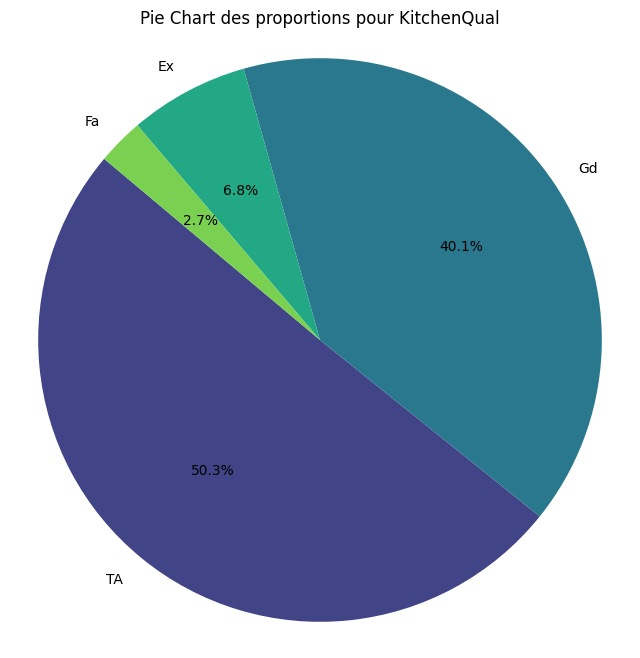


--- Analyse pour la variable qualitative : Functional ---

Tableau récapitulatif des effectifs et proportions:
            Effectifs  Proportions (%)
Functional                            
Typ              1360        93.150685
Min2               34         2.328767
Min1               31         2.123288
Mod                15         1.027397
Maj1               14         0.958904
Maj2                5         0.342466
Sev                 1         0.068493


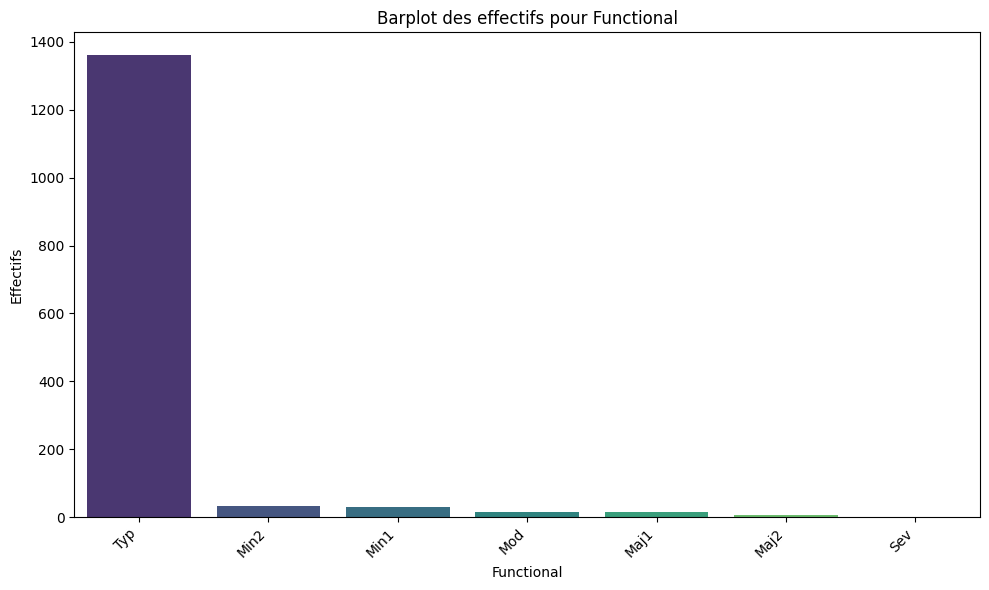

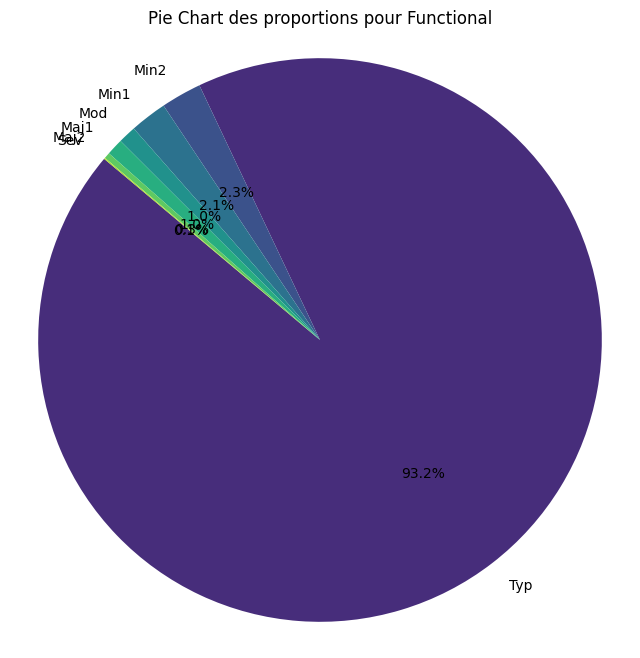


--- Analyse pour la variable qualitative : GarageType ---

Tableau récapitulatif des effectifs et proportions:
            Effectifs  Proportions (%)
GarageType                            
Attchd            951        65.136986
Detchd            387        26.506849
BuiltIn            88         6.027397
Basment            19         1.301370
CarPort             9         0.616438
2Types              6         0.410959


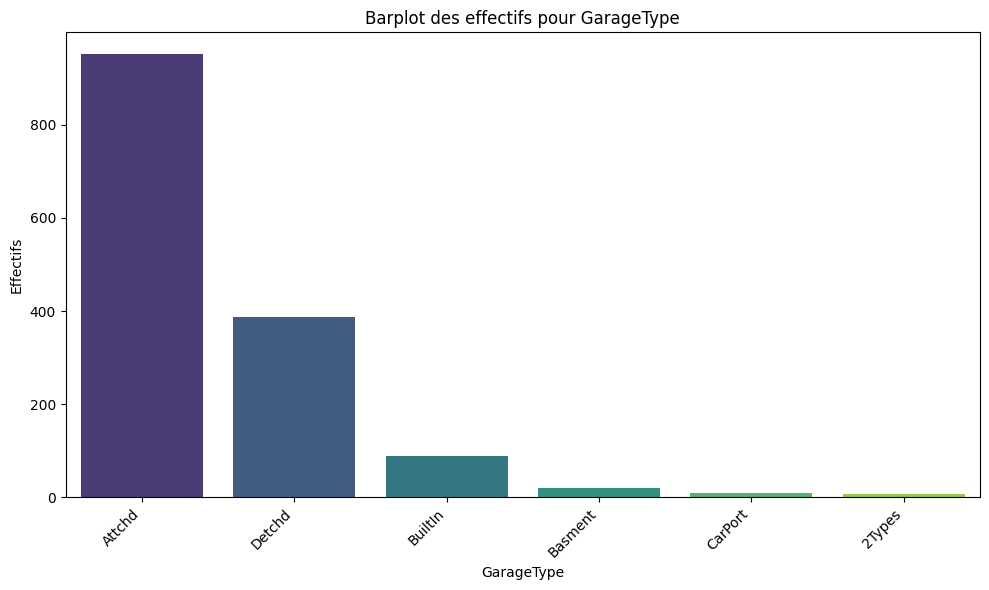

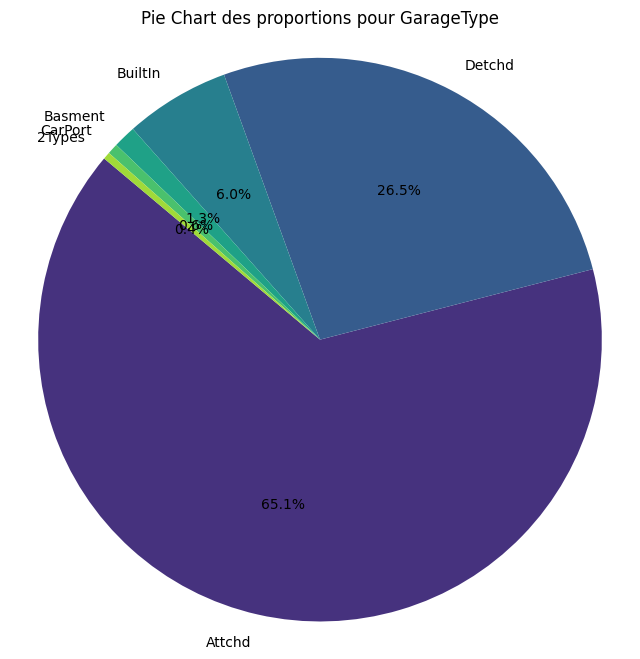


--- Analyse pour la variable qualitative : GarageFinish ---

Tableau récapitulatif des effectifs et proportions:
              Effectifs  Proportions (%)
GarageFinish                            
Unf                 686        46.986301
RFn                 422        28.904110
Fin                 352        24.109589


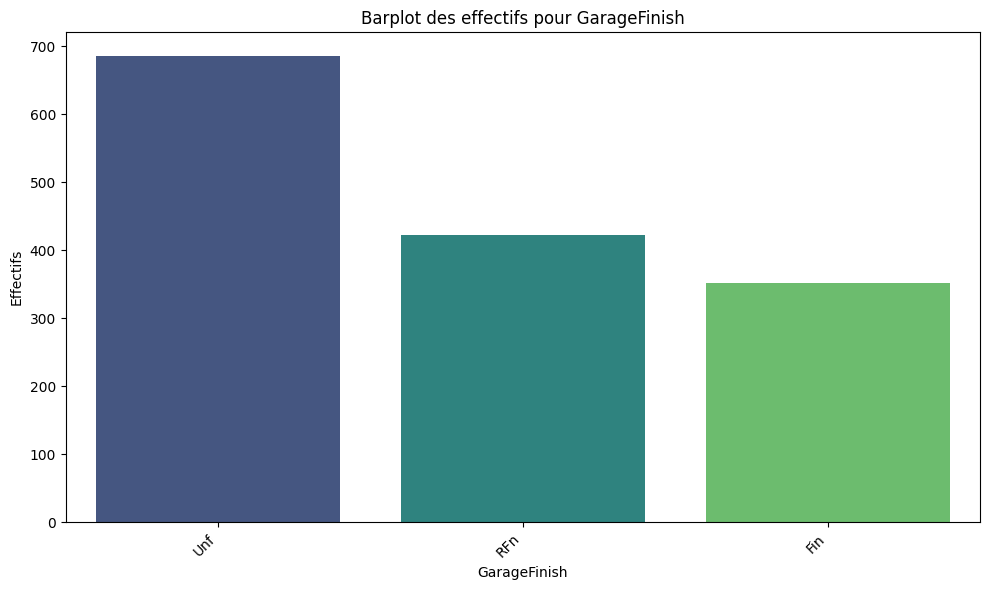

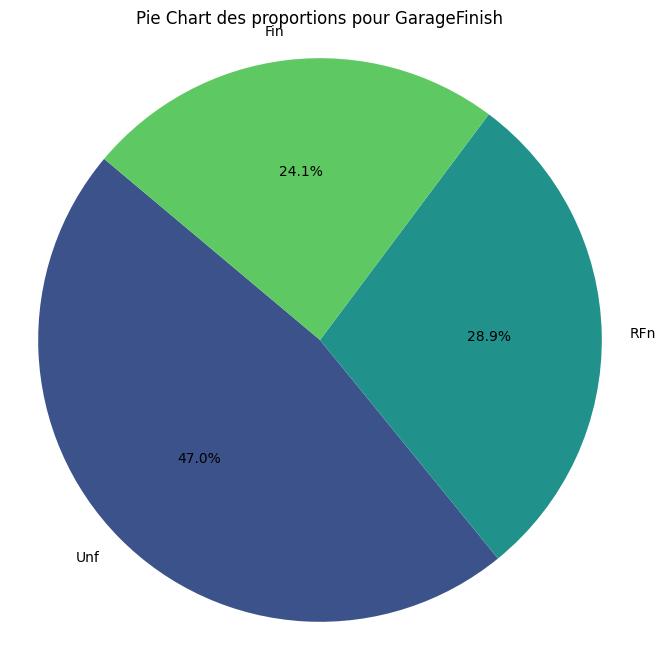


--- Analyse pour la variable qualitative : GarageQual ---

Tableau récapitulatif des effectifs et proportions:
            Effectifs  Proportions (%)
GarageQual                            
TA               1392        95.342466
Fa                 48         3.287671
Gd                 14         0.958904
Ex                  3         0.205479
Po                  3         0.205479


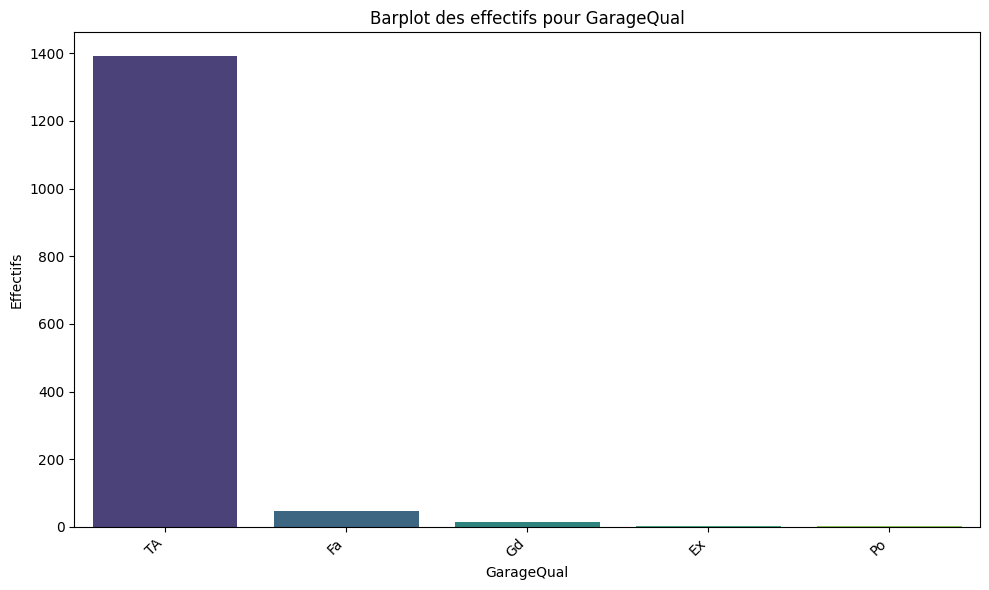

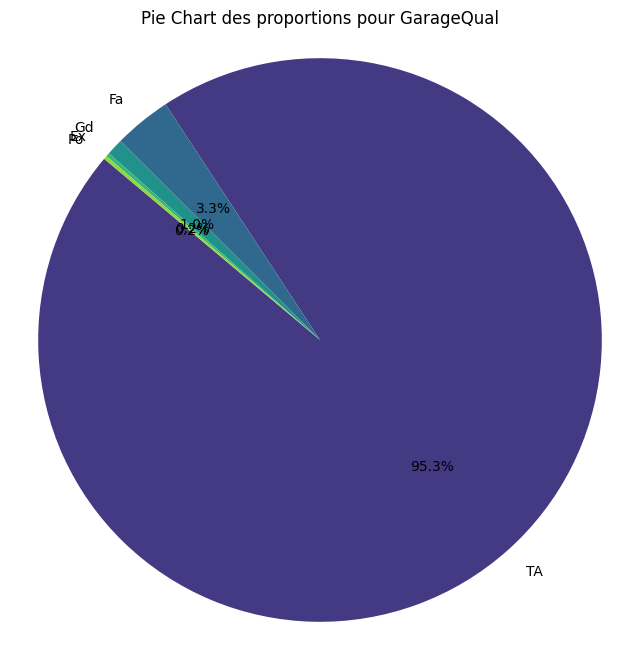


--- Analyse pour la variable qualitative : GarageCond ---

Tableau récapitulatif des effectifs et proportions:
            Effectifs  Proportions (%)
GarageCond                            
TA               1407        96.369863
Fa                 35         2.397260
Gd                  9         0.616438
Po                  7         0.479452
Ex                  2         0.136986


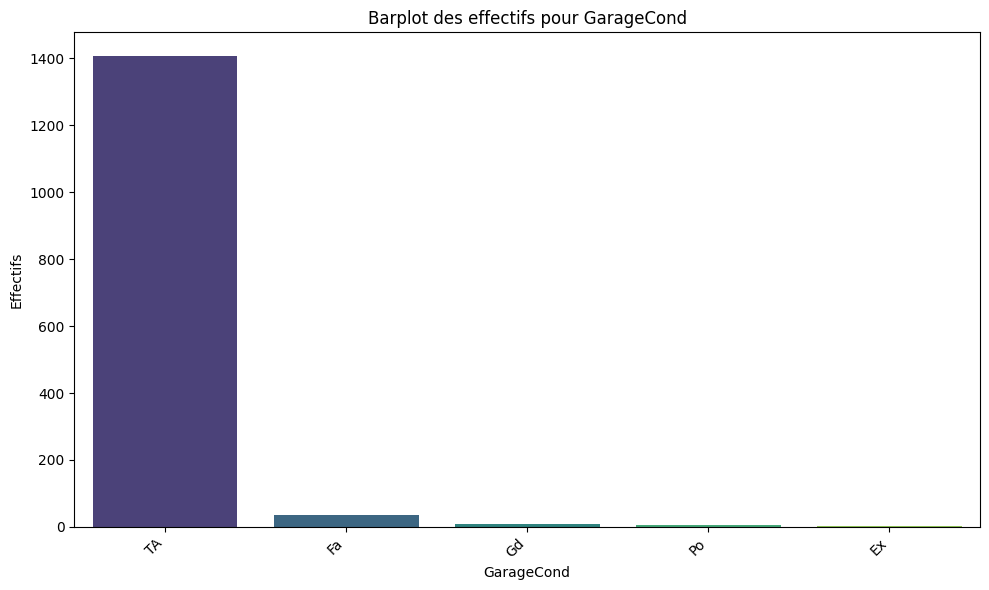

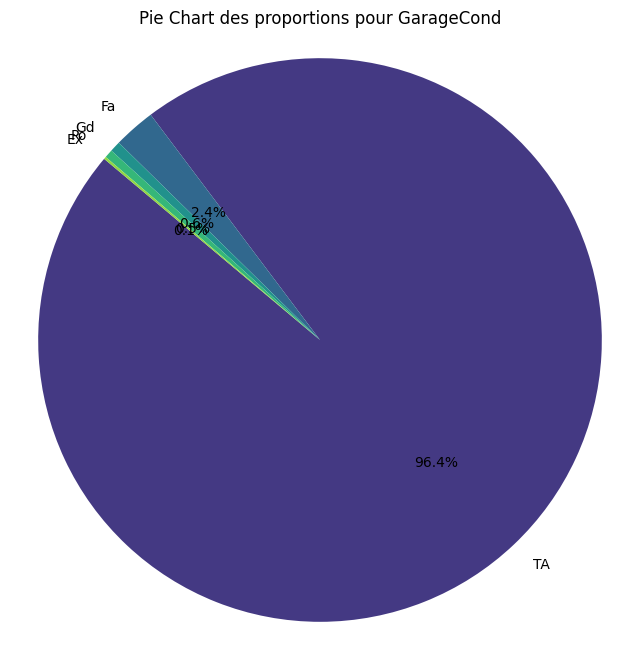


--- Analyse pour la variable qualitative : PavedDrive ---

Tableau récapitulatif des effectifs et proportions:
            Effectifs  Proportions (%)
PavedDrive                            
Y                1340        91.780822
N                  90         6.164384
P                  30         2.054795


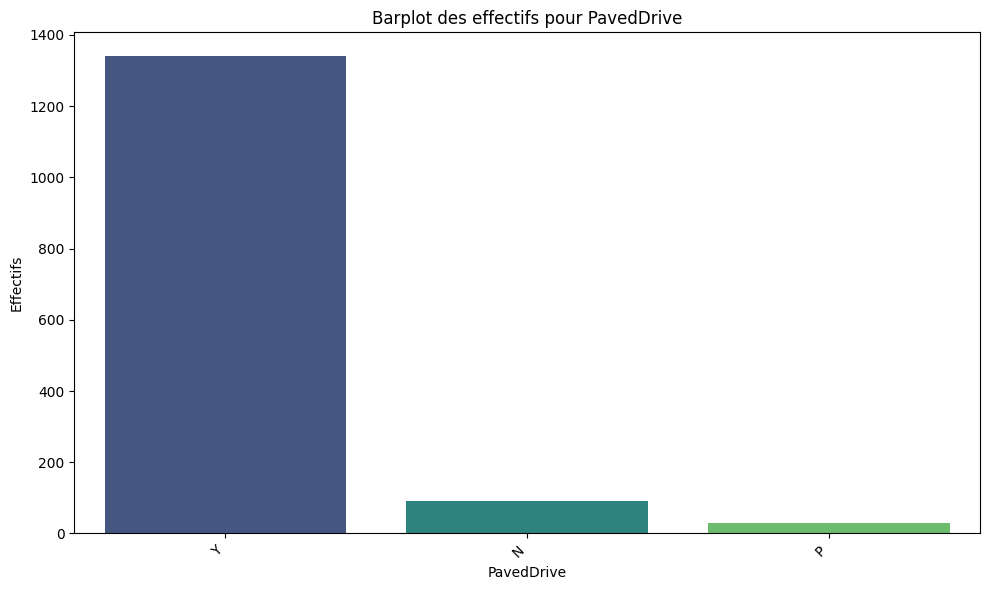

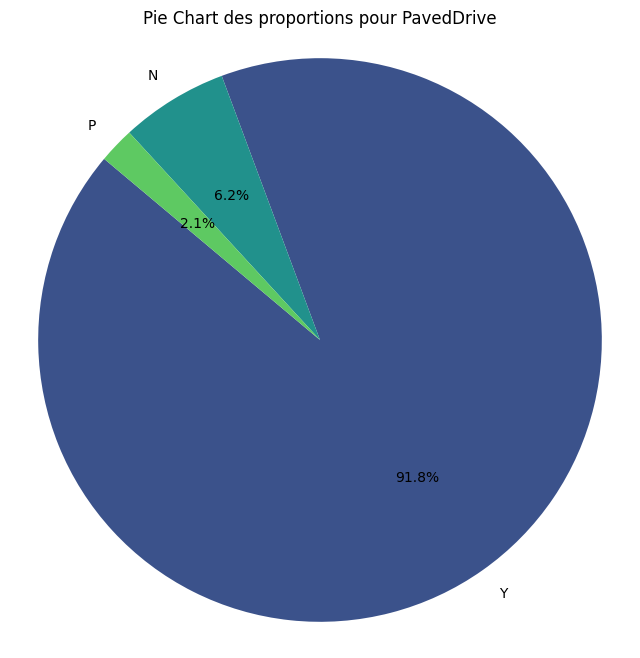


--- Analyse pour la variable qualitative : SaleType ---

Tableau récapitulatif des effectifs et proportions:
          Effectifs  Proportions (%)
SaleType                            
WD             1267        86.780822
New             122         8.356164
COD              43         2.945205
ConLD             9         0.616438
ConLI             5         0.342466
ConLw             5         0.342466
CWD               4         0.273973
Oth               3         0.205479
Con               2         0.136986


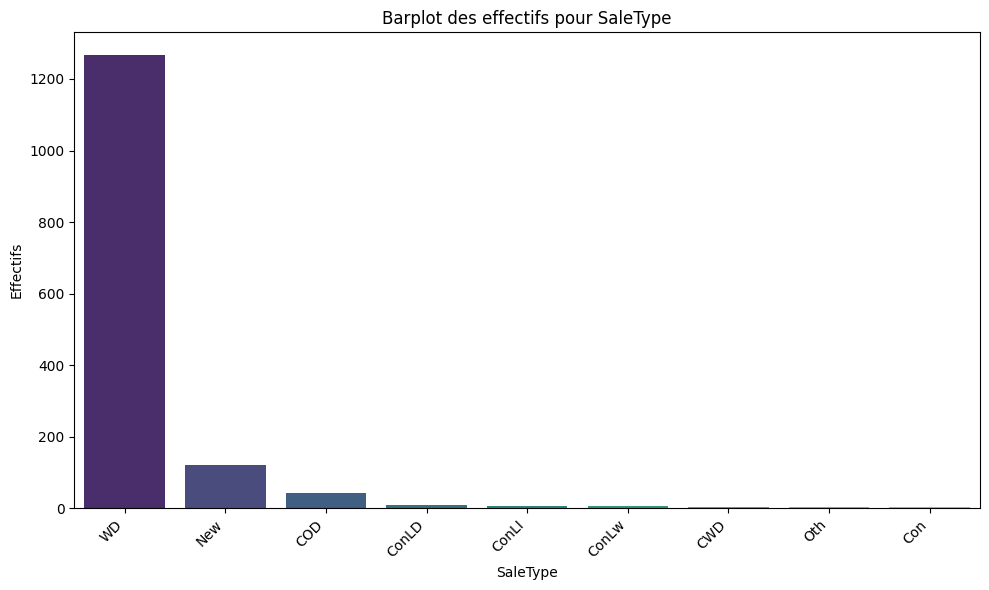

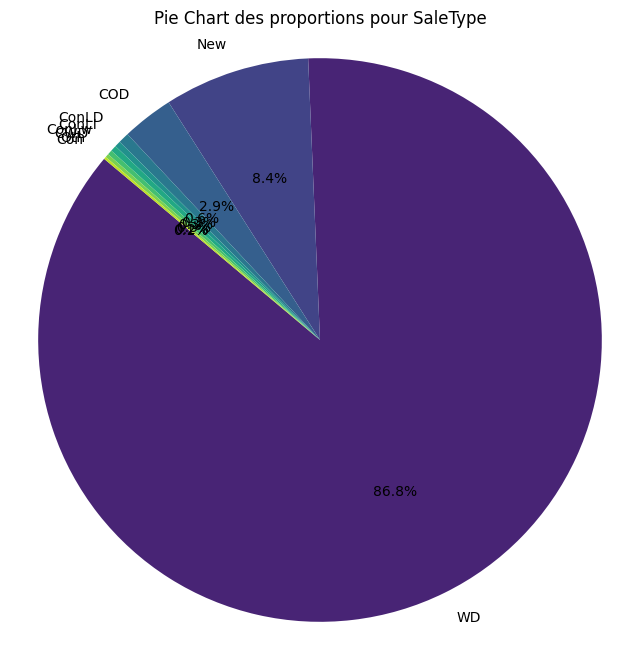


--- Analyse pour la variable qualitative : SaleCondition ---

Tableau récapitulatif des effectifs et proportions:
               Effectifs  Proportions (%)
SaleCondition                            
Normal              1198        82.054795
Partial              125         8.561644
Abnorml              101         6.917808
Family                20         1.369863
Alloca                12         0.821918
AdjLand                4         0.273973


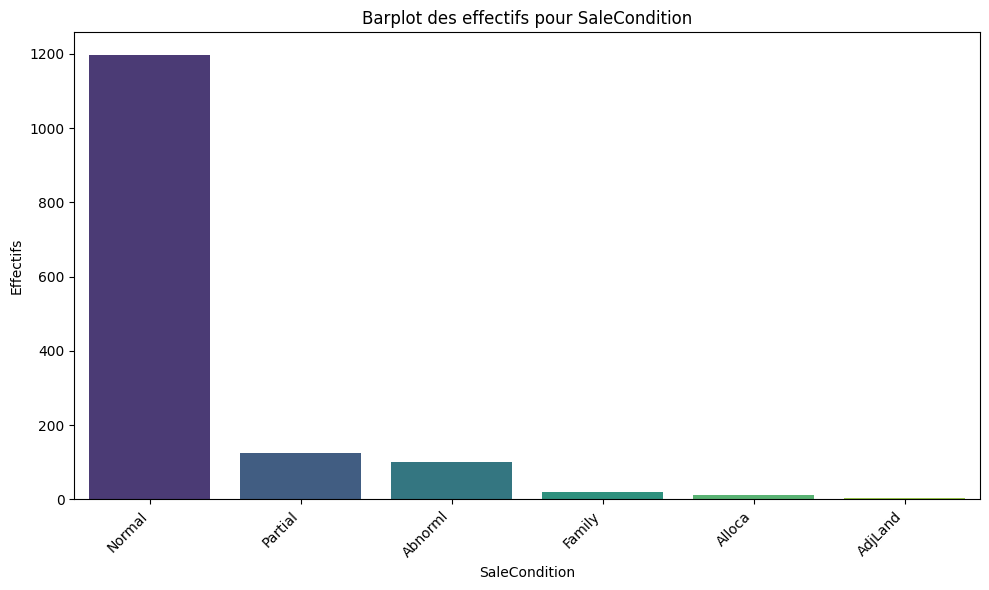

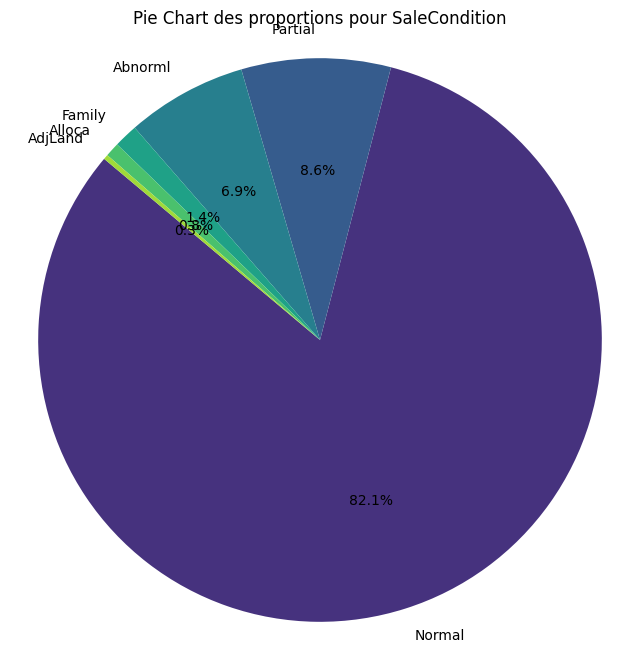

In [ ]:
# prompt: stp pour toutes les variables qualitatives fait un tableau avec les proportions, les effectifs un barplot et un piechart écrit en français stp

import pandas as pd
import matplotlib.pyplot as plt
# Analyse univariée pour les variables qualitatives

for col in qualitative_cols:
    print(f"\n--- Analyse pour la variable qualitative : {col} ---")

    # Calcul des effectifs et des proportions
    counts = df[col].value_counts()
    proportions = df[col].value_counts(normalize=True) * 100

    # Création du tableau récapitulatif
    summary_table = pd.DataFrame({'Effectifs': counts, 'Proportions (%)': proportions})
    print("\nTableau récapitulatif des effectifs et proportions:")
    print(summary_table)

    # Création du Barplot
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x=col, palette="viridis", order=counts.index)
    plt.title(f'Barplot des effectifs pour {col}')
    plt.xlabel(col)
    plt.ylabel('Effectifs')
    plt.xticks(rotation=45, ha='right') # Rotation des labels pour une meilleure lisibilité
    plt.tight_layout()
    plt.show()

    # Création du Pie Chart (si le nombre de catégories n'est pas trop élevé)
    if len(counts) <= 15: # Limite arbitraire pour la lisibilité du pie chart
        plt.figure(figsize=(8, 8))
        plt.pie(proportions, labels=proportions.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette("viridis", len(counts)))
        plt.title(f'Pie Chart des proportions pour {col}')
        plt.axis('equal') # Assure que le pie chart est circulaire
        plt.show()
    else:
        print(f"Trop de catégories ({len(counts)}) pour afficher un Pie Chart lisible pour {col}.")

Etape 4: Feature Engineering - Sélection des variables via une approche par filtrage


Correlation Matrix for Quantitative Variables (excluding 'Id'):
               MSSubClass   LotArea  OverallQual  OverallCond  YearBuilt  \
MSSubClass       1.000000 -0.139781     0.032628    -0.059316   0.027850   
LotArea         -0.139781  1.000000     0.105806    -0.005636   0.014228   
OverallQual      0.032628  0.105806     1.000000    -0.091932   0.572323   
OverallCond     -0.059316 -0.005636    -0.091932     1.000000  -0.375983   
YearBuilt        0.027850  0.014228     0.572323    -0.375983   1.000000   
YearRemodAdd     0.040581  0.013788     0.550684     0.073741   0.592855   
MasVnrArea       0.023573  0.103321     0.407252    -0.125694   0.311600   
BsmtFinSF1      -0.069836  0.214103     0.239666    -0.046231   0.249503   
BsmtFinSF2      -0.065649  0.111170    -0.059119     0.040229  -0.049107   
BsmtUnfSF       -0.140759 -0.002618     0.308159    -0.136841   0.149040   
TotalBsmtSF     -0.238518  0.260833     0.537808    -0.171098   0.391452   
1stFlrSF        -0.2517

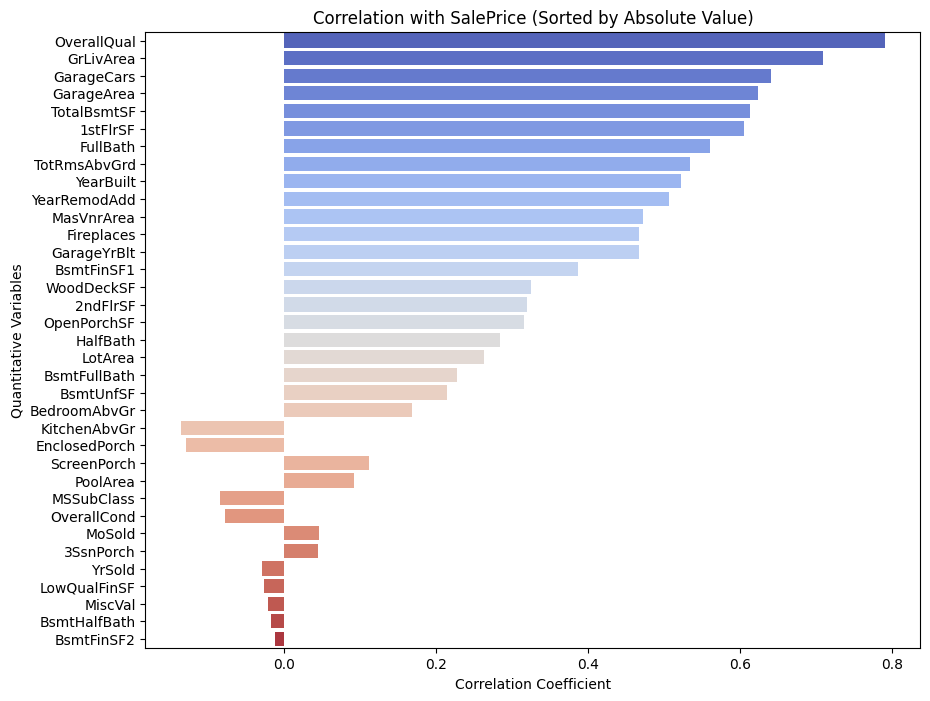


Scatter Plots for the 2 Most Correlated Quantitative Variables with SalePrice:


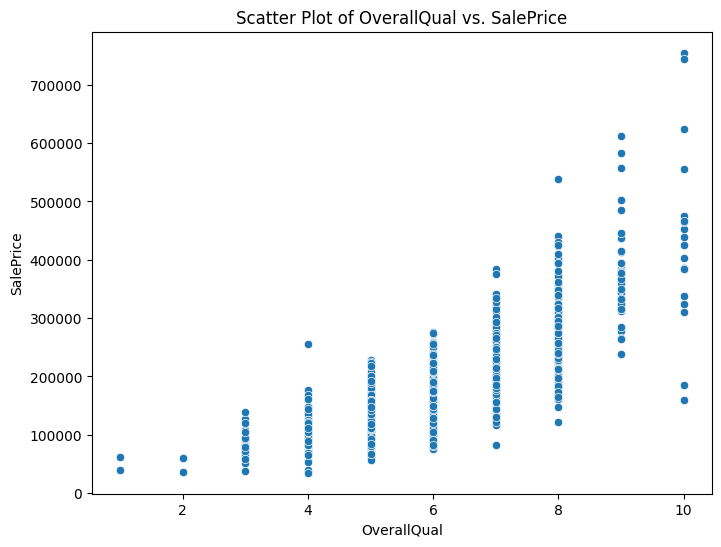

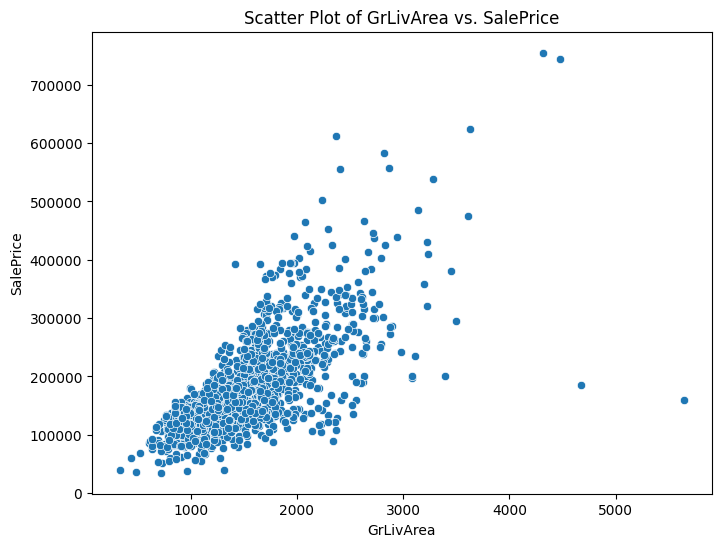

In [ ]:
# prompt: Stp pour toute les variables quantitave à l'exception de l'id peux tu créer une matrice de corrélation et me ressortir un graphique qui classe les varaibles de la plus corrélée en valeur absolue à la moins corrélé à la variable cible (sale prices). Ppour les variables deux à fait des nuages de points

import matplotlib.pyplot as plt
# Identify quantitative columns again, excluding 'Id'
quantitative_cols_no_id = quantitative_cols.drop('Id')

# Calculate the correlation matrix for quantitative variables (excluding 'Id')
correlation_matrix = df[quantitative_cols_no_id].corr()

# Display the correlation matrix
print("\nCorrelation Matrix for Quantitative Variables (excluding 'Id'):")
print(correlation_matrix)

# Get correlations with the target variable 'SalePrice'
sale_price_correlations = correlation_matrix['SalePrice'].drop('SalePrice') # Exclude self-correlation

# Sort correlations by absolute value in descending order
sorted_correlations = sale_price_correlations.abs().sort_values(ascending=False)

# Get the actual correlation values in the sorted order
sorted_sale_price_correlations = sale_price_correlations[sorted_correlations.index]

# Create a bar plot of correlations with SalePrice, sorted by absolute value
plt.figure(figsize=(10, 8))
sns.barplot(x=sorted_sale_price_correlations.values, y=sorted_sale_price_correlations.index, palette='coolwarm')
plt.title('Correlation with SalePrice (Sorted by Absolute Value)')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Quantitative Variables')
plt.show()

# Create scatter plots for the top 2 most correlated quantitative variables with SalePrice
top_2_correlated_vars = sorted_correlations.head(2).index

print("\nScatter Plots for the 2 Most Correlated Quantitative Variables with SalePrice:")
for col in top_2_correlated_vars:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=df, x=col, y='SalePrice')
    plt.title(f'Scatter Plot of {col} vs. SalePrice')
    plt.xlabel(col)
    plt.ylabel('SalePrice')
    plt.show()


--- Analyse de la liaison entre 'MSZoning' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'MSZoning':
  MSZoning           mean    median           std  count
0  C (all)   74528.000000   74700.0  33791.092031     10
1       FV  214014.061538  205950.0  52369.662067     65
2       RH  131558.375000  136500.0  35714.118435     16
3       RL  191004.994787  174000.0  80766.341319   1151
4       RM  126316.830275  120500.0  48521.689833    218


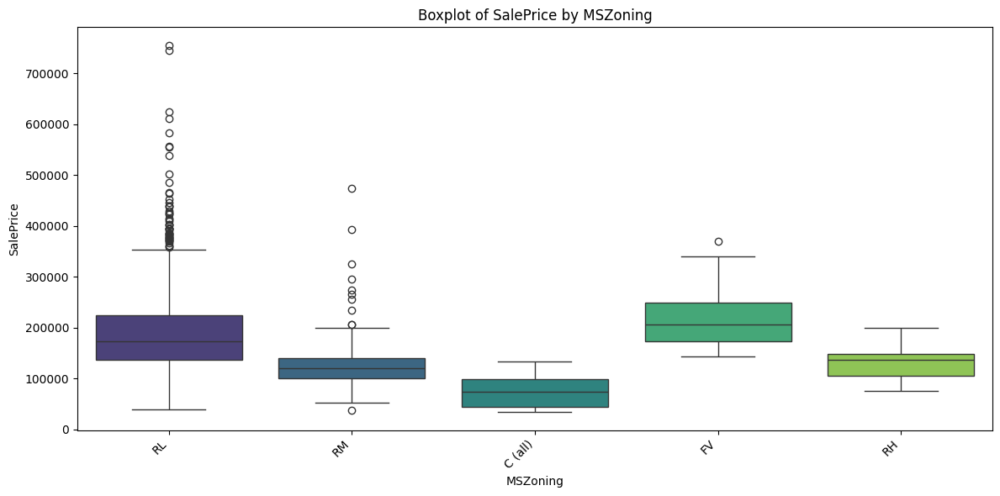


Kruskal-Wallis Test pour 'MSZoning':
Statistic: 270.0702, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'MSZoning' (Sous réserve des hypothèses):
Statistic: 43.8403, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'Street' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'Street':
  Street           mean    median           std  count
0   Grvl  130190.500000  114250.0  65446.253991      6
1   Pave  181130.538514  163000.0  79446.597317   1454


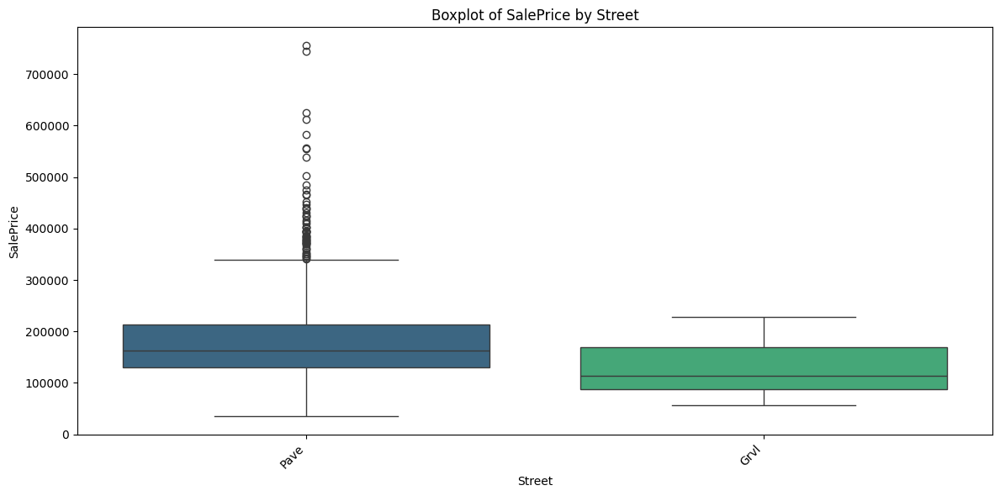


Kruskal-Wallis Test pour 'Street':
Statistic: 3.0624, p-value: 0.0801
Échec du rejet de H0 : Pas de différence significative démontrée entre les médianes de 'SalePrice' pour les catégories de '{col}'.

ANOVA Test pour 'Street' (Sous réserve des hypothèses):
Statistic: 2.4593, p-value: 0.1170
Échec du rejet de H0 : Pas de différence significative démontrée entre les moyennes de 'SalePrice' pour les catégories de '{col}'.

Pairwise Tests (if only 2 groups):
Wilcoxon Test (2 groups): Statistic=1.7499, p-value=0.0801
Student's t-test (2 groups, Welch): Statistic=1.9008, p-value=0.1150

--- Analyse de la liaison entre 'LotShape' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'LotShape':
  LotShape           mean    median           std  count
0      IR1  206101.665289  189000.0  85858.489559    484
1      IR2  239833.365854  221000.0  99669.427362     41
2      IR3  216036.500000  203570.0  82540.334855     10
3      Reg  164754.818378  146000.0  69673.427215

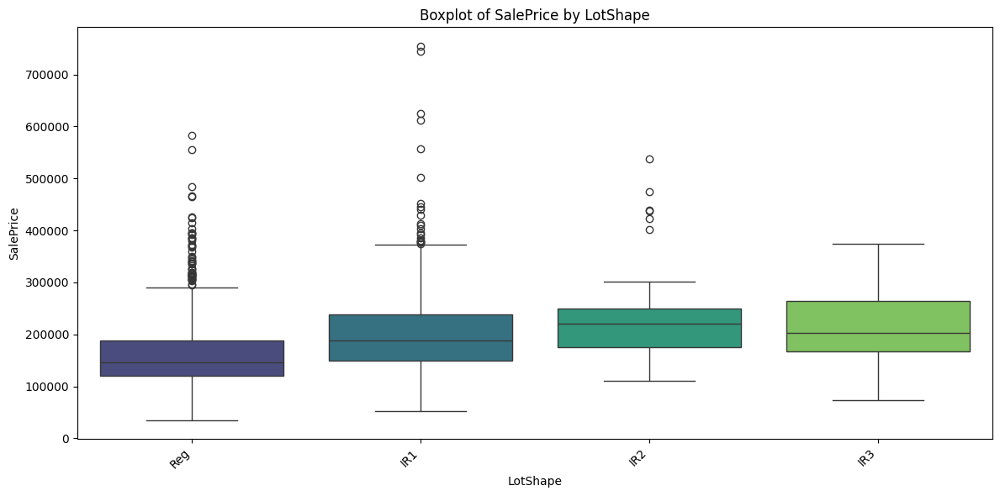


Kruskal-Wallis Test pour 'LotShape':
Statistic: 150.9542, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'LotShape' (Sous réserve des hypothèses):
Statistic: 40.1329, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'LandContour' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'LandContour':
  LandContour           mean    median            std  count
0         Bnk  143104.079365  139400.0   49361.244074     63
1         HLS  231533.940000  222250.0  101790.139741     50
2         Low  203661.111111  190000.0   83935.353620     36
3         Lvl  180183.746758  162900.0

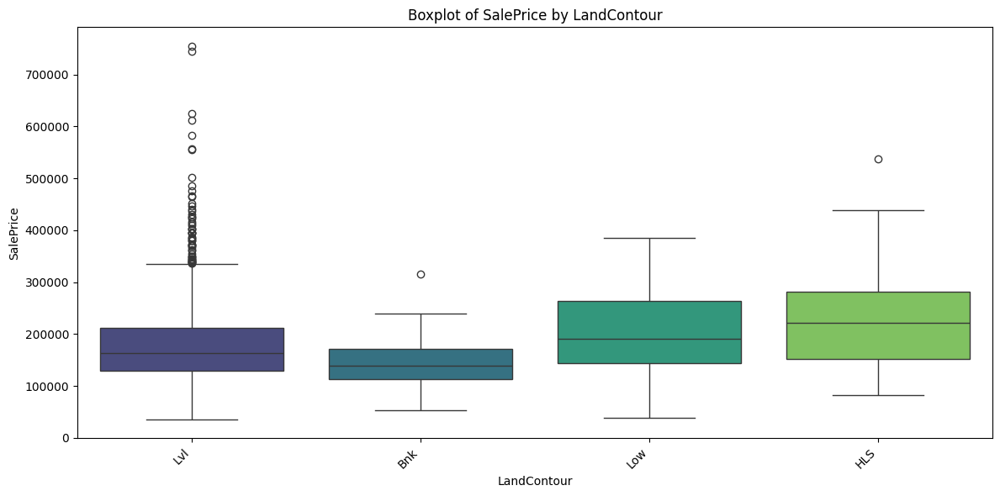


Kruskal-Wallis Test pour 'LandContour':
Statistic: 35.3096, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'LandContour' (Sous réserve des hypothèses):
Statistic: 12.8502, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'Utilities' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'Utilities':
  Utilities          mean    median           std  count
0    AllPub  180950.95682  163000.0  79461.599814   1459
1    NoSeWa  137500.00000  137500.0           NaN      1


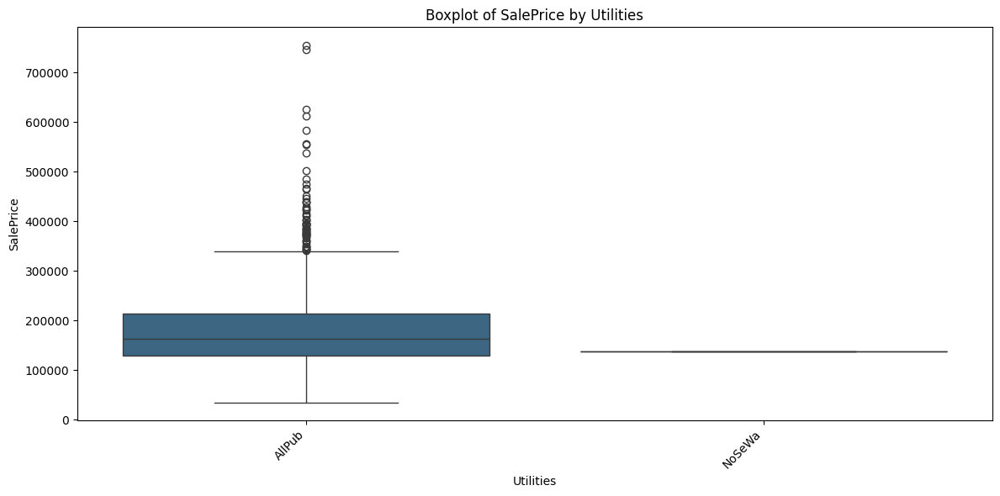

Pas assez de groupes (1 < 2) avec suffisamment de données pour effectuer des tests pour 'Utilities'.

--- Analyse de la liaison entre 'LotConfig' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'LotConfig':
  LotConfig           mean    median           std  count
0    Corner  181623.425856  160000.0  84466.041222    263
1   CulDSac  223854.617021  199262.0  93117.546586     94
2       FR2  177934.574468  165000.0  62788.926829     47
3       FR3  208475.000000  195450.0  78379.222374      4
4    Inside  176938.047529  159697.5  76426.805787   1052


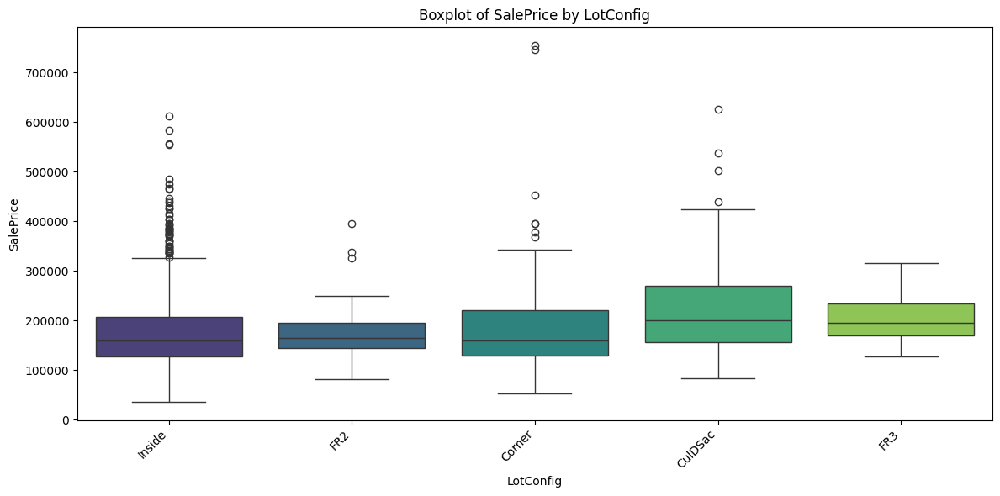


Kruskal-Wallis Test pour 'LotConfig':
Statistic: 35.7239, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'LotConfig' (Sous réserve des hypothèses):
Statistic: 7.8100, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'LandSlope' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'LandSlope':
  LandSlope           mean    median           std  count
0       Gtl  179956.799566  161875.0  78669.369151   1382
1       Mod  196734.138462  186700.0  92375.358116     65
2       Sev  204379.230769  185000.0  86729.922409     13


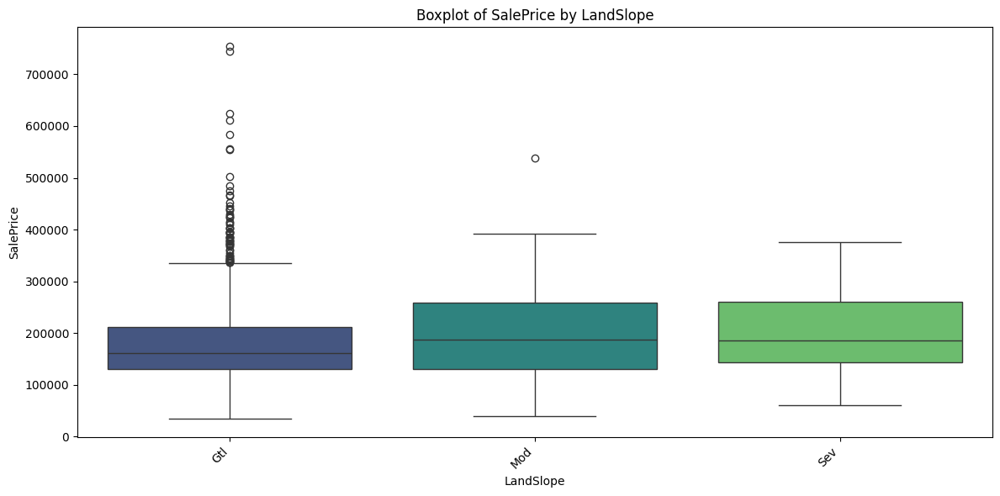


Kruskal-Wallis Test pour 'LandSlope':
Statistic: 3.9388, p-value: 0.1395
Échec du rejet de H0 : Pas de différence significative démontrée entre les médianes de 'SalePrice' pour les catégories de '{col}'.

ANOVA Test pour 'LandSlope' (Sous réserve des hypothèses):
Statistic: 1.9588, p-value: 0.1414
Échec du rejet de H0 : Pas de différence significative démontrée entre les moyennes de 'SalePrice' pour les catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'Neighborhood' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'Neighborhood':
   Neighborhood           mean    median            std  count
0       Blmngtn  194870.882353  191000.0   30393.229219     17
1       Blueste  137500.000000  137500.0   19091.883092      2
2        BrDale  104493.750000  106000.0   14330.176493     16
3       BrkSide  124834.051724  124300.0 

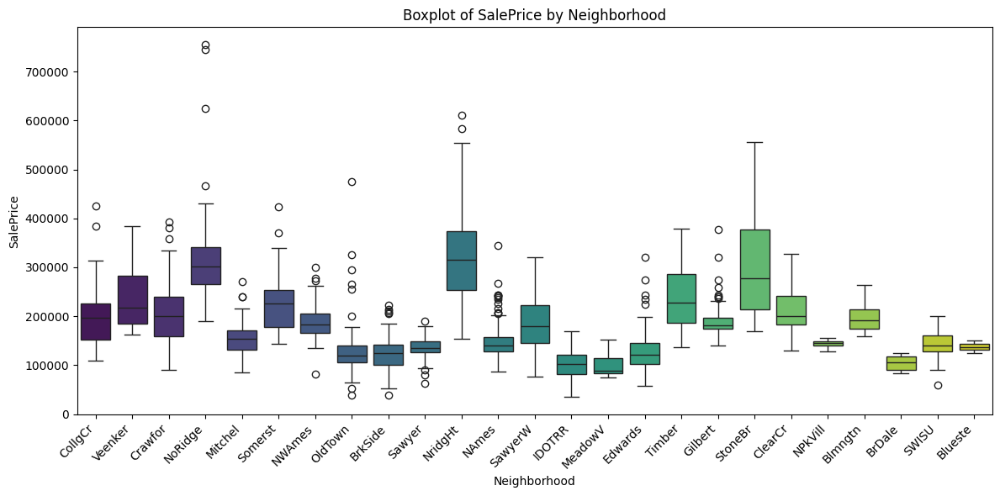


Kruskal-Wallis Test pour 'Neighborhood':
Statistic: 868.5324, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'Neighborhood' (Sous réserve des hypothèses):
Statistic: 71.7849, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'Condition1' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'Condition1':
  Condition1           mean    median           std  count
0     Artery  135091.666667  119550.0  66226.660548     48
1      Feedr  142475.481481  140000.0  42157.290117     81
2       Norm  184495.492063  166500.0  81256.980125   1260
3       PosA  225875.000000  212500.0  5

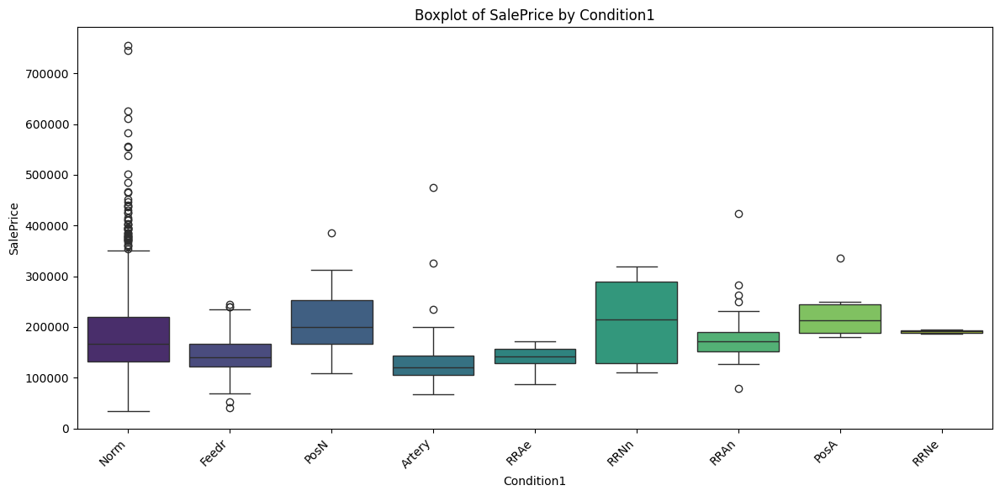


Kruskal-Wallis Test pour 'Condition1':
Statistic: 74.4039, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'Condition1' (Sous réserve des hypothèses):
Statistic: 6.1180, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'Condition2' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'Condition2':
  Condition2           mean    median            std  count
0     Artery  106500.000000  106500.0   16263.455967      2
1      Feedr  121166.666667  127500.0   33544.994659      6
2       Norm  181169.405536  163500.0   79337.735547   1445
3       PosA  325000.000000  325000.0     

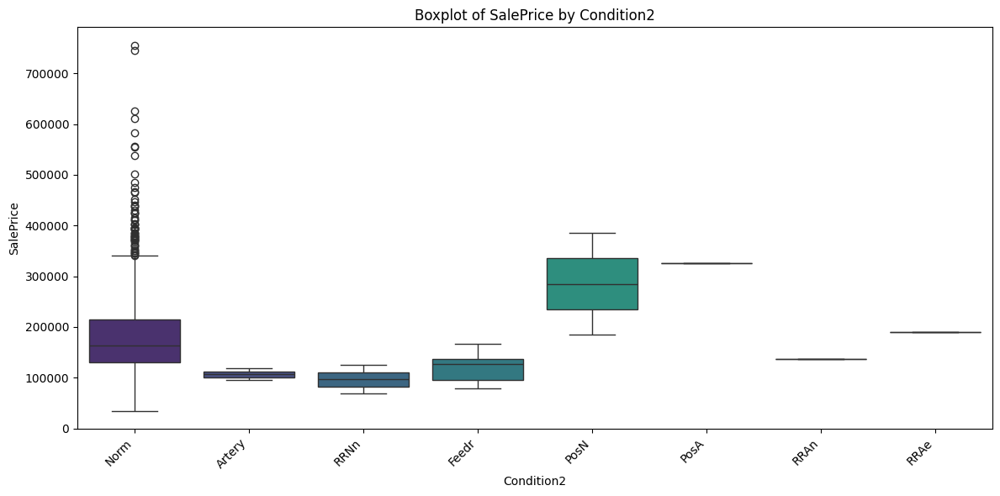


Kruskal-Wallis Test pour 'Condition2':
Statistic: 14.6229, p-value: 0.0056
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'Condition2' (Sous réserve des hypothèses):
Statistic: 2.7220, p-value: 0.0282
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'BldgType' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'BldgType':
  BldgType           mean    median           std  count
0     1Fam  185763.807377  167900.0  82648.502922   1220
1   2fmCon  128432.258065  127500.0  35458.545158     31
2   Duplex  133541.076923  135980.0  27833.249197     52
3    Twnhs  135911.627907  137500.0  41013.222080     43
4

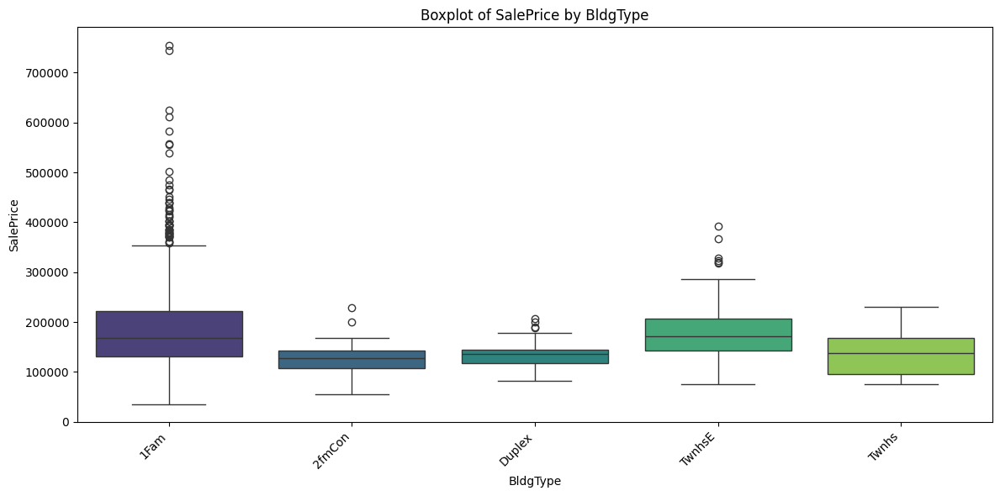


Kruskal-Wallis Test pour 'BldgType':
Statistic: 69.8006, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'BldgType' (Sous réserve des hypothèses):
Statistic: 13.0111, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'HouseStyle' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'HouseStyle':
  HouseStyle           mean    median            std  count
0     1.5Fin  143116.740260  132000.0   54277.941119    154
1     1.5Unf  110150.000000  111250.0   19036.473090     14
2     1Story  175985.477961  154750.0   77055.715011    726
3     2.5Fin  220000.000000  194000.0  118211

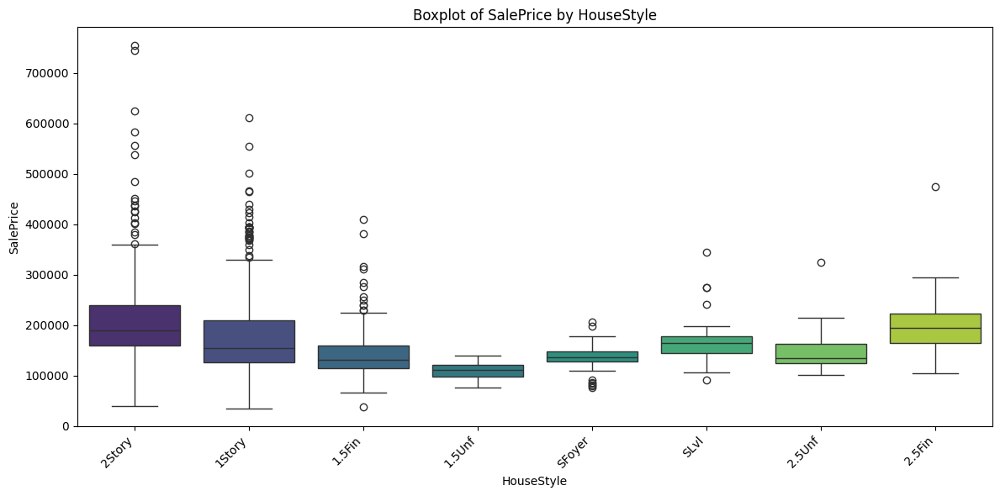


Kruskal-Wallis Test pour 'HouseStyle':
Statistic: 185.4294, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'HouseStyle' (Sous réserve des hypothèses):
Statistic: 19.5950, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'RoofStyle' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'RoofStyle':
  RoofStyle           mean    median            std  count
0      Flat  194690.000000  185000.0   62522.963515     13
1     Gable  171483.956179  160000.0   66331.237296   1141
2   Gambrel  148909.090909  139000.0   67013.527807     11
3       Hip  218876.933566  176500.0  111549.6

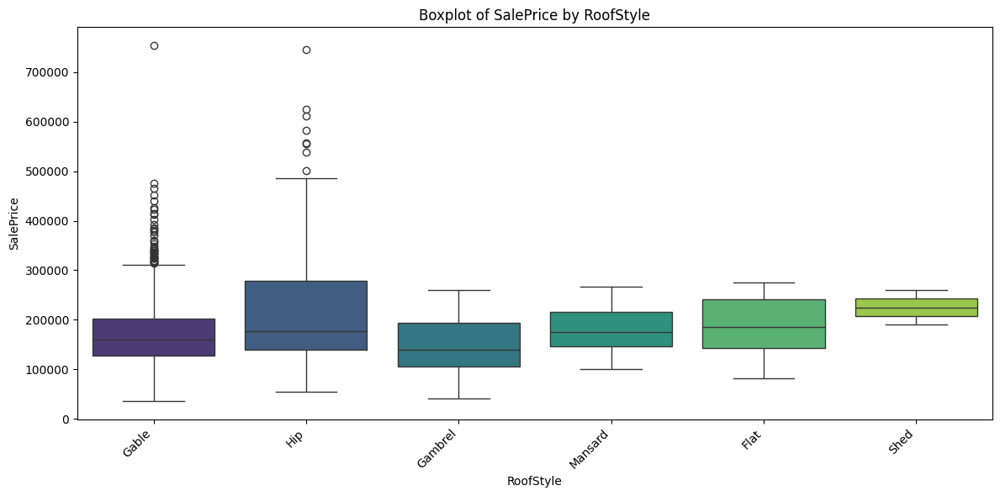


Kruskal-Wallis Test pour 'RoofStyle':
Statistic: 39.8775, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'RoofStyle' (Sous réserve des hypothèses):
Statistic: 17.8055, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'RoofMatl' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'RoofMatl':
  RoofMatl           mean    median            std  count
0  ClyTile  160000.000000  160000.0            NaN      1
1  CompShg  179803.679219  162000.0   77722.388636   1434
2  Membran  241500.000000  241500.0            NaN      1
3    Metal  180000.000000  180000.0            NaN     

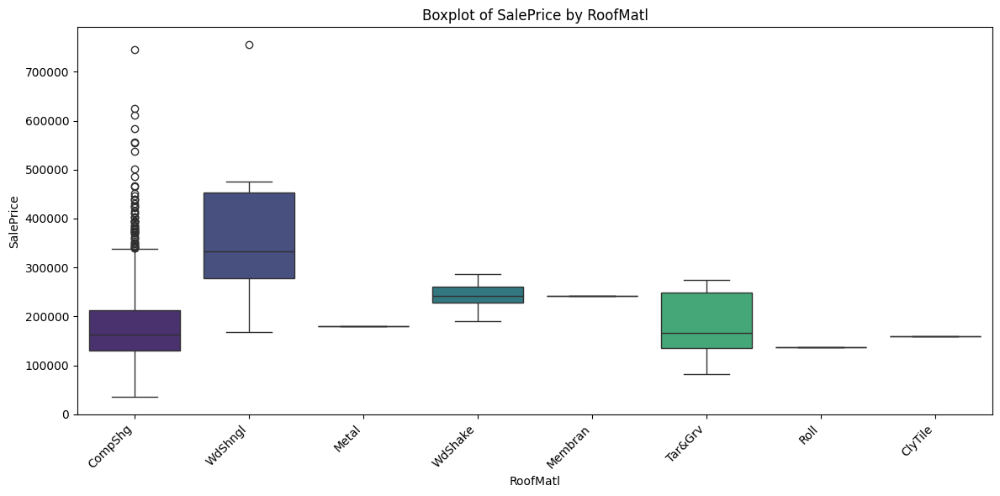


Kruskal-Wallis Test pour 'RoofMatl':
Statistic: 16.9304, p-value: 0.0007
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'RoofMatl' (Sous réserve des hypothèses):
Statistic: 15.3694, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'Exterior1st' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'Exterior1st':
   Exterior1st           mean    median            std  count
0      AsbShng  107385.550000  108000.0   33756.480660     20
1      AsphShn  100000.000000  100000.0            NaN      1
2      BrkComm   71000.000000   71000.0   15556.349186      2
3      BrkFace  194573.000000  1657

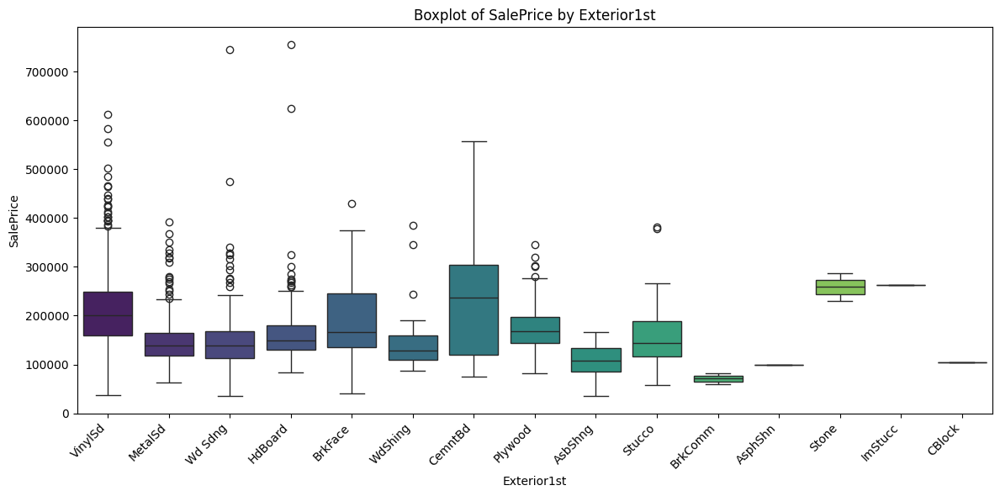


Kruskal-Wallis Test pour 'Exterior1st':
Statistic: 298.9538, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'Exterior1st' (Sous réserve des hypothèses):
Statistic: 23.3696, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'Exterior2nd' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'Exterior2nd':
   Exterior2nd           mean    median            std  count
0      AsbShng  114060.550000  111000.0   42315.043608     20
1      AsphShn  138000.000000  139000.0   37509.998667      3
2      Brk Cmn  126714.285714  147000.0   38693.084161      7
3      BrkFace  195818.00000

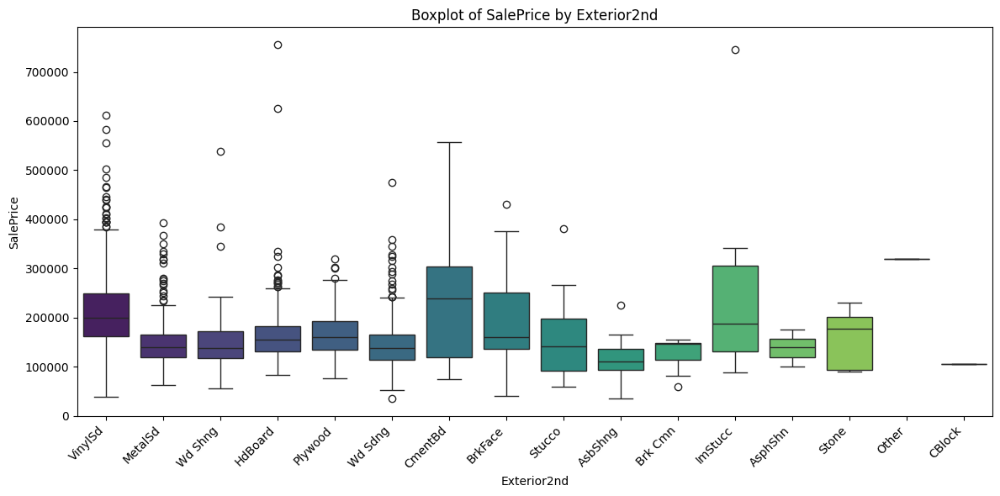


Kruskal-Wallis Test pour 'Exterior2nd':
Statistic: 280.4219, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'Exterior2nd' (Sous réserve des hypothèses):
Statistic: 19.8393, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'ExterQual' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'ExterQual':
  ExterQual           mean    median            std  count
0        Ex  367360.961538  364606.5  116401.264200     52
1        Fa   87985.214286   82250.0   39826.918794     14
2        Gd  231633.510246  220000.0   71188.873899    488
3        TA  144341.313466  139450.0   42471

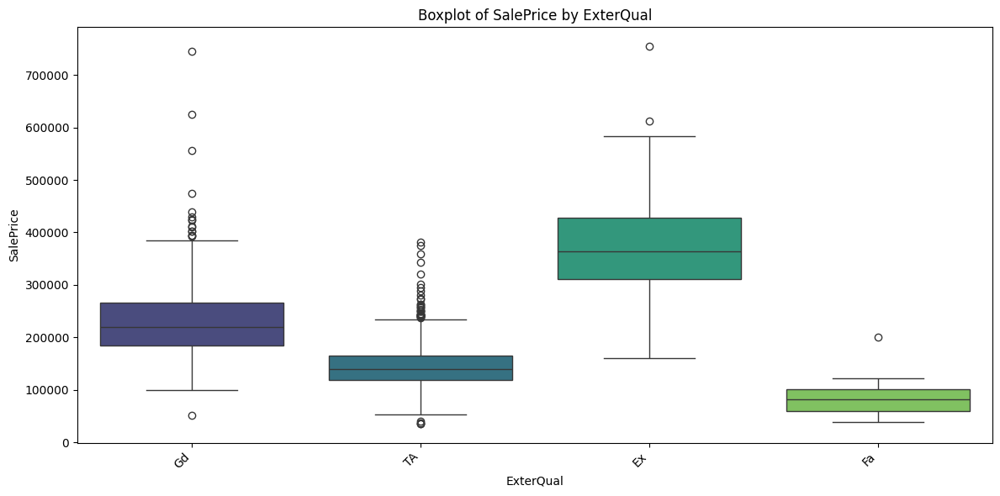


Kruskal-Wallis Test pour 'ExterQual':
Statistic: 683.4401, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'ExterQual' (Sous réserve des hypothèses):
Statistic: 443.3348, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'ExterCond' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'ExterCond':
  ExterCond           mean    median            std  count
0        Ex  201333.333333  161000.0  109235.220205      3
1        Fa  102595.142857   95750.0   40094.383940     28
2        Gd  168897.568493  151250.0   72608.303632    146
3        Po   76500.000000   76500.0           

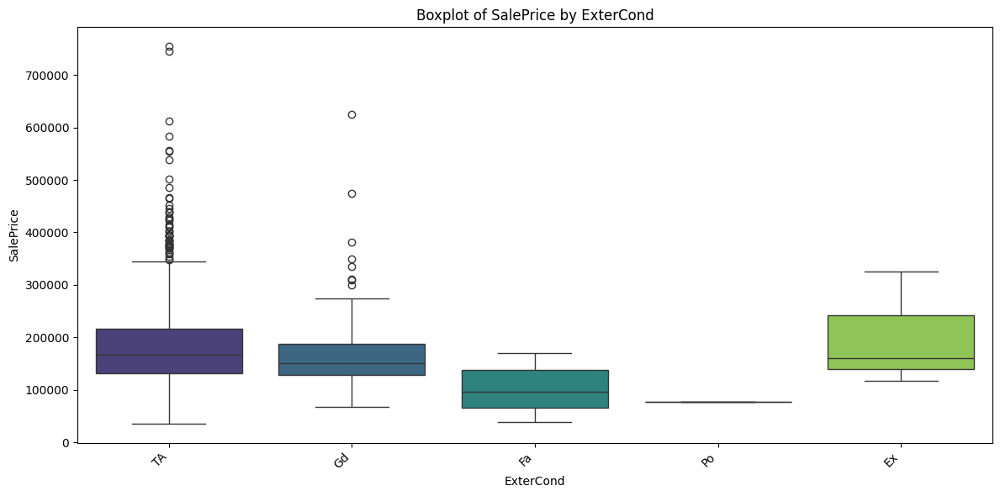


Kruskal-Wallis Test pour 'ExterCond':
Statistic: 43.8583, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'ExterCond' (Sous réserve des hypothèses):
Statistic: 11.1430, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'Foundation' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'Foundation':
  Foundation           mean    median           std  count
0     BrkTil  132291.075342  125250.0  54592.393032    146
1     CBlock  149805.714511  141500.0  48295.041759    634
2      PConc  225230.442040  205000.0  86865.977283    647
3       Slab  107365.625000  104150.0  34213.98

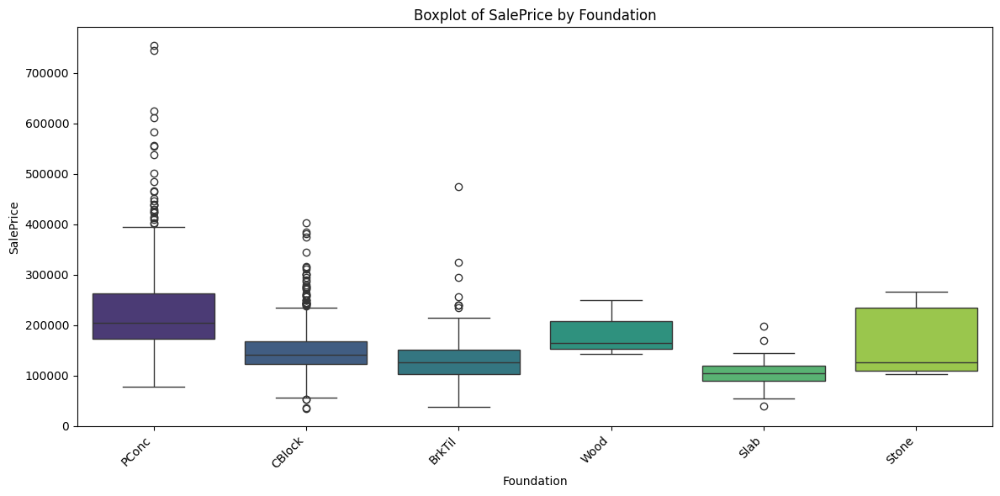


Kruskal-Wallis Test pour 'Foundation':
Statistic: 488.7228, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'Foundation' (Sous réserve des hypothèses):
Statistic: 100.2539, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'BsmtQual' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'BsmtQual':
  BsmtQual           mean    median            std  count
0       Ex  327041.041322  318000.0  113563.237392    121
1       Fa  115692.028571  112000.0   34469.667278     35
2       Gd  202688.478964  192070.0   58092.364284    618
3       TA  138866.295918  135000.0   43551.097885 

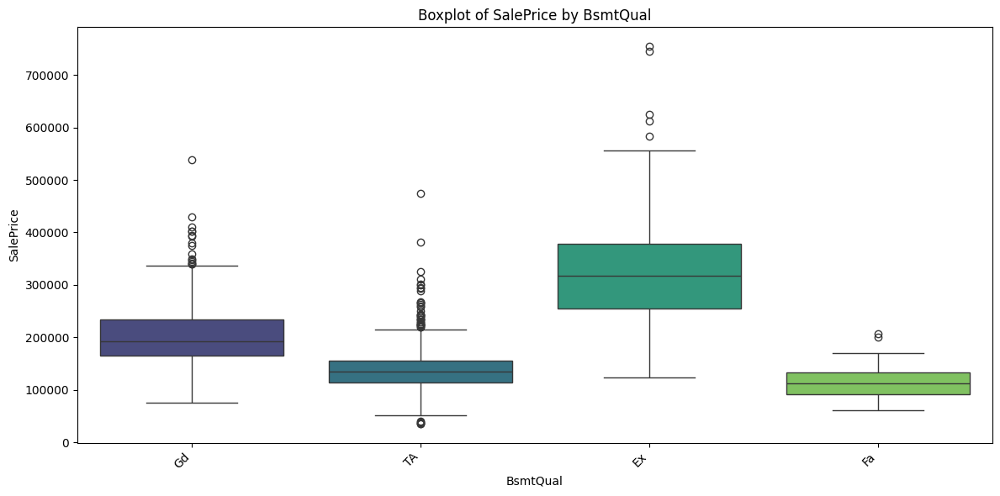


Kruskal-Wallis Test pour 'BsmtQual':
Statistic: 659.0207, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'BsmtQual' (Sous réserve des hypothèses):
Statistic: 413.9456, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'BsmtCond' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'BsmtCond':
  BsmtCond           mean    median           std  count
0       Fa  121809.533333  118500.0  43467.796975     45
1       Gd  213599.907692  193879.0  72663.155026     65
2       Po   64000.000000   64000.0   4242.640687      2
3       TA  181492.227745  163500.0  79588.815339   1348


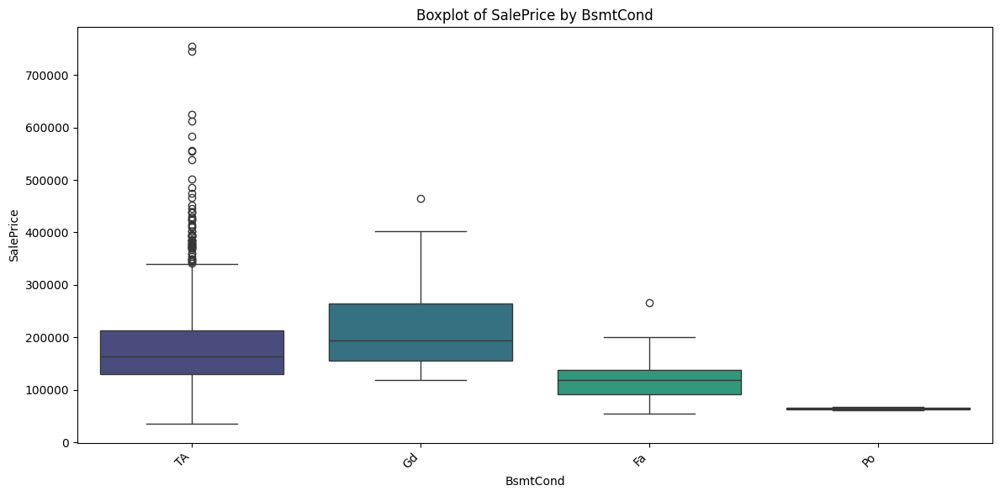


Kruskal-Wallis Test pour 'BsmtCond':
Statistic: 61.0511, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'BsmtCond' (Sous réserve des hypothèses):
Statistic: 13.7918, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'BsmtExposure' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'BsmtExposure':
  BsmtExposure           mean    median            std  count
0           Av  206643.420814  185850.0   88655.504849    221
1           Gd  257689.805970  226975.0  118923.672583    134
2           Mn  192789.657895  182450.0   77335.442652    114
3           No  163439.248234  15

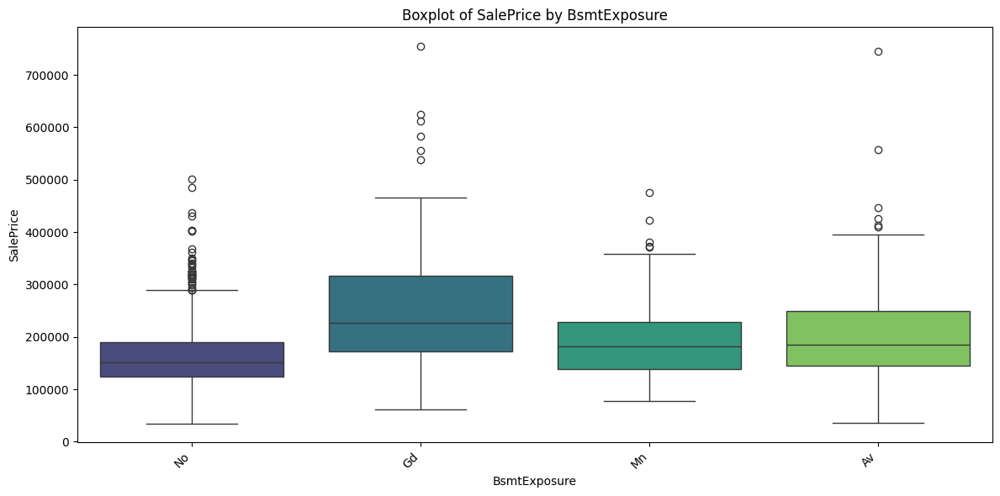


Kruskal-Wallis Test pour 'BsmtExposure':
Statistic: 152.0401, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'BsmtExposure' (Sous réserve des hypothèses):
Statistic: 76.5779, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'BsmtFinType1' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'BsmtFinType1':
  BsmtFinType1           mean    median           std  count
0          ALQ  161573.068182  149250.0  50821.277231    220
1          BLQ  149493.655405  139100.0  47327.292126    148
2          GLQ  235413.720096  213750.0  93215.613258    418
3          LwQ  151852.70270

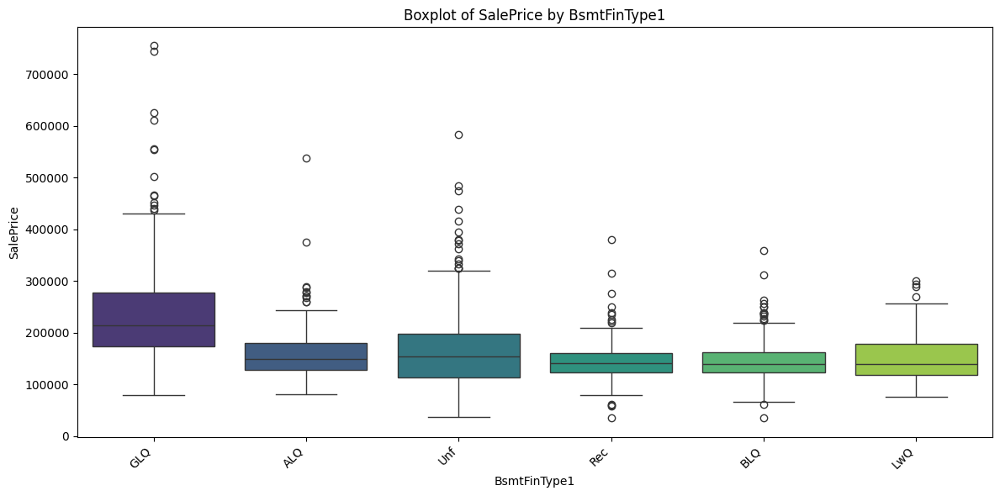


Kruskal-Wallis Test pour 'BsmtFinType1':
Statistic: 305.7769, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'BsmtFinType1' (Sous réserve des hypothèses):
Statistic: 70.5184, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'BsmtFinType2' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'BsmtFinType2':
  BsmtFinType2           mean    median            std  count
0          ALQ  209942.105263  174900.0  104764.743411     19
1          BLQ  151101.000000  143000.0   41611.305388     33
2          GLQ  180982.142857  203125.0   64573.040359     14
3          LwQ  164364.1

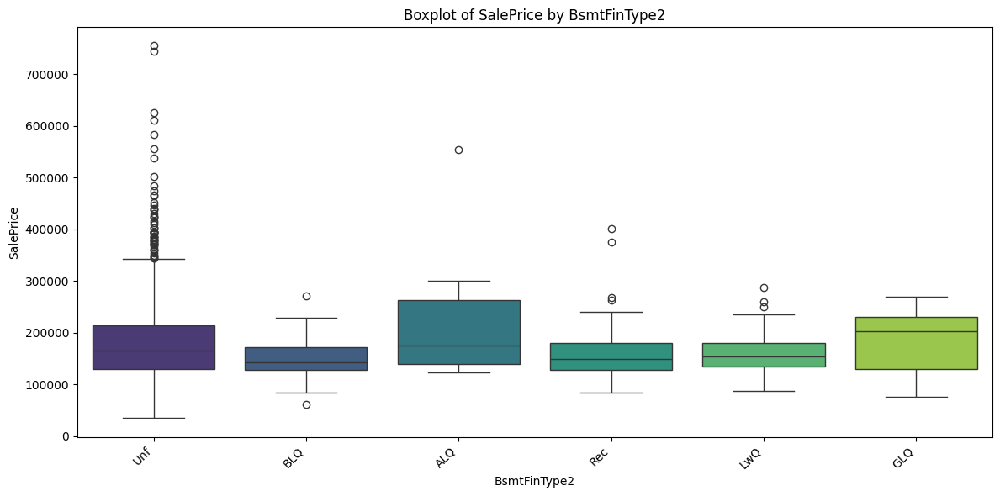


Kruskal-Wallis Test pour 'BsmtFinType2':
Statistic: 8.8780, p-value: 0.1140
Échec du rejet de H0 : Pas de différence significative démontrée entre les médianes de 'SalePrice' pour les catégories de '{col}'.

ANOVA Test pour 'BsmtFinType2' (Sous réserve des hypothèses):
Statistic: 2.3900, p-value: 0.0360
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'Heating' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'Heating':
  Heating           mean    median           std  count
0   Floor   72500.000000   72500.0           NaN      1
1    GasA  182021.195378  164500.0  79262.873587   1428
2    GasW  166632.166667  134950.0  78547.575324     18
3    Grav   75271.428571   79000.0  28066.570524      7
4    OthW  

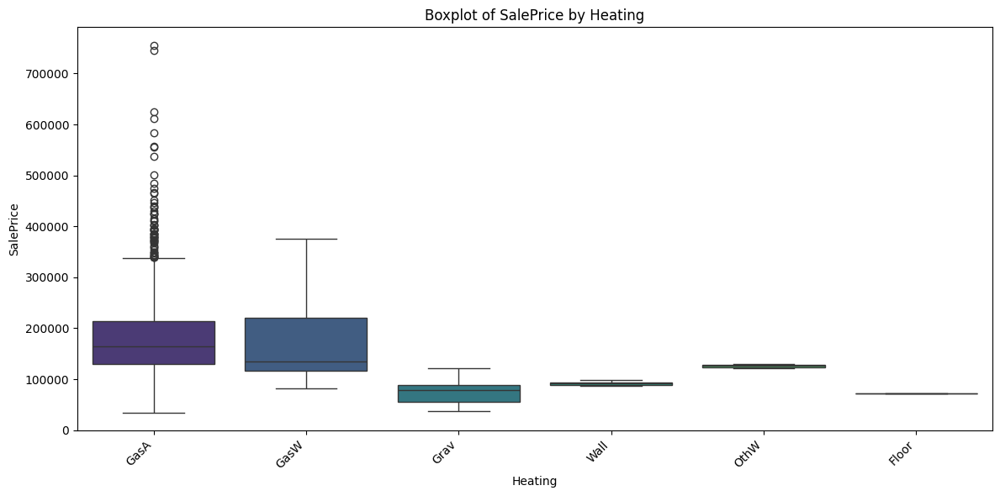


Kruskal-Wallis Test pour 'Heating':
Statistic: 30.4695, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'Heating' (Sous réserve des hypothèses):
Statistic: 4.8536, p-value: 0.0007
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'HeatingQC' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'HeatingQC':
  HeatingQC           mean    median           std  count
0        Ex  214914.429150  194700.0  87469.704503    741
1        Fa  123919.489796  123500.0  50306.618996     49
2        Gd  156858.871369  152000.0  52923.920003    241
3        Po   87000.000000   87000.0           NaN      1


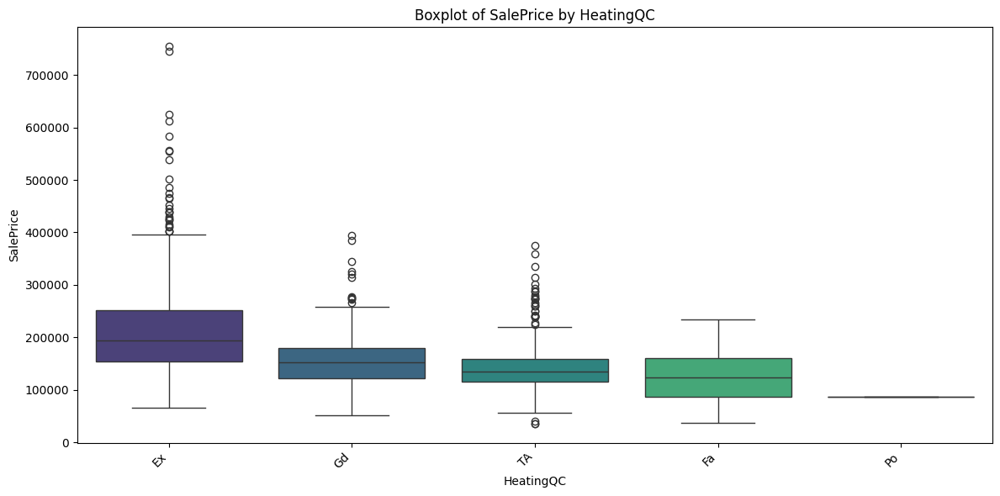


Kruskal-Wallis Test pour 'HeatingQC':
Statistic: 354.6721, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'HeatingQC' (Sous réserve des hypothèses):
Statistic: 117.2813, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'CentralAir' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'CentralAir':
  CentralAir           mean    median           std  count
0          N  105264.073684   98000.0  40671.273961     95
1          Y  186186.709890  168000.0  78805.206820   1365


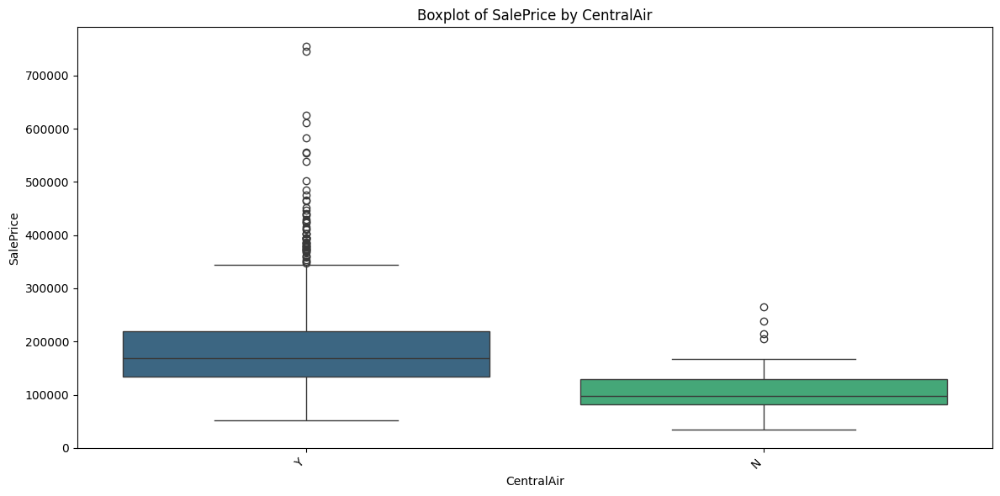


Kruskal-Wallis Test pour 'CentralAir':
Statistic: 143.1983, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'CentralAir' (Sous réserve des hypothèses):
Statistic: 98.3053, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
Wilcoxon Test (2 groups): Statistic=11.9664, p-value=0.0000
Student's t-test (2 groups, Welch): Statistic=17.2678, p-value=0.0000

--- Analyse de la liaison entre 'Electrical' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'Electrical':
  Electrical           mean    median           std  count
0      FuseA  122196.893617  121250.0  37511.376615     94
1      FuseF  107675.444444  115000.0  30636.507376     27
2      FuseP   97333.333333   82000.0  34645.827070      3
3        Mix

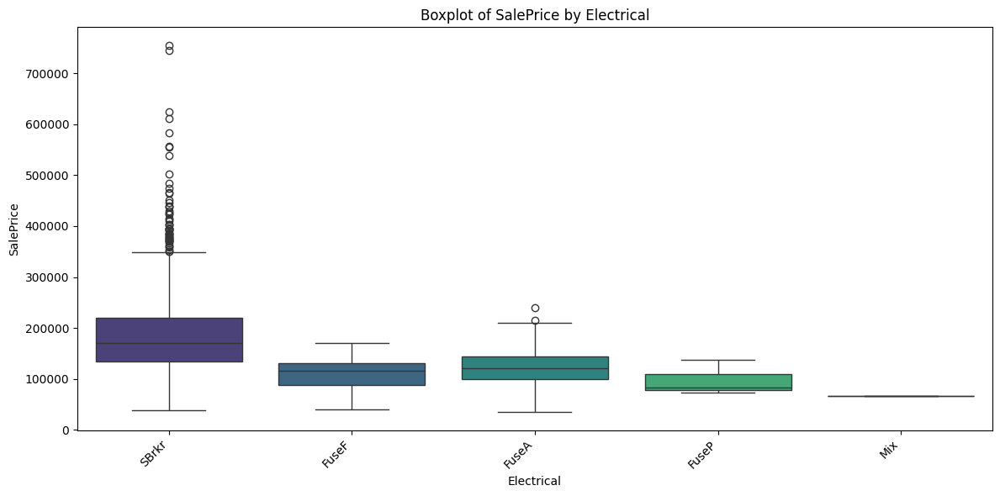


Kruskal-Wallis Test pour 'Electrical':
Statistic: 128.7955, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'Electrical' (Sous réserve des hypothèses):
Statistic: 30.0385, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'KitchenQual' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'KitchenQual':
  KitchenQual           mean    median            std  count
0          Ex  328554.670000  316750.0  120862.942573    100
1          Fa  105565.205128  115000.0   36004.254037     39
2          Gd  212116.023891  201400.0   64020.176702    586
3          TA  139962.511565  1370

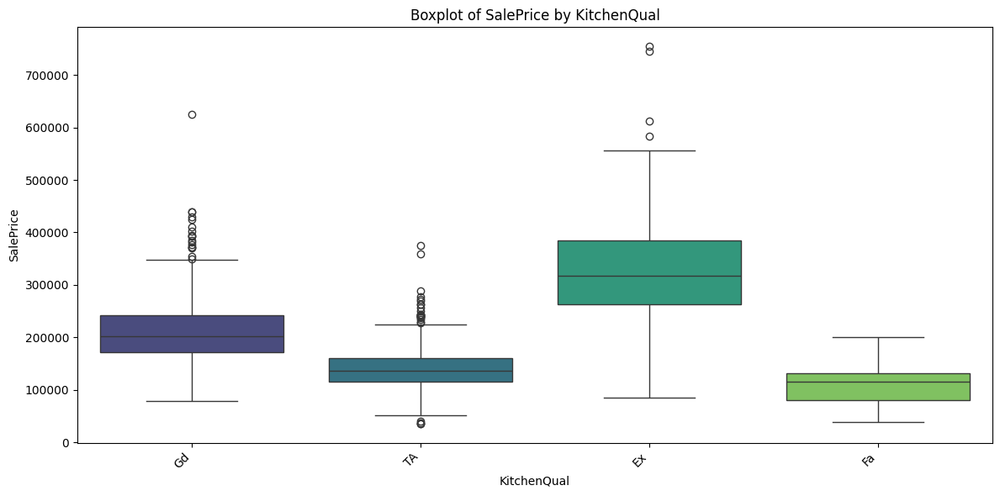


Kruskal-Wallis Test pour 'KitchenQual':
Statistic: 661.4816, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'KitchenQual' (Sous réserve des hypothèses):
Statistic: 407.8064, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'Functional' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'Functional':
  Functional           mean    median            std  count
0       Maj1  153948.142857  140750.0   64503.775815     14
1       Maj2   85800.000000   85000.0   27086.897201      5
2       Min1  146385.483871  139000.0   38089.572487     31
3       Min2  144240.647059  140000.0

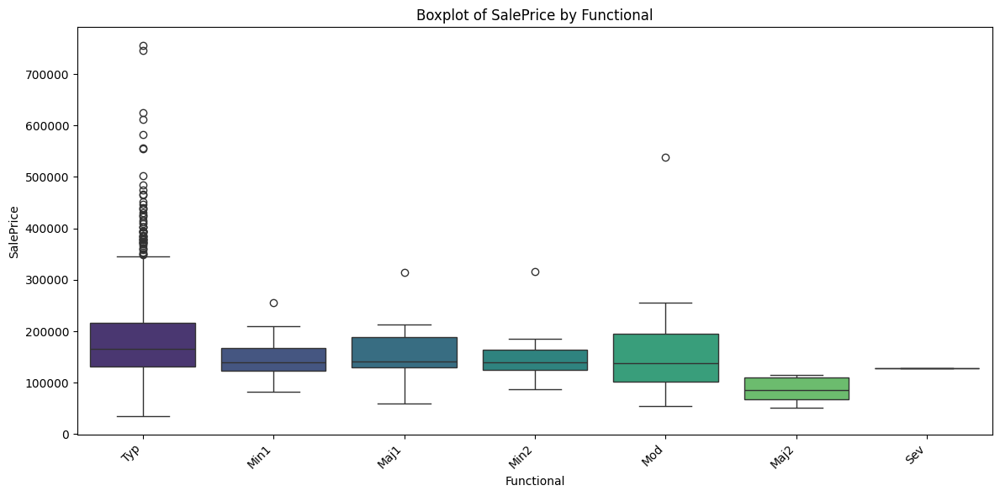


Kruskal-Wallis Test pour 'Functional':
Statistic: 31.7593, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'Functional' (Sous réserve des hypothèses):
Statistic: 4.7829, p-value: 0.0002
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'GarageType' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'GarageType':
  GarageType           mean    median            std  count
0     2Types  151283.333333  159000.0   34917.068415      6
1     Attchd  194411.473186  179900.0   79424.358662    951
2    Basment  160570.684211  148000.0   63967.283574     19
3    BuiltIn  254751.738636  227500.0  102

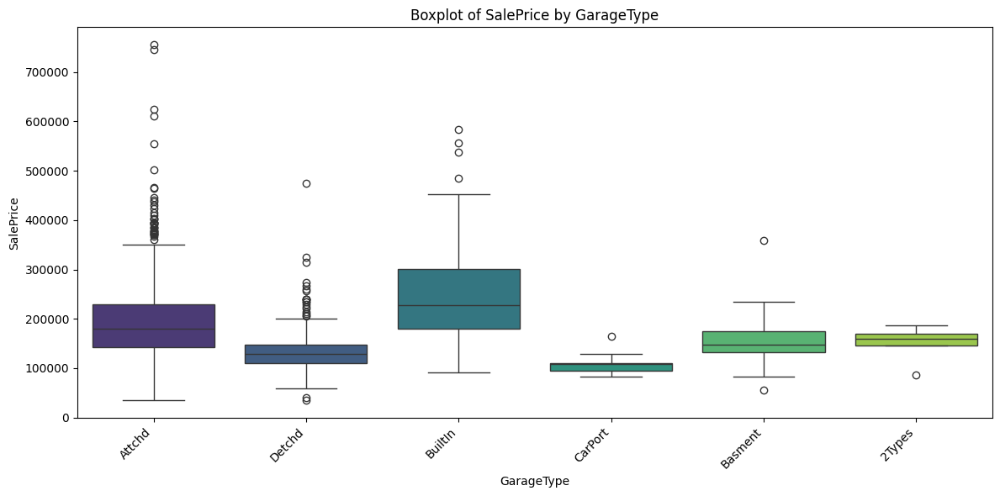


Kruskal-Wallis Test pour 'GarageType':
Statistic: 339.6215, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'GarageType' (Sous réserve des hypothèses):
Statistic: 59.3130, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'GarageFinish' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'GarageFinish':
  GarageFinish           mean    median           std  count
0          Fin  240052.690341  215000.0  96960.593232    352
1          RFn  202068.869668  190000.0  63536.222518    422
2          Unf  137570.460641  132000.0  46792.317425    686


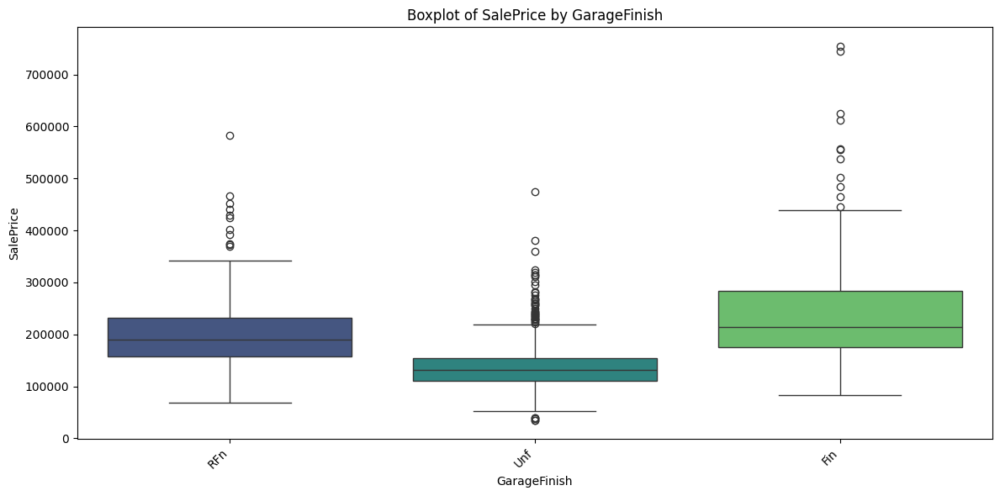


Kruskal-Wallis Test pour 'GarageFinish':
Statistic: 578.9156, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'GarageFinish' (Sous réserve des hypothèses):
Statistic: 303.6194, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'GarageQual' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'GarageQual':
  GarageQual           mean    median            std  count
0         Ex  241000.000000  127500.0  202680.166765      3
1         Fa  123573.354167  115000.0   42971.440985     48
2         Gd  215860.714286  209115.0   74126.739021     14
3         Po  100166.666667   96500

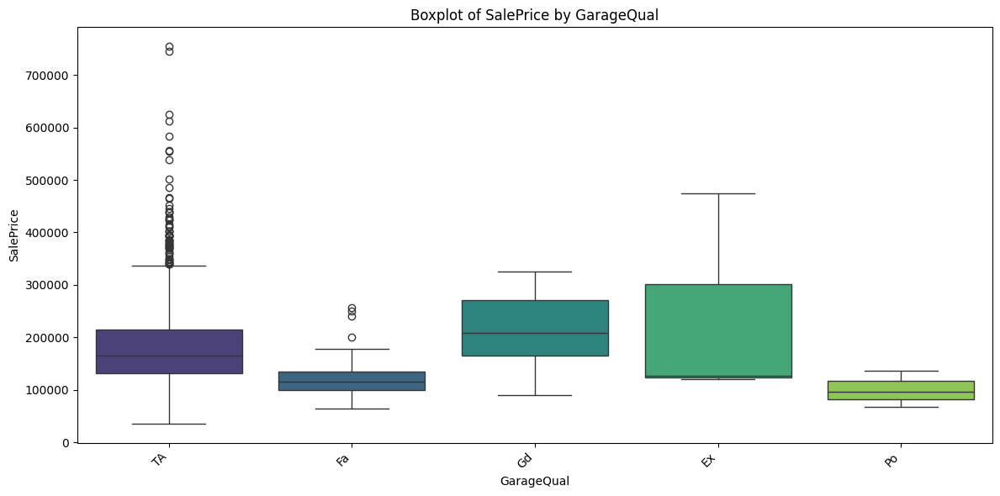


Kruskal-Wallis Test pour 'GarageQual':
Statistic: 53.4052, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'GarageQual' (Sous réserve des hypothèses):
Statistic: 8.4576, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'GarageCond' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'GarageCond':
  GarageCond           mean    median           std  count
0         Ex  124000.000000  124000.0   4949.747468      2
1         Fa  114654.028571  114504.0  36420.903588     35
2         Gd  179930.000000  148000.0  64769.318354      9
3         Po  108500.000000  108000.0  22662.3

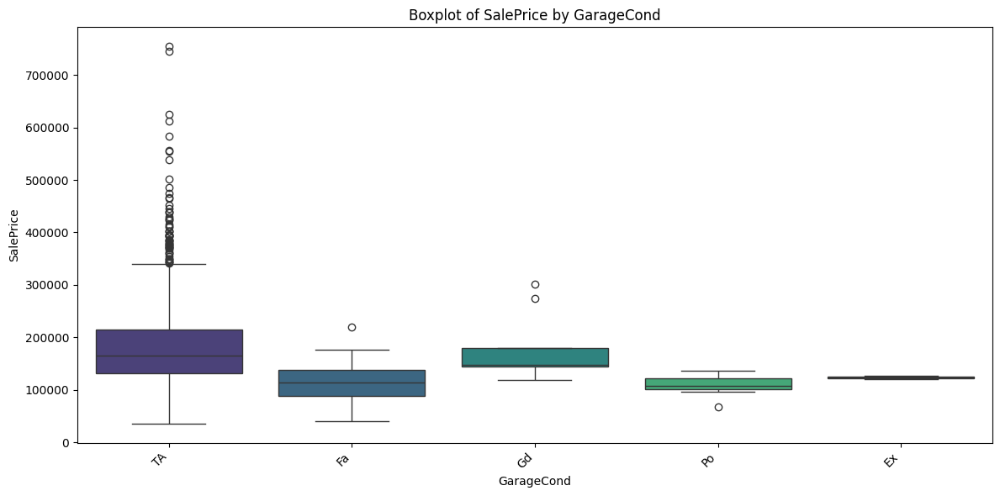


Kruskal-Wallis Test pour 'GarageCond':
Statistic: 51.8179, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'GarageCond' (Sous réserve des hypothèses):
Statistic: 8.2034, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'PavedDrive' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'PavedDrive':
  PavedDrive           mean    median           std  count
0          N  115039.122222  111000.0  44352.523309     90
1          P  132330.000000  132250.0  33503.030228     30
2          Y  186433.973881  168500.0  79665.503047   1340


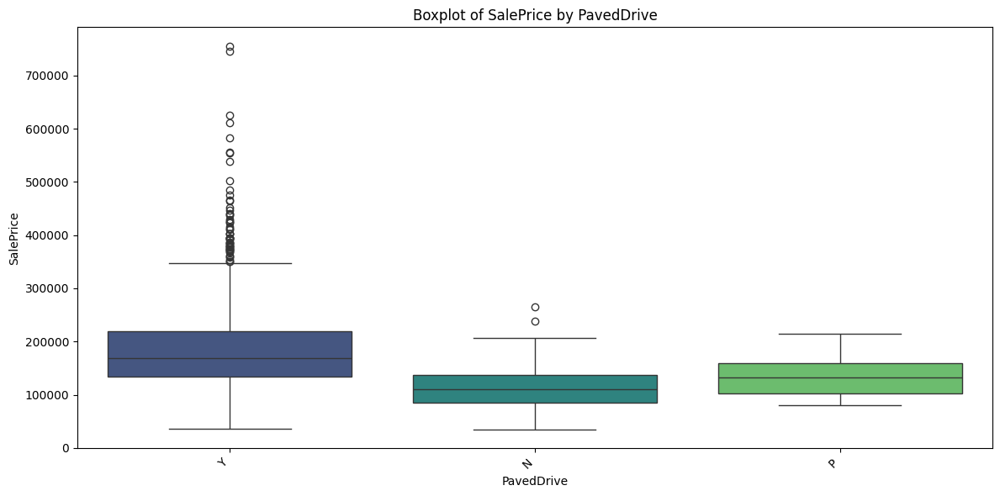


Kruskal-Wallis Test pour 'PavedDrive':
Statistic: 115.8391, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'PavedDrive' (Sous réserve des hypothèses):
Statistic: 42.0242, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'SaleType' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'SaleType':
  SaleType           mean    median            std  count
0      COD  143973.255814  139000.0   47098.294314     43
1      CWD  210600.000000  188750.0   86421.486526      4
2      Con  269600.000000  269600.0   76933.217793      2
3    ConLD  138780.888889  140000.0   53876.560647  

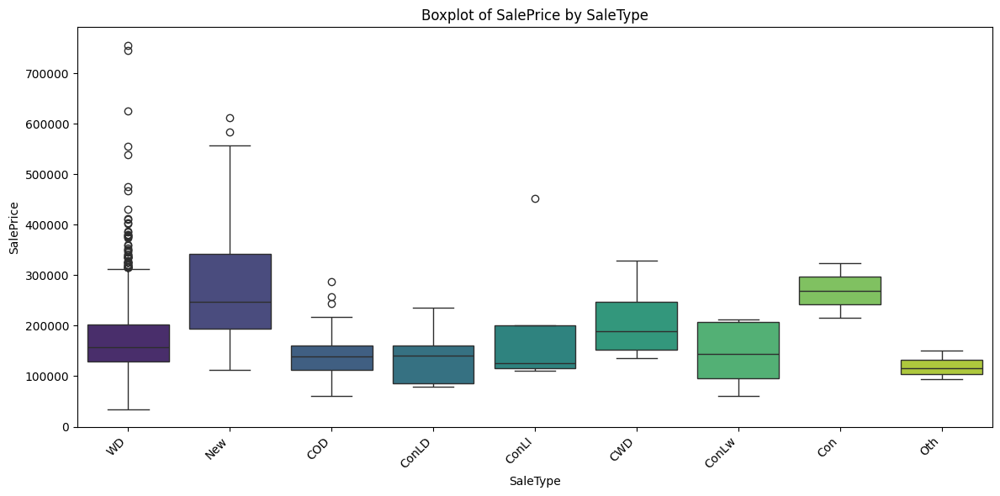


Kruskal-Wallis Test pour 'SaleType':
Statistic: 156.3829, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'SaleType' (Sous réserve des hypothèses):
Statistic: 28.8631, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Analyse de la liaison entre 'SaleCondition' et 'SalePrice' ---

Statistiques descriptives de 'SalePrice' par catégorie de 'SaleCondition':
  SaleCondition           mean    median            std  count
0       Abnorml  146526.623762  130000.0   82796.213395    101
1       AdjLand  104125.000000  104000.0   26135.464411      4
2        Alloca  167377.416667  148145.0   84460.527502     12
3        Family  149600.00

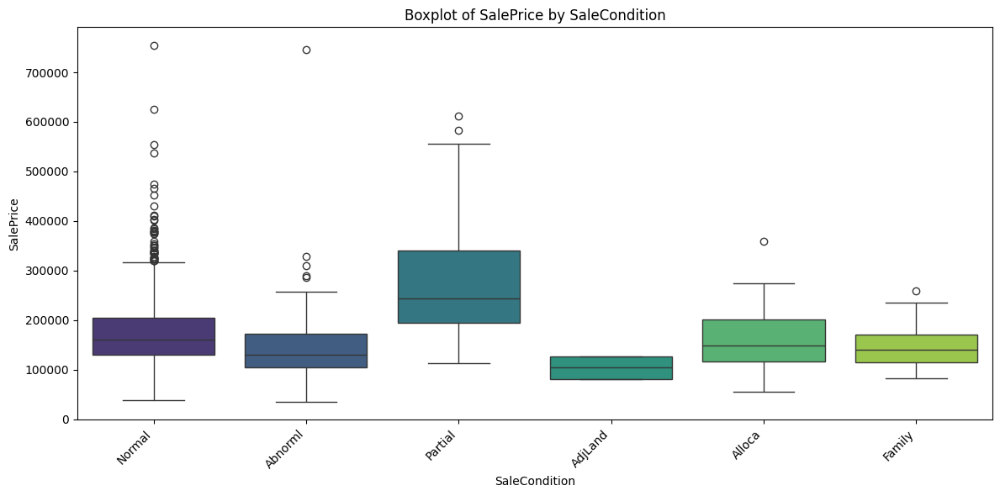


Kruskal-Wallis Test pour 'SaleCondition':
Statistic: 168.3225, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

ANOVA Test pour 'SaleCondition' (Sous réserve des hypothèses):
Statistic: 45.5784, p-value: 0.0000
Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.

Pairwise Tests (if only 2 groups):
See post-hoc tests if global test is significant
See post-hoc tests if global test is significant

--- Récapitulatif des liaisons qualitatives avec SalePrice (classées par Kruskal-Wallis p-value croissante) ---

Variable: Neighborhood
  Kruskal-Wallis p-value: 0.0000
  ANOVA p-value: 0.0000
  Statistiques par catégorie:
   Neighborhood           mean    median            std  count
0       Blmngtn  194870.882353  191000.0   30393.229219     17
1       Blueste  137500.000000  137500.0   19091.883092      2

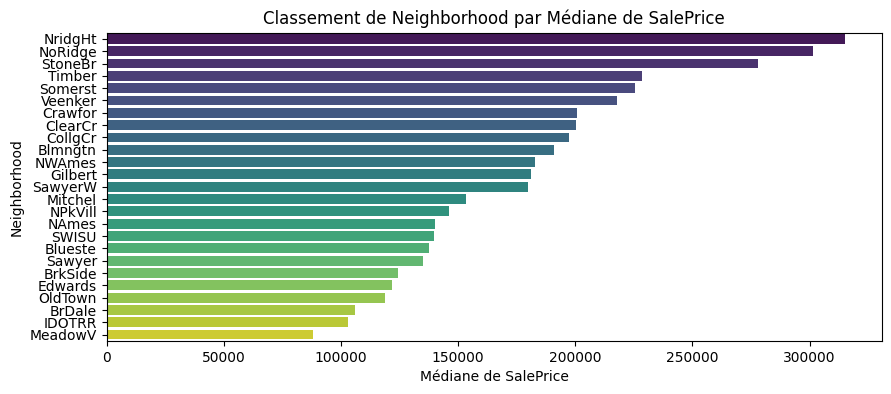


Variable: ExterQual
  Kruskal-Wallis p-value: 0.0000
  ANOVA p-value: 0.0000
  Statistiques par catégorie:
  ExterQual           mean    median            std  count
0        Ex  367360.961538  364606.5  116401.264200     52
1        Fa   87985.214286   82250.0   39826.918794     14
2        Gd  231633.510246  220000.0   71188.873899    488
3        TA  144341.313466  139450.0   42471.815703    906


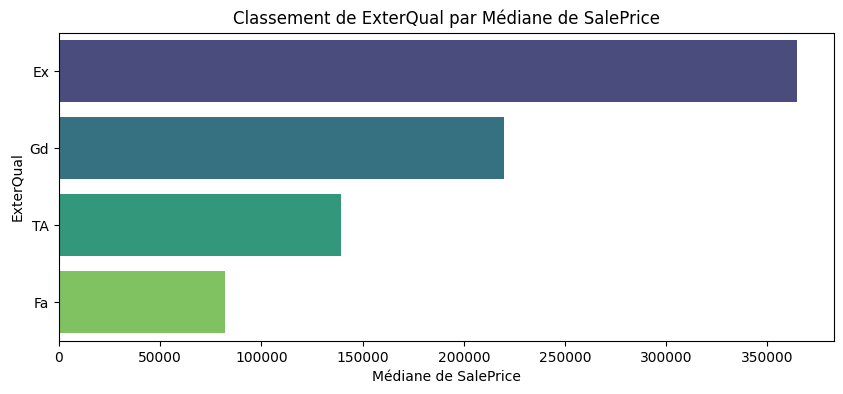


Variable: KitchenQual
  Kruskal-Wallis p-value: 0.0000
  ANOVA p-value: 0.0000
  Statistiques par catégorie:
  KitchenQual           mean    median            std  count
0          Ex  328554.670000  316750.0  120862.942573    100
1          Fa  105565.205128  115000.0   36004.254037     39
2          Gd  212116.023891  201400.0   64020.176702    586
3          TA  139962.511565  137000.0   38896.280336    735


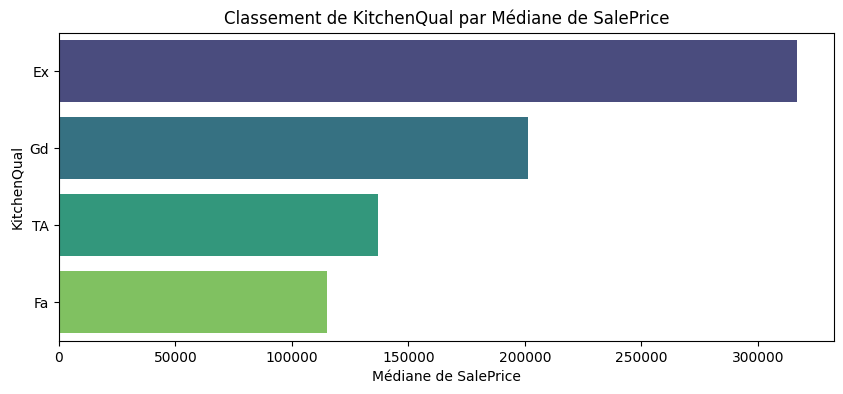


Variable: BsmtQual
  Kruskal-Wallis p-value: 0.0000
  ANOVA p-value: 0.0000
  Statistiques par catégorie:
  BsmtQual           mean    median            std  count
0       Ex  327041.041322  318000.0  113563.237392    121
1       Fa  115692.028571  112000.0   34469.667278     35
2       Gd  202688.478964  192070.0   58092.364284    618
3       TA  138866.295918  135000.0   43551.097885    686


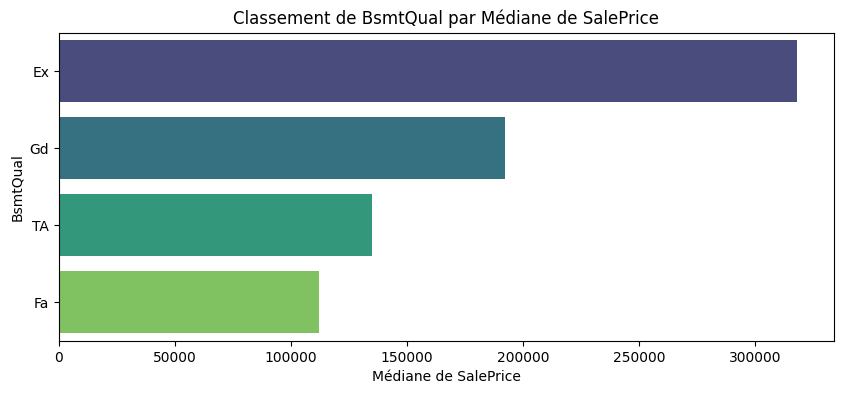


Variable: GarageFinish
  Kruskal-Wallis p-value: 0.0000
  ANOVA p-value: 0.0000
  Statistiques par catégorie:
  GarageFinish           mean    median           std  count
0          Fin  240052.690341  215000.0  96960.593232    352
1          RFn  202068.869668  190000.0  63536.222518    422
2          Unf  137570.460641  132000.0  46792.317425    686


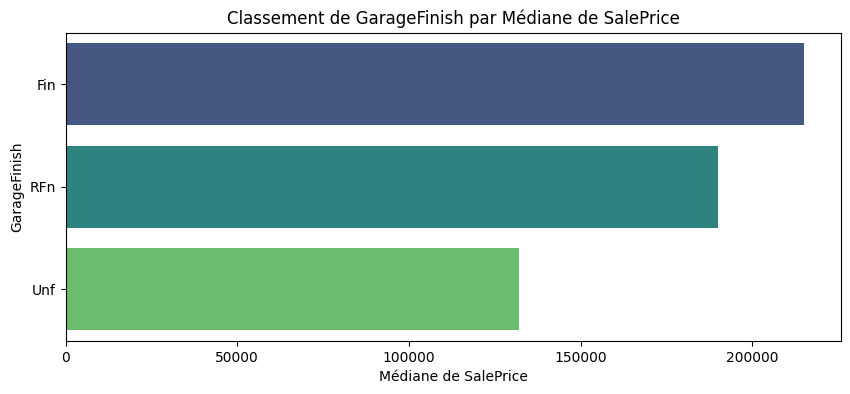


Variable: Foundation
  Kruskal-Wallis p-value: 0.0000
  ANOVA p-value: 0.0000
  Statistiques par catégorie:
  Foundation           mean    median           std  count
0     BrkTil  132291.075342  125250.0  54592.393032    146
1     CBlock  149805.714511  141500.0  48295.041759    634
2      PConc  225230.442040  205000.0  86865.977283    647
3       Slab  107365.625000  104150.0  34213.980939     24
4      Stone  165959.166667  126500.0  78557.704413      6
5       Wood  185666.666667  164000.0  56695.090910      3


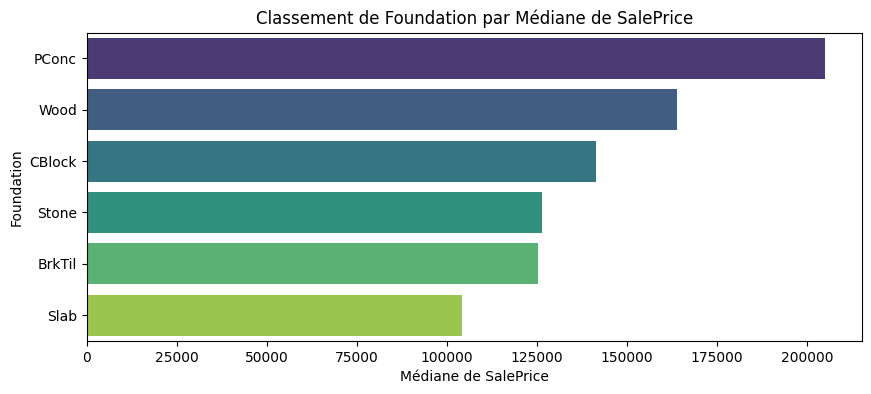


Variable: HeatingQC
  Kruskal-Wallis p-value: 0.0000
  ANOVA p-value: 0.0000
  Statistiques par catégorie:
  HeatingQC           mean    median           std  count
0        Ex  214914.429150  194700.0  87469.704503    741
1        Fa  123919.489796  123500.0  50306.618996     49
2        Gd  156858.871369  152000.0  52923.920003    241
3        Po   87000.000000   87000.0           NaN      1
4        TA  142362.876168  135000.0  47226.485663    428


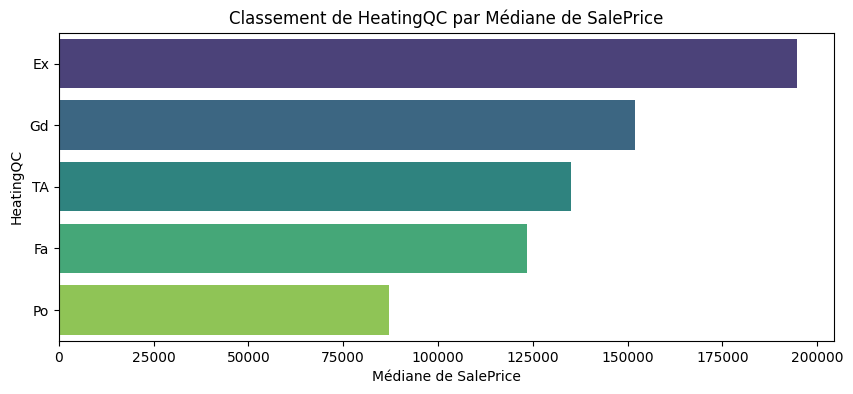


Variable: GarageType
  Kruskal-Wallis p-value: 0.0000
  ANOVA p-value: 0.0000
  Statistiques par catégorie:
  GarageType           mean    median            std  count
0     2Types  151283.333333  159000.0   34917.068415      6
1     Attchd  194411.473186  179900.0   79424.358662    951
2    Basment  160570.684211  148000.0   63967.283574     19
3    BuiltIn  254751.738636  227500.0  102230.854394     88
4    CarPort  109962.111111  108000.0   24638.183681      9
5     Detchd  134091.162791  129500.0   41391.549953    387


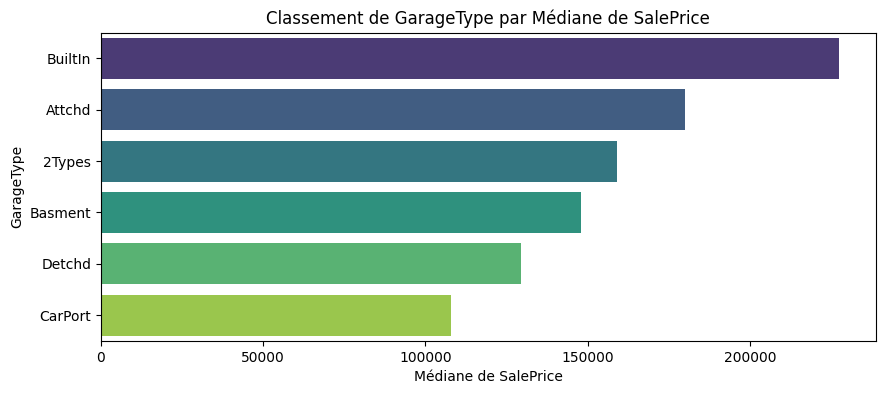


Variable: BsmtFinType1
  Kruskal-Wallis p-value: 0.0000
  ANOVA p-value: 0.0000
  Statistiques par catégorie:
  BsmtFinType1           mean    median           std  count
0          ALQ  161573.068182  149250.0  50821.277231    220
1          BLQ  149493.655405  139100.0  47327.292126    148
2          GLQ  235413.720096  213750.0  93215.613258    418
3          LwQ  151852.702703  139000.0  50796.987083     74
4          Rec  146889.248120  142000.0  45190.118879    133
5          Unf  165519.282655  153900.0  72280.556184    467


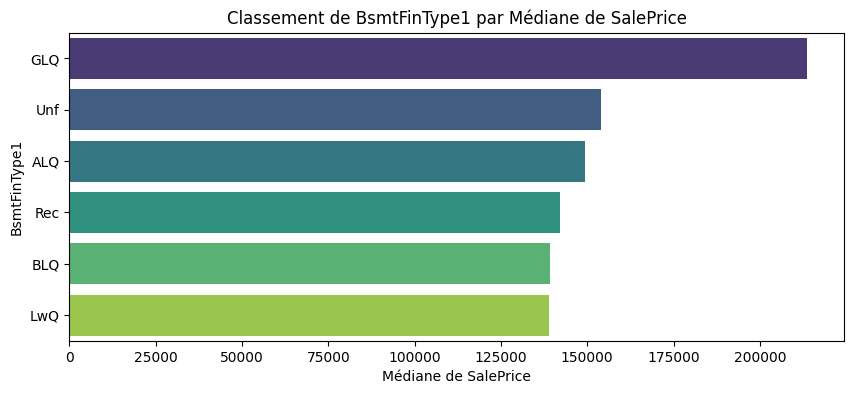


Variable: Exterior1st
  Kruskal-Wallis p-value: 0.0000
  ANOVA p-value: 0.0000
  Statistiques par catégorie:
   Exterior1st           mean    median            std  count
0      AsbShng  107385.550000  108000.0   33756.480660     20
1      AsphShn  100000.000000  100000.0            NaN      1
2      BrkComm   71000.000000   71000.0   15556.349186      2
3      BrkFace  194573.000000  165750.0   82841.914370     50
4       CBlock  105000.000000  105000.0            NaN      1
5      CemntBd  231690.655738  236500.0  120575.621318     61
6      HdBoard  163077.450450  149900.0   66305.714164    222
7      ImStucc  262000.000000  262000.0            NaN      1
8      MetalSd  149422.177273  139000.0   54776.408990    220
9      Plywood  175942.379630  167450.0   49497.383293    108
10       Stone  258500.000000  258500.0   40305.086528      2
11      Stucco  162990.000000  144000.0   83307.246529     25
12     VinylSd  213732.900971  200000.0   80646.975785    515
13     Wd Sdng  149841

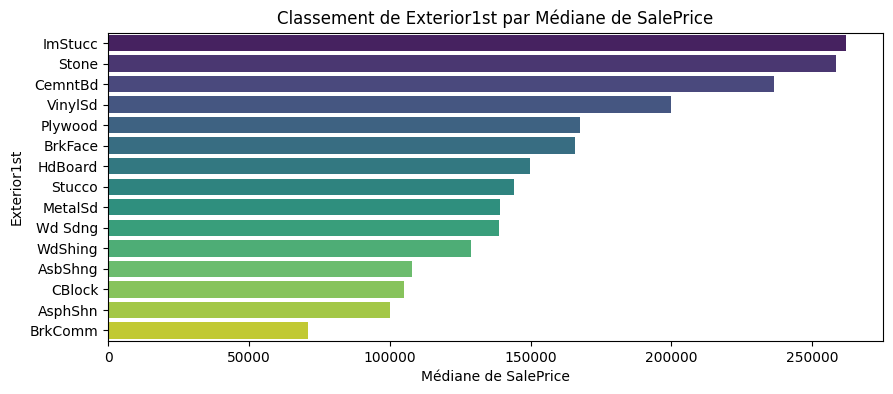


Variable: MSZoning
  Kruskal-Wallis p-value: 0.0000
  ANOVA p-value: 0.0000
  Statistiques par catégorie:
  MSZoning           mean    median           std  count
0  C (all)   74528.000000   74700.0  33791.092031     10
1       FV  214014.061538  205950.0  52369.662067     65
2       RH  131558.375000  136500.0  35714.118435     16
3       RL  191004.994787  174000.0  80766.341319   1151
4       RM  126316.830275  120500.0  48521.689833    218


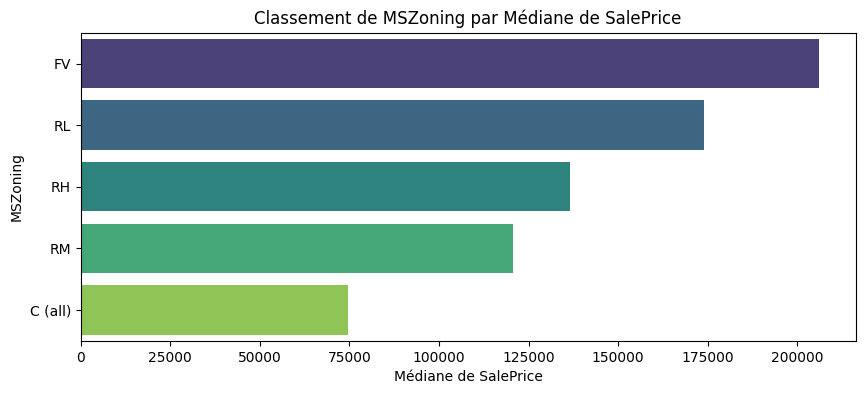


Variable: Exterior2nd
  Kruskal-Wallis p-value: 0.0000
  ANOVA p-value: 0.0000
  Statistiques par catégorie:
   Exterior2nd           mean    median            std  count
0      AsbShng  114060.550000  111000.0   42315.043608     20
1      AsphShn  138000.000000  139000.0   37509.998667      3
2      Brk Cmn  126714.285714  147000.0   38693.084161      7
3      BrkFace  195818.000000  160000.0   95097.551756     25
4       CBlock  105000.000000  105000.0            NaN      1
5      CmentBd  230093.833333  238750.0  116140.396221     60
6      HdBoard  167661.565217  155000.0   70061.078357    207
7      ImStucc  252070.000000  187600.0  193176.672447     10
8      MetalSd  149803.172897  138750.0   55078.595310    214
9        Other  319000.000000  319000.0            NaN      1
10     Plywood  168112.387324  160750.0   46955.744372    142
11       Stone  158224.800000  177000.0   63533.067573      5
12      Stucco  155905.153846  142000.0   74862.492410     26
13     VinylSd  214432

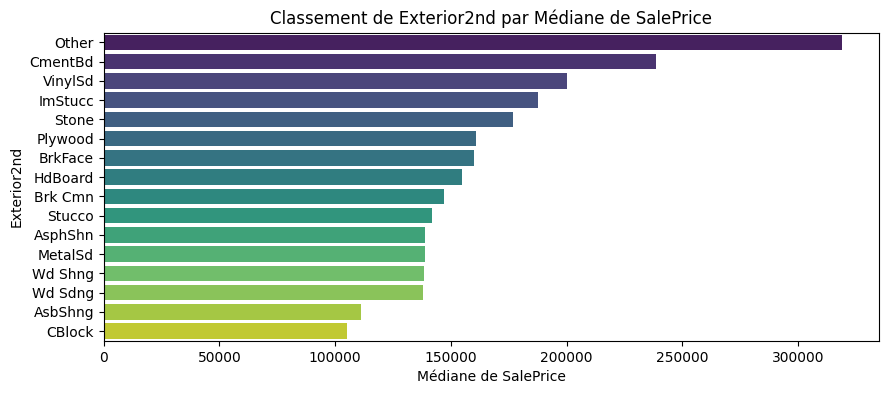


Variable: HouseStyle
  Kruskal-Wallis p-value: 0.0000
  ANOVA p-value: 0.0000
  Statistiques par catégorie:
  HouseStyle           mean    median            std  count
0     1.5Fin  143116.740260  132000.0   54277.941119    154
1     1.5Unf  110150.000000  111250.0   19036.473090     14
2     1Story  175985.477961  154750.0   77055.715011    726
3     2.5Fin  220000.000000  194000.0  118211.976671      8
4     2.5Unf  157354.545455  133900.0   63934.128032     11
5     2Story  210051.764045  190000.0   87339.213570    445
6     SFoyer  135074.486486  135960.0   30480.898192     37
7       SLvl  166703.384615  164500.0   38305.161339     65


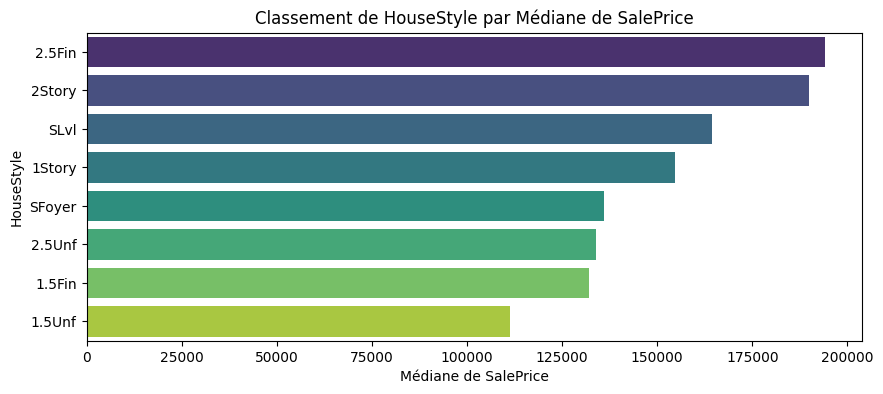


Variable: SaleCondition
  Kruskal-Wallis p-value: 0.0000
  ANOVA p-value: 0.0000
  Statistiques par catégorie:
  SaleCondition           mean    median            std  count
0       Abnorml  146526.623762  130000.0   82796.213395    101
1       AdjLand  104125.000000  104000.0   26135.464411      4
2        Alloca  167377.416667  148145.0   84460.527502     12
3        Family  149600.000000  140500.0   47820.002421     20
4        Normal  175202.219533  160000.0   69713.636280   1198
5       Partial  272291.752000  244600.0  103696.404119    125


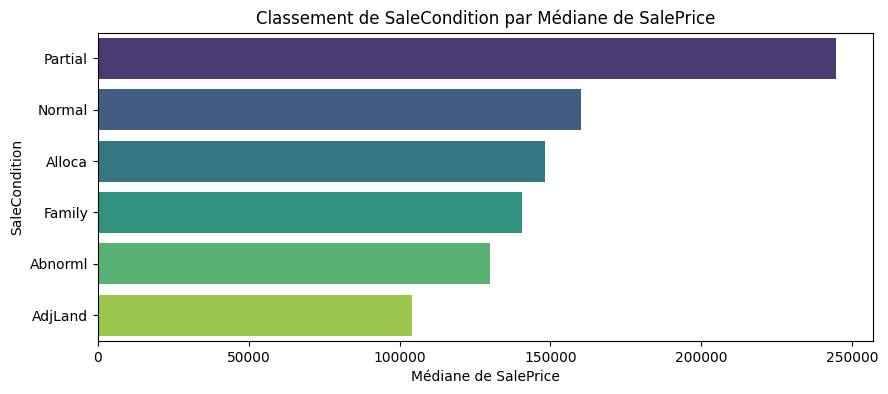


Variable: CentralAir
  Kruskal-Wallis p-value: 0.0000
  ANOVA p-value: 0.0000
  Statistiques par catégorie:
  CentralAir           mean    median           std  count
0          N  105264.073684   98000.0  40671.273961     95
1          Y  186186.709890  168000.0  78805.206820   1365


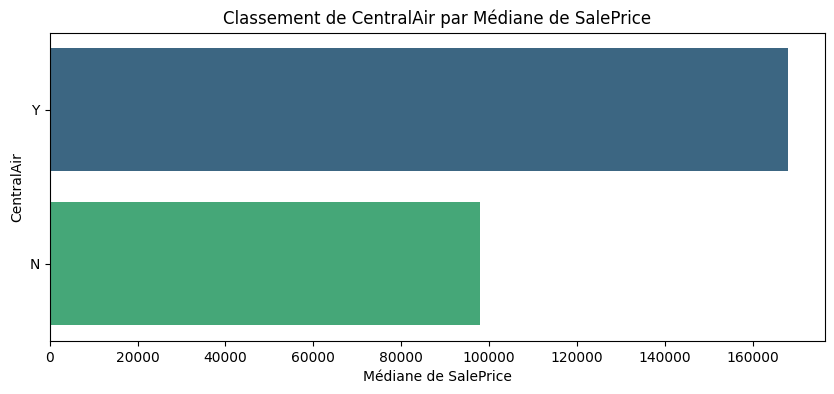


Variable: BsmtExposure
  Kruskal-Wallis p-value: 0.0000
  ANOVA p-value: 0.0000
  Statistiques par catégorie:
  BsmtExposure           mean    median            std  count
0           Av  206643.420814  185850.0   88655.504849    221
1           Gd  257689.805970  226975.0  118923.672583    134
2           Mn  192789.657895  182450.0   77335.442652    114
3           No  163439.248234  151000.0   60861.373994    991


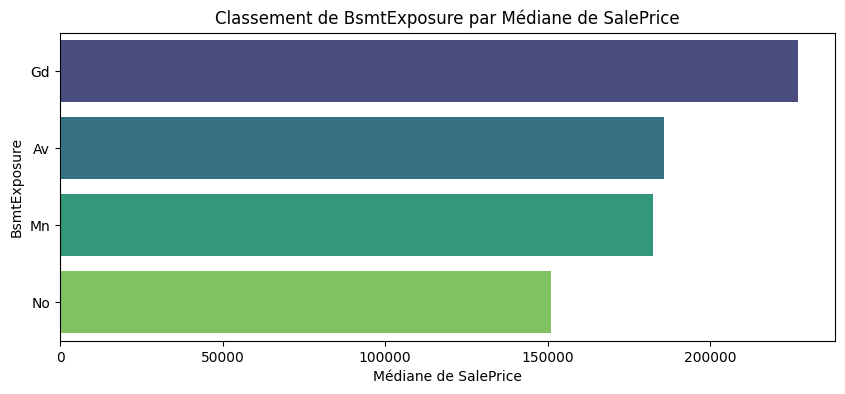


Variable: LotShape
  Kruskal-Wallis p-value: 0.0000
  ANOVA p-value: 0.0000
  Statistiques par catégorie:
  LotShape           mean    median           std  count
0      IR1  206101.665289  189000.0  85858.489559    484
1      IR2  239833.365854  221000.0  99669.427362     41
2      IR3  216036.500000  203570.0  82540.334855     10
3      Reg  164754.818378  146000.0  69673.427215    925


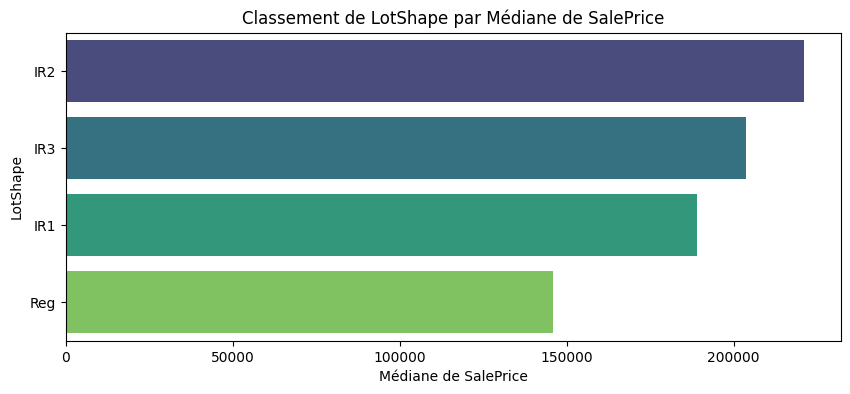


Variable: SaleType
  Kruskal-Wallis p-value: 0.0000
  ANOVA p-value: 0.0000
  Statistiques par catégorie:
  SaleType           mean    median            std  count
0      COD  143973.255814  139000.0   47098.294314     43
1      CWD  210600.000000  188750.0   86421.486526      4
2      Con  269600.000000  269600.0   76933.217793      2
3    ConLD  138780.888889  140000.0   53876.560647      9
4    ConLI  200390.000000  125000.0  145282.519595      5
5    ConLw  143700.000000  144000.0   67291.901444      5
6      New  274945.418033  247453.0  103239.582158    122
7      Oth  119850.000000  116050.0   28441.035495      3
8       WD  173401.836622  158000.0   71129.686245   1267


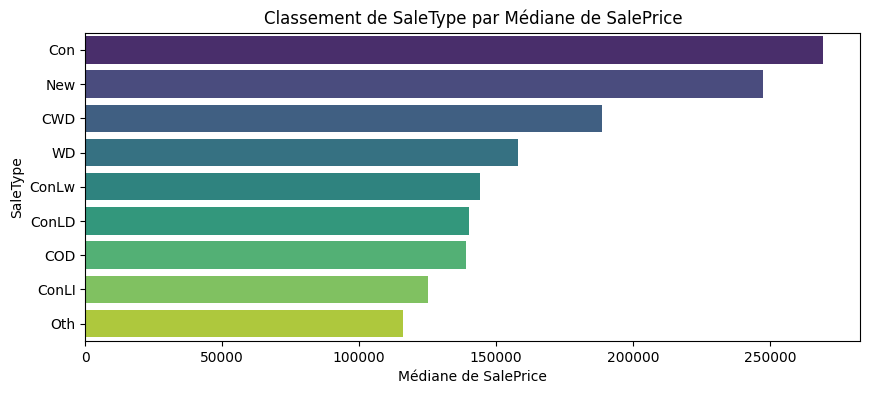


Variable: Electrical
  Kruskal-Wallis p-value: 0.0000
  ANOVA p-value: 0.0000
  Statistiques par catégorie:
  Electrical           mean    median           std  count
0      FuseA  122196.893617  121250.0  37511.376615     94
1      FuseF  107675.444444  115000.0  30636.507376     27
2      FuseP   97333.333333   82000.0  34645.827070      3
3        Mix   67000.000000   67000.0           NaN      1
4      SBrkr  186810.637453  170000.0  79828.273697   1335


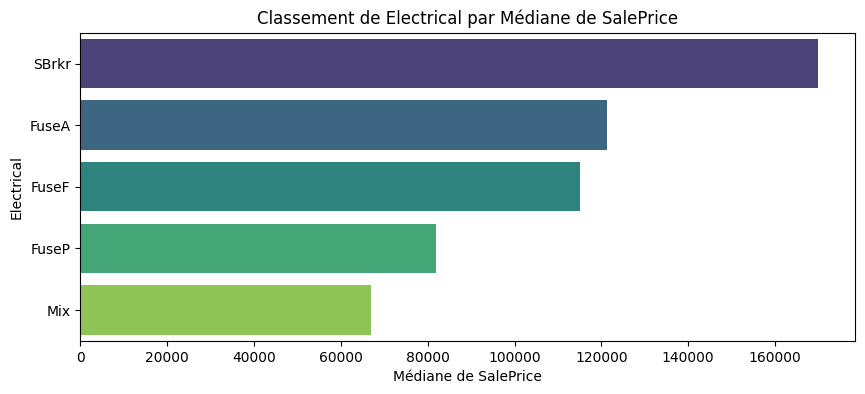


Variable: PavedDrive
  Kruskal-Wallis p-value: 0.0000
  ANOVA p-value: 0.0000
  Statistiques par catégorie:
  PavedDrive           mean    median           std  count
0          N  115039.122222  111000.0  44352.523309     90
1          P  132330.000000  132250.0  33503.030228     30
2          Y  186433.973881  168500.0  79665.503047   1340


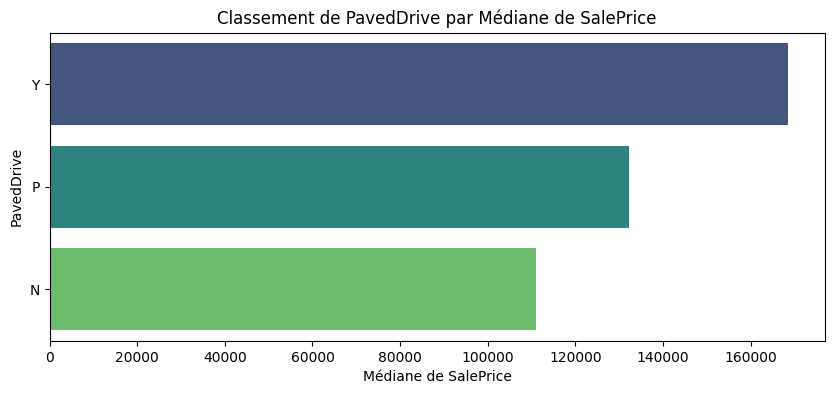


Variable: BldgType
  Kruskal-Wallis p-value: 0.0000
  ANOVA p-value: 0.0000
  Statistiques par catégorie:
  BldgType           mean    median           std  count
0     1Fam  185763.807377  167900.0  82648.502922   1220
1   2fmCon  128432.258065  127500.0  35458.545158     31
2   Duplex  133541.076923  135980.0  27833.249197     52
3    Twnhs  135911.627907  137500.0  41013.222080     43
4   TwnhsE  181959.342105  172200.0  60626.108918    114


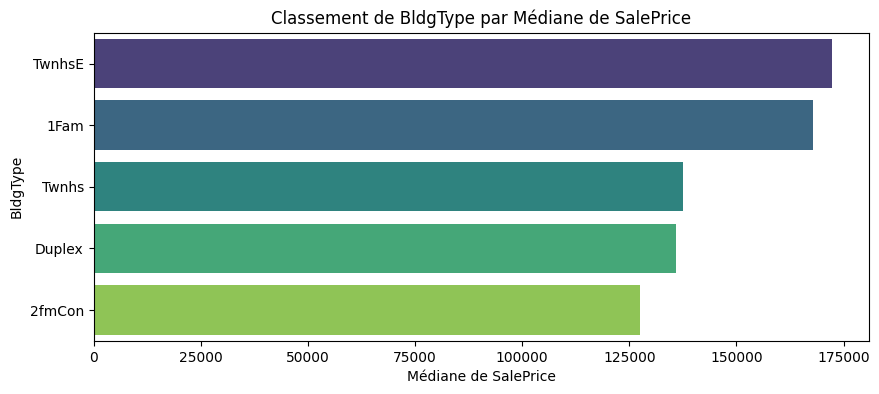


Variable: BsmtCond
  Kruskal-Wallis p-value: 0.0000
  ANOVA p-value: 0.0000
  Statistiques par catégorie:
  BsmtCond           mean    median           std  count
0       Fa  121809.533333  118500.0  43467.796975     45
1       Gd  213599.907692  193879.0  72663.155026     65
2       Po   64000.000000   64000.0   4242.640687      2
3       TA  181492.227745  163500.0  79588.815339   1348


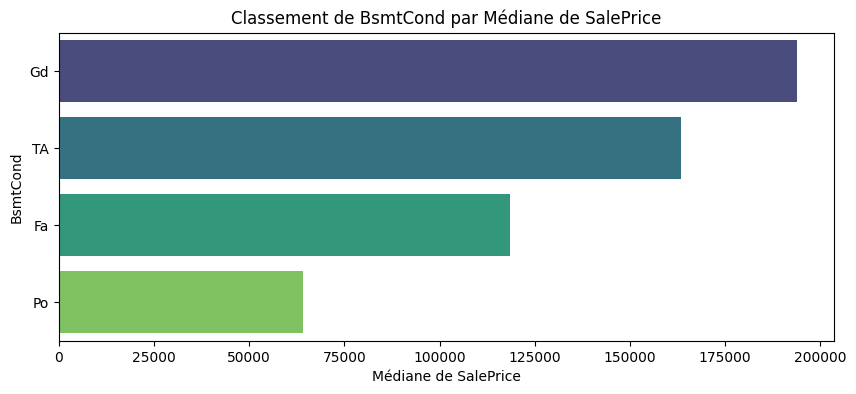


Variable: Condition1
  Kruskal-Wallis p-value: 0.0000
  ANOVA p-value: 0.0000
  Statistiques par catégorie:
  Condition1           mean    median           std  count
0     Artery  135091.666667  119550.0  66226.660548     48
1      Feedr  142475.481481  140000.0  42157.290117     81
2       Norm  184495.492063  166500.0  81256.980125   1260
3       PosA  225875.000000  212500.0  52348.932313      8
4       PosN  215184.210526  200000.0  65256.536609     19
5       RRAe  138400.000000  142500.0  24030.813553     11
6       RRAn  184396.615385  171495.0  66177.922070     26
7       RRNe  190750.000000  190750.0   5303.300859      2
8       RRNn  212400.000000  214000.0  93823.238060      5


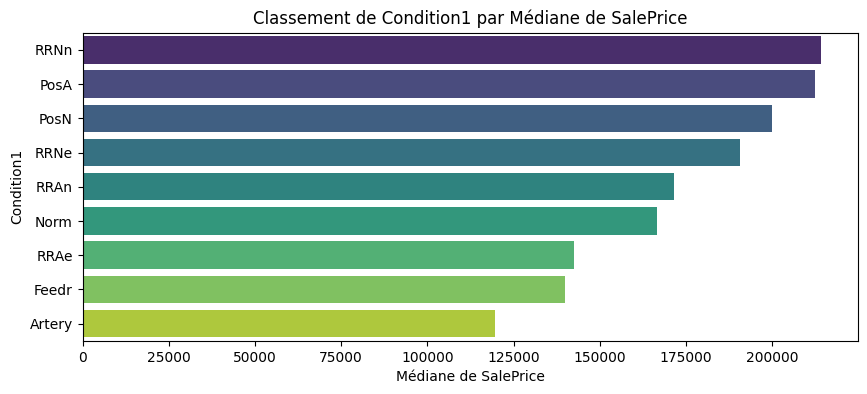


Variable: GarageQual
  Kruskal-Wallis p-value: 0.0000
  ANOVA p-value: 0.0000
  Statistiques par catégorie:
  GarageQual           mean    median            std  count
0         Ex  241000.000000  127500.0  202680.166765      3
1         Fa  123573.354167  115000.0   42971.440985     48
2         Gd  215860.714286  209115.0   74126.739021     14
3         Po  100166.666667   96500.0   35143.752408      3
4         TA  182591.864224  165000.0   79338.718693   1392


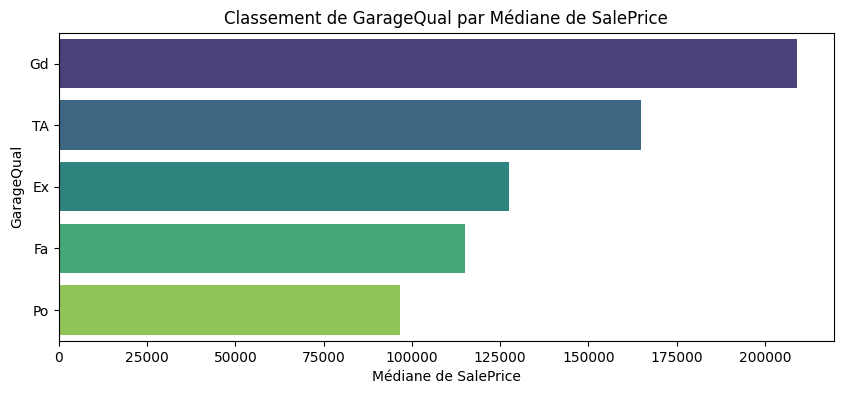


Variable: GarageCond
  Kruskal-Wallis p-value: 0.0000
  ANOVA p-value: 0.0000
  Statistiques par catégorie:
  GarageCond           mean    median           std  count
0         Ex  124000.000000  124000.0   4949.747468      2
1         Fa  114654.028571  114504.0  36420.903588     35
2         Gd  179930.000000  148000.0  64769.318354      9
3         Po  108500.000000  108000.0  22662.377045      7
4         TA  183017.189055  165000.0  79664.408588   1407


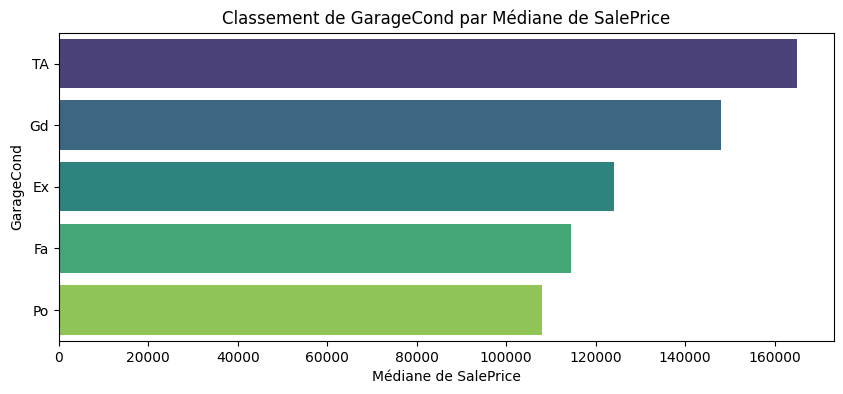


Variable: ExterCond
  Kruskal-Wallis p-value: 0.0000
  ANOVA p-value: 0.0000
  Statistiques par catégorie:
  ExterCond           mean    median            std  count
0        Ex  201333.333333  161000.0  109235.220205      3
1        Fa  102595.142857   95750.0   40094.383940     28
2        Gd  168897.568493  151250.0   72608.303632    146
3        Po   76500.000000   76500.0            NaN      1
4        TA  184034.896256  167370.0   79806.257233   1282


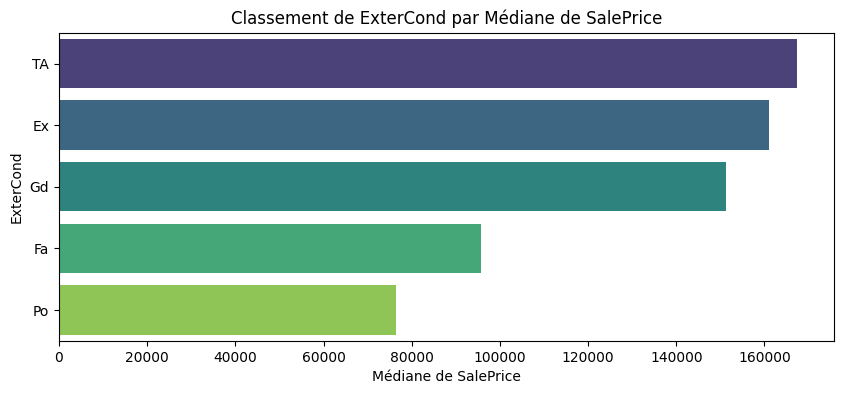


Variable: LandContour
  Kruskal-Wallis p-value: 0.0000
  ANOVA p-value: 0.0000
  Statistiques par catégorie:
  LandContour           mean    median            std  count
0         Bnk  143104.079365  139400.0   49361.244074     63
1         HLS  231533.940000  222250.0  101790.139741     50
2         Low  203661.111111  190000.0   83935.353620     36
3         Lvl  180183.746758  162900.0   78463.567918   1311


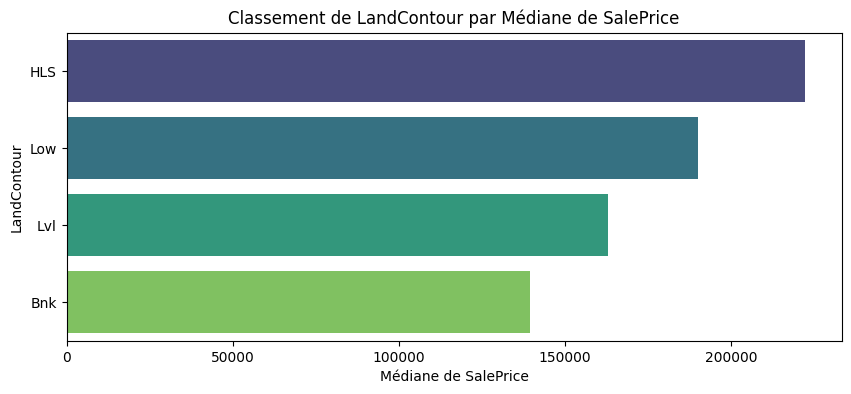


Variable: RoofStyle
  Kruskal-Wallis p-value: 0.0000
  ANOVA p-value: 0.0000
  Statistiques par catégorie:
  RoofStyle           mean    median            std  count
0      Flat  194690.000000  185000.0   62522.963515     13
1     Gable  171483.956179  160000.0   66331.237296   1141
2   Gambrel  148909.090909  139000.0   67013.527807     11
3       Hip  218876.933566  176500.0  111549.603563    286
4   Mansard  180568.428571  175000.0   58057.624627      7
5      Shed  225000.000000  225000.0   49497.474683      2


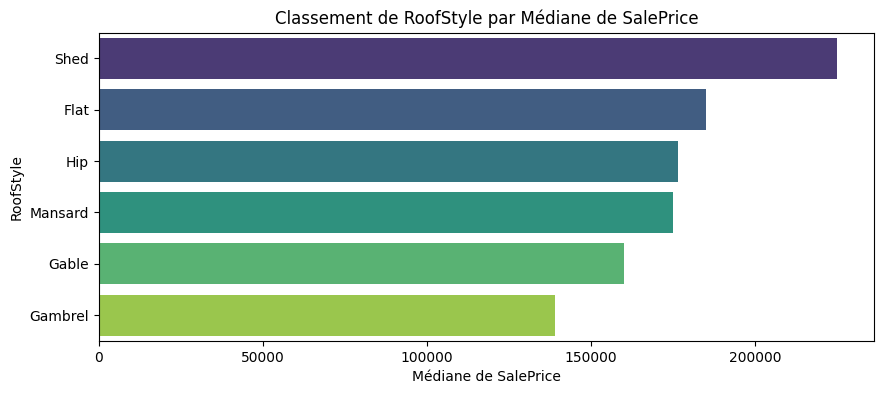


Variable: LotConfig
  Kruskal-Wallis p-value: 0.0000
  ANOVA p-value: 0.0000
  Statistiques par catégorie:
  LotConfig           mean    median           std  count
0    Corner  181623.425856  160000.0  84466.041222    263
1   CulDSac  223854.617021  199262.0  93117.546586     94
2       FR2  177934.574468  165000.0  62788.926829     47
3       FR3  208475.000000  195450.0  78379.222374      4
4    Inside  176938.047529  159697.5  76426.805787   1052


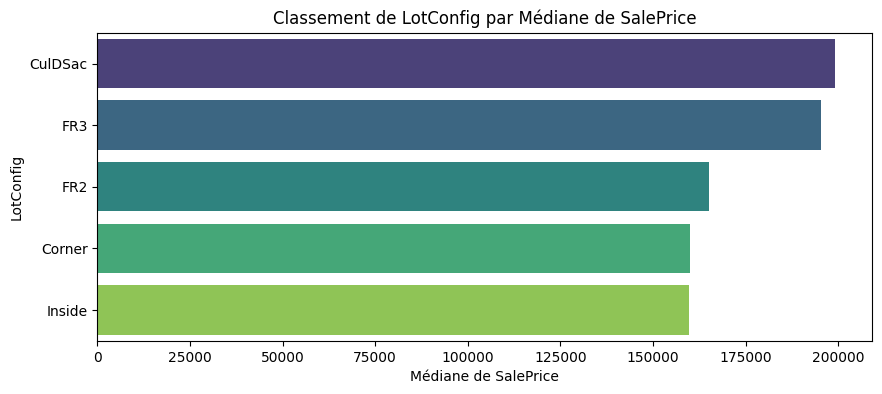


Variable: Heating
  Kruskal-Wallis p-value: 0.0000
  ANOVA p-value: 0.0007
  Statistiques par catégorie:
  Heating           mean    median           std  count
0   Floor   72500.000000   72500.0           NaN      1
1    GasA  182021.195378  164500.0  79262.873587   1428
2    GasW  166632.166667  134950.0  78547.575324     18
3    Grav   75271.428571   79000.0  28066.570524      7
4    OthW  125750.000000  125750.0   5303.300859      2
5    Wall   92100.000000   91450.0   4509.988914      4


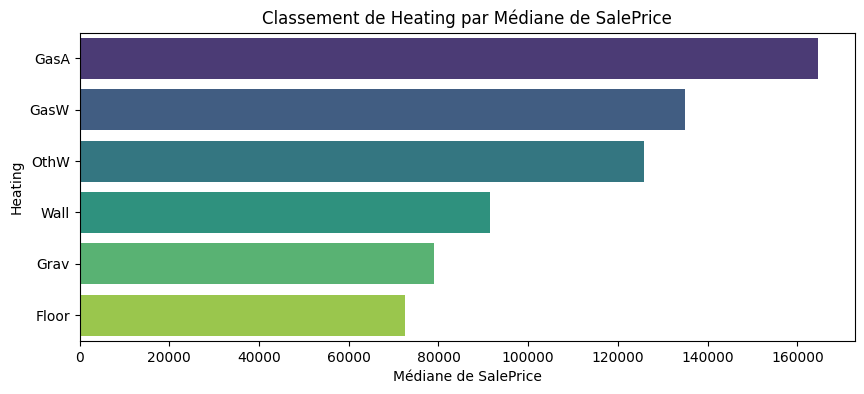


Variable: Functional
  Kruskal-Wallis p-value: 0.0000
  ANOVA p-value: 0.0002
  Statistiques par catégorie:
  Functional           mean    median            std  count
0       Maj1  153948.142857  140750.0   64503.775815     14
1       Maj2   85800.000000   85000.0   27086.897201      5
2       Min1  146385.483871  139000.0   38089.572487     31
3       Min2  144240.647059  140000.0   41215.354652     34
4        Mod  168393.333333  137900.0  118938.666467     15
5        Sev  129000.000000  129000.0            NaN      1
6        Typ  183429.147059  165500.0   80017.959658   1360


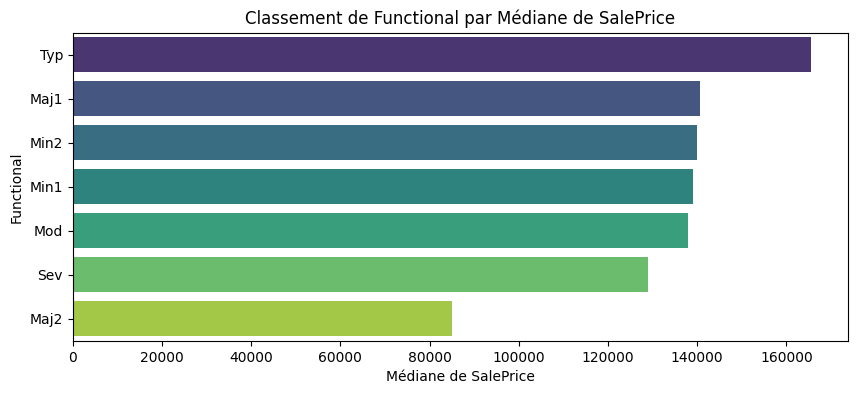


Variable: RoofMatl
  Kruskal-Wallis p-value: 0.0007
  ANOVA p-value: 0.0000
  Statistiques par catégorie:
  RoofMatl           mean    median            std  count
0  ClyTile  160000.000000  160000.0            NaN      1
1  CompShg  179803.679219  162000.0   77722.388636   1434
2  Membran  241500.000000  241500.0            NaN      1
3    Metal  180000.000000  180000.0            NaN      1
4     Roll  137000.000000  137000.0            NaN      1
5  Tar&Grv  185406.363636  167000.0   65430.141720     11
6  WdShake  241400.000000  242000.0   36218.779659      5
7  WdShngl  390250.000000  332500.0  206969.019421      6


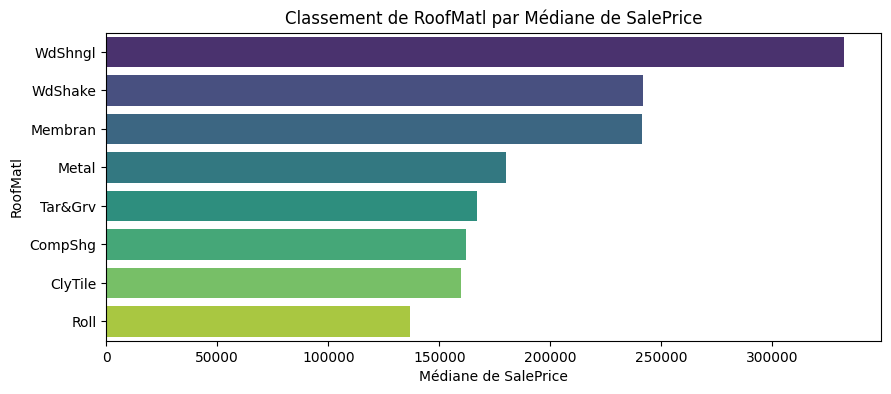


Variable: Condition2
  Kruskal-Wallis p-value: 0.0056
  ANOVA p-value: 0.0282
  Statistiques par catégorie:
  Condition2           mean    median            std  count
0     Artery  106500.000000  106500.0   16263.455967      2
1      Feedr  121166.666667  127500.0   33544.994659      6
2       Norm  181169.405536  163500.0   79337.735547   1445
3       PosA  325000.000000  325000.0            NaN      1
4       PosN  284875.000000  284875.0  141598.132933      2
5       RRAe  190000.000000  190000.0            NaN      1
6       RRAn  136905.000000  136905.0            NaN      1
7       RRNn   96750.000000   96750.0   39951.533137      2


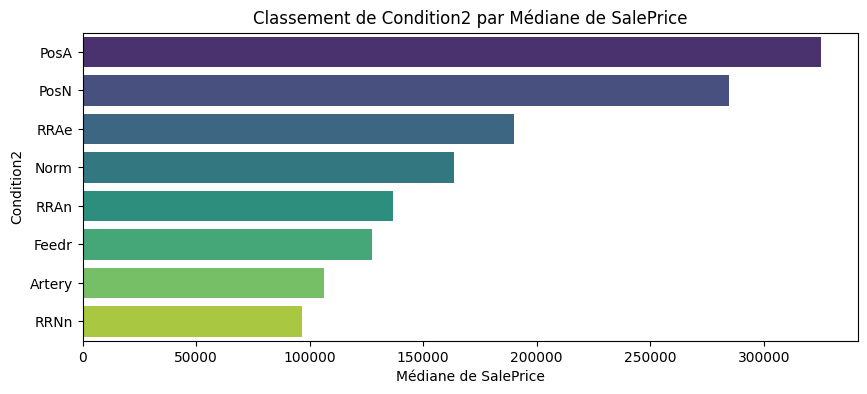


Variable: Street
  Kruskal-Wallis p-value: 0.0801
  ANOVA p-value: 0.1170
  Statistiques par catégorie:
  Street           mean    median           std  count
0   Grvl  130190.500000  114250.0  65446.253991      6
1   Pave  181130.538514  163000.0  79446.597317   1454


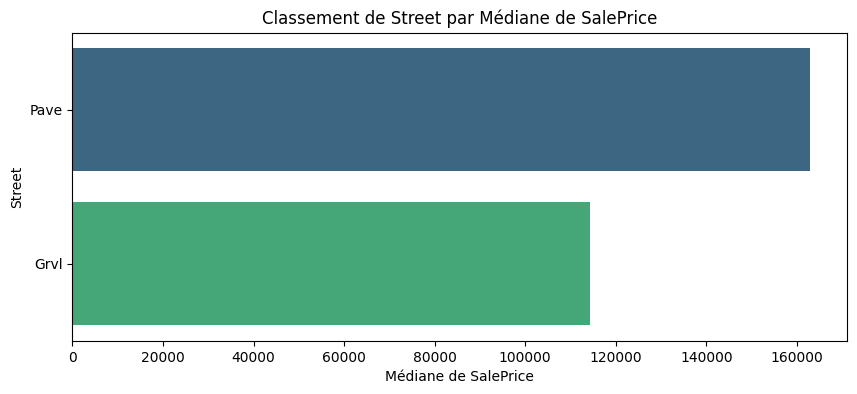


Variable: BsmtFinType2
  Kruskal-Wallis p-value: 0.1140
  ANOVA p-value: 0.0360
  Statistiques par catégorie:
  BsmtFinType2           mean    median            std  count
0          ALQ  209942.105263  174900.0  104764.743411     19
1          BLQ  151101.000000  143000.0   41611.305388     33
2          GLQ  180982.142857  203125.0   64573.040359     14
3          LwQ  164364.130435  154000.0   43255.035241     46
4          Rec  164917.129630  148750.0   59183.277020     54
5          Unf  182511.350850  165000.0   81345.222194   1294


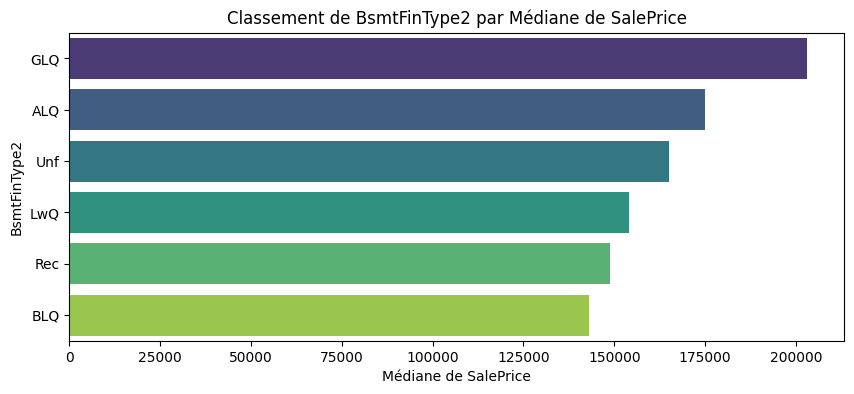


Variable: LandSlope
  Kruskal-Wallis p-value: 0.1395
  ANOVA p-value: 0.1414
  Statistiques par catégorie:
  LandSlope           mean    median           std  count
0       Gtl  179956.799566  161875.0  78669.369151   1382
1       Mod  196734.138462  186700.0  92375.358116     65
2       Sev  204379.230769  185000.0  86729.922409     13


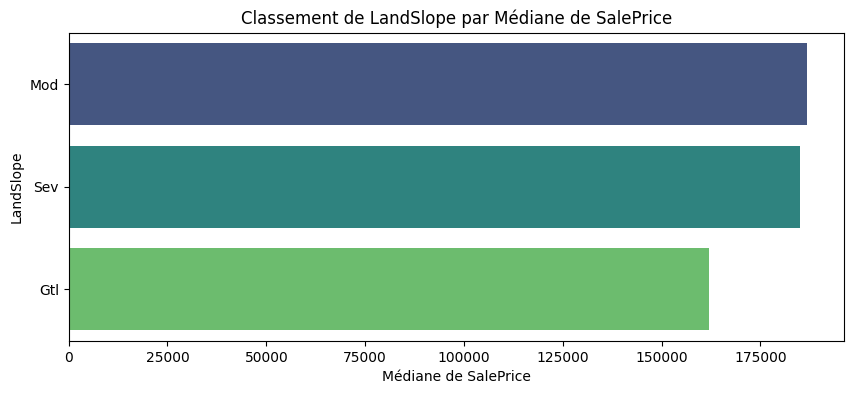


Variable: Utilities
  Kruskal-Wallis p-value: 1.0000
  ANOVA p-value: 1.0000
  Statistiques par catégorie:
  Utilities          mean    median           std  count
0    AllPub  180950.95682  163000.0  79461.599814   1459
1    NoSeWa  137500.00000  137500.0           NaN      1

--- Tableau récapitulatif des p-values des tests de liaison avec SalePrice ---
   Variable Qualitative  Kruskal-Wallis p-value  ANOVA p-value
0          Neighborhood           6.696799e-168  1.558600e-225
1             ExterQual           8.180798e-148  1.439551e-204
2           KitchenQual           4.720113e-143  3.032213e-192
3              BsmtQual           1.612542e-142  2.078120e-194
4          GarageFinish           1.950179e-126  5.993319e-111
5            Foundation           2.169096e-103   5.791895e-91
6             HeatingQC            1.452111e-76   5.041729e-68
7            GarageType            3.001070e-71   2.578443e-56
8          BsmtFinType1            5.735444e-64   3.598398e-66
9          

In [ ]:
# prompt: pour toutees les variables qualitatives analyse la liaison avec le sale price et fait le graphique de la plus liée à la moins lié. Je veux un boxplot, un tableau avec moyenne médiane etc par catégorie, les tests student wilcoxon, kruskall wallis anova quand c'est pertinent ajoute le classement sur un graphique par kruskall wallis croissant stp

import pandas as pd
import matplotlib.pyplot as plt
# Analyse bivariée pour les variables qualitatives et 'SalePrice'

# Liste pour stocker les résultats des tests et le classement
qual_sale_price_analysis = []

for col in qualitative_cols:
    print(f"\n--- Analyse de la liaison entre '{col}' et 'SalePrice' ---")

    # 1. Calcul des statistiques descriptives (moyenne, médiane) par catégorie
    stats_by_category = df.groupby(col)['SalePrice'].agg(['mean', 'median', 'std', 'count']).reset_index()
    print(f"\nStatistiques descriptives de 'SalePrice' par catégorie de '{col}':")
    print(stats_by_category)

    # 2. Boxplot
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=df, x=col, y='SalePrice', palette='viridis')
    plt.title(f'Boxplot of SalePrice by {col}')
    plt.xlabel(col)
    plt.ylabel('SalePrice')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    # 3. Tests statistiques
    categories = df[col].unique()
    groups = [df['SalePrice'][df[col] == cat] for cat in categories]

    # Check for groups with sufficient data (at least 2 values) for tests
    valid_groups = [group for group in groups if len(group) >= 2]

    if len(valid_groups) < 2:
        print(f"Pas assez de groupes ({len(valid_groups)} < 2) avec suffisamment de données pour effectuer des tests pour '{col}'.")
        kruskal_wallis_pvalue = 1.0 # Assign a high p-value indicating no significant difference
        anova_pvalue = 1.0
        wilcoxon_results = "N/A (Not enough groups)"
        student_results = "N/A (Not enough groups)"
        kruskal_ranking = "N/A"

    else:
        # Kruskal-Wallis Test (non-paramétrique, toujours pertinent pour comparer > 2 groupes)
        kruskal_wallis_stat, kruskal_wallis_pvalue = stats.kruskal(*valid_groups)
        print(f"\nKruskal-Wallis Test pour '{col}':")
        print(f"Statistic: {kruskal_wallis_stat:.4f}, p-value: {kruskal_wallis_pvalue:.4f}")
        if kruskal_wallis_pvalue < 0.05:
            print("Rejet de H0 : Il existe une différence significative entre les médianes de 'SalePrice' pour au moins une paire de catégories de '{col}'.")
        else:
            print("Échec du rejet de H0 : Pas de différence significative démontrée entre les médianes de 'SalePrice' pour les catégories de '{col}'.")

        # ANOVA Test (paramétrique, pertinent si les conditions sont remplies - normalité, égalité des variances)
        # Note: ANOVA est sensible aux violations de ses hypothèses, Kruskal-Wallis est plus robuste.
        # Pour un aperçu rapide, on peut l'exécuter, mais l'interprétation dépend des vérifications d'hypothèses.
        try:
            anova_stat, anova_pvalue = stats.f_oneway(*valid_groups)
            print(f"\nANOVA Test pour '{col}' (Sous réserve des hypothèses):")
            print(f"Statistic: {anova_stat:.4f}, p-value: {anova_pvalue:.4f}")
            if anova_pvalue < 0.05:
                print("Rejet de H0 : Il existe une différence significative entre les moyennes de 'SalePrice' pour au moins une paire de catégories de '{col}'.")
            else:
                print("Échec du rejet de H0 : Pas de différence significative démontrée entre les moyennes de 'SalePrice' pour les catégories de '{col}'.")
        except ValueError:
             print(f"\nANOVA Test pour '{col}': Impossible d'effectuer (peut-être un groupe vide ou avec un seul échantillon).")
             anova_pvalue = 1.0 # Assign a high p-value

        # Student's t-test and Wilcoxon rank-sum test (for pairwise comparisons - often done post-hoc if Kruskal or ANOVA is significant)
        # For a quick analysis here, we'll just note if there are only 2 groups, these tests could be directly applied.
        wilcoxon_results = "See post-hoc tests if global test is significant"
        student_results = "See post-hoc tests if global test is significant"
        if len(valid_groups) == 2:
             # Wilcoxon rank-sum test (non-paramétrique, pour 2 groupes indépendants)
            try:
                wilcoxon_stat, wilcoxon_pvalue = stats.ranksums(valid_groups[0], valid_groups[1])
                wilcoxon_results = f"Wilcoxon Test (2 groups): Statistic={wilcoxon_stat:.4f}, p-value={wilcoxon_pvalue:.4f}"
            except ValueError:
                 wilcoxon_results = "Wilcoxon Test (2 groups): Impossible d'effectuer (peut-être un groupe vide)."

            # Student's t-test (paramétrique, pour 2 groupes indépendants)
            # Assumes equal variance (can use equal_var=False for Welch's t-test)
            try:
                student_stat, student_pvalue = stats.ttest_ind(valid_groups[0], valid_groups[1], equal_var=False) # Using Welch's t-test (doesn't assume equal variance)
                student_results = f"Student's t-test (2 groups, Welch): Statistic={student_stat:.4f}, p-value={student_pvalue:.4f}"
            except ValueError:
                 student_results = "Student's t-test (2 groups): Impossible d'effectuer (peut-être un groupe vide)."

        print(f"\nPairwise Tests (if only 2 groups):")
        print(wilcoxon_results)
        print(student_results)

        # 4. Classement basé sur la médiane (ou moyenne) et Kruskal-Wallis
        # Calculate median of SalePrice for each category for ranking
        median_ranking = stats_by_category.sort_values(by='median', ascending=True)
        kruskal_ranking = median_ranking[col].tolist() # Get the ordered list of categories

    # Store results
    qual_sale_price_analysis.append({
        'Variable Qualitative': col,
        'Kruskal-Wallis p-value': kruskal_wallis_pvalue,
        'ANOVA p-value': anova_pvalue,
        'Stats by Category': stats_by_category,
        'Kruskal Ranking (by Median)': kruskal_ranking
    })

# Sort qualitative variables by the strength of their association (inverse of Kruskal-Wallis p-value)
# A lower p-value indicates a stronger association
sorted_qual_analysis = sorted(qual_sale_price_analysis, key=lambda x: x['Kruskal-Wallis p-value'])

print("\n--- Récapitulatif des liaisons qualitatives avec SalePrice (classées par Kruskal-Wallis p-value croissante) ---")

# Iterate through sorted variables and display results
for analysis in sorted_qual_analysis:
    col = analysis['Variable Qualitative']
    kruskal_pvalue = analysis['Kruskal-Wallis p-value']
    anova_pvalue = analysis['ANOVA p-value']
    stats_by_category = analysis['Stats by Category']
    kruskal_ranking = analysis['Kruskal Ranking (by Median)']

    print(f"\nVariable: {col}")
    print(f"  Kruskal-Wallis p-value: {kruskal_pvalue:.4f}")
    print(f"  ANOVA p-value: {anova_pvalue:.4f}")
    print("  Statistiques par catégorie:")
    print(stats_by_category.to_string()) # Use to_string to ensure full table is printed


    # Afficher le classement sur un graphique par kruskall wallis (basé sur la médiane)
    if kruskal_ranking != "N/A":
        plt.figure(figsize=(10, 4))
        sns.barplot(x='median', y=col, data=stats_by_category.sort_values(by='median', ascending=False), palette='viridis')
        plt.title(f'Classement de {col} par Médiane de SalePrice')
        plt.xlabel('Médiane de SalePrice')
        plt.ylabel(col)
        plt.show()

# Optional: Create a summary table of p-values for easier comparison
p_value_summary = pd.DataFrame({
    'Variable Qualitative': [item['Variable Qualitative'] for item in sorted_qual_analysis],
    'Kruskal-Wallis p-value': [item['Kruskal-Wallis p-value'] for item in sorted_qual_analysis],
    'ANOVA p-value': [item['ANOVA p-value'] for item in sorted_qual_analysis]
})
print("\n--- Tableau récapitulatif des p-values des tests de liaison avec SalePrice ---")
print(p_value_summary.to_string()) # Use to_string to ensure full table is printed


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
Analyse de liaison entre 'Functional' et 'BsmtFinType1':

Table de contingence:
BsmtFinType1  ALQ  BLQ  GLQ  LwQ  Rec  Unf
Functional                                
Maj1            2    2    0    1    4    5
Maj2            1    0    0    0    0    4
Min1            6    6    2    6    5    6
Min2            6    5    1    3    5   14
Mod             4    1    0    3    0    7
Sev             0    0    0    1    0    0
Typ           201  134  415   60  119  431

Test du Chi-carré entre 'Functional' et 'BsmtFinType1':
Chi2 Statistic: 89.0671, p-value: 0.0000, Degrees of Freedom: 30
Rejet de H0 : Il existe une association significative entre les deux variables (au seuil de 5%).
V de Cramer: 0.1105
T de Tschuprow: 0.1055

Analyse de liaison entre 'Functional' et 'BsmtFinType2':

Table de contingence:
BsmtFinType2  ALQ  BLQ  GLQ  LwQ  Rec   Unf
Functional                                 
Maj1            0    2  

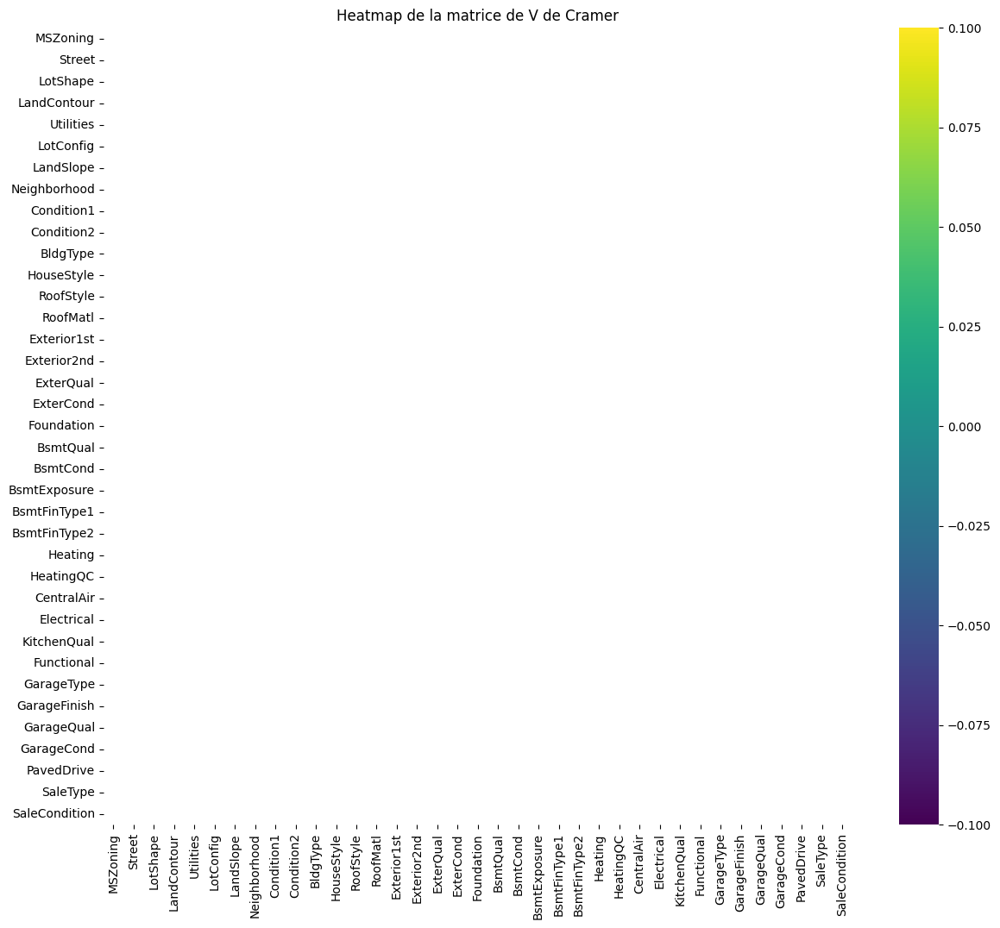


--- Matrice de V de Cramer ---
              MSZoning Street LotShape LandContour Utilities LotConfig  \
MSZoning           NaN    NaN      NaN         NaN       NaN       NaN   
Street             NaN    NaN      NaN         NaN       NaN       NaN   
LotShape           NaN    NaN      NaN         NaN       NaN       NaN   
LandContour        NaN    NaN      NaN         NaN       NaN       NaN   
Utilities          NaN    NaN      NaN         NaN       NaN       NaN   
LotConfig          NaN    NaN      NaN         NaN       NaN       NaN   
LandSlope          NaN    NaN      NaN         NaN       NaN       NaN   
Neighborhood       NaN    NaN      NaN         NaN       NaN       NaN   
Condition1         NaN    NaN      NaN         NaN       NaN       NaN   
Condition2         NaN    NaN      NaN         NaN       NaN       NaN   
BldgType           NaN    NaN      NaN         NaN       NaN       NaN   
HouseStyle         NaN    NaN      NaN         NaN       NaN       NaN   
RoofSt

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
MSZoning,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Street,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LotShape,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LandContour,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Utilities,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LotConfig,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LandSlope,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Neighborhood,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Condition1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Condition2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# prompt: pour toutes les variables qualitatives je veux barplot, chi deux v de cramer tchuprow met le v de cramer sous forme de heatmap de corrélation

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import chi2_contingency
import math

# Calculate Cramer's V
def cramers_v(x, y):
    """ Calculate Cramer's V for two categorical variables."""
    confusion_matrix = pd.crosstab(x, y)
    chi2, _, _, _ = chi2_contingency(confusion_matrix)
    n = confusion_matrix.sum().sum()
    min_dim = min(confusion_matrix.shape)
    # Handle cases where min_dim is 1 or chi2 is 0 to avoid division by zero or NaN
    if min_dim == 1 or chi2 == 0:
        return 0
    return np.sqrt(chi2 / (n * (min_dim - 1)))

# Calculate Tschuprow's T
def tschurows_t(x, y):
    """ Calculate Tschuprow's T for two categorical variables."""
    confusion_matrix = pd.crosstab(x, y)
    chi2, _, _, _ = chi2_contingency(confusion_matrix)
    n = confusion_matrix.sum().sum()
    rows, cols = confusion_matrix.shape
    # Handle cases where rows or cols is 1 or chi2 is 0
    if rows == 1 or cols == 1 or chi2 == 0:
        return 0
    return np.sqrt(chi2 / (n * np.sqrt((rows - 1) * (cols - 1))))

# Perform analysis for all pairs of qualitative variables
print("\n--- Analyse de liaison entre toutes les paires de variables qualitatives ---")

# Initialize matrices to store Cramer's V and Tschuprow's T values
cramers_v_matrix = pd.DataFrame(index=qualitative_cols, columns=qualitative_cols)
tschuprows_t_matrix = pd.DataFrame(index=qualitative_cols, columns=qualitative_cols)

for col1 in qualitative_cols:
    for col2 in qualitative_cols:
        if col1 == col2:
            cramers_v_matrix.loc[col1, col2] = 1.0 # A variable is perfectly associated with itself
            tschuprows_t_matrix.loc[col1, col2] = 1.0
            continue

        print(f"\nAnalyse de liaison entre '{col1}' et '{col2}':")

        # Contingency Table (Chi-squared test)
        contingency_table = pd.crosstab(df[col1], df[col2])
        print("\nTable de contingence:")
        print(contingency_table)

        # Chi-squared Test
        try:
            chi2, p, dof, ex = chi2_contingency(contingency_table)
            print(f"\nTest du Chi-carré entre '{col1}' et '{col2}':")
            print(f"Chi2 Statistic: {chi2:.4f}, p-value: {p:.4f}, Degrees of Freedom: {dof}")

            if p < 0.05:
                print("Rejet de H0 : Il existe une association significative entre les deux variables (au seuil de 5%).")
            else:
                print("Échec du rejet de H0 : Aucune association significative démontrée entre les deux variables.")

            # Calculate and store Cramer's V
            v = cramers_v(df[col1], df[col2])
            cramers_v_matrix.loc[col1, col2] = v
            print(f"V de Cramer: {v:.4f}")

            # Calculate and store Tschuprow's T
            t = tschurows_t(df[col1], df[col2])
            tschuprows_t_matrix.loc[col1, col2] = t
            print(f"T de Tschuprow: {t:.4f}")

        except ValueError as e:
            print(f"Impossible de calculer le test du Chi-carré entre '{col1}' et '{col2}'. Erreur: {e}")
            cramers_v_matrix.loc[col1, col2] = np.nan
            tschuprows_t_matrix.loc[col1, col2] = np.nan

# Ensure matrices are symmetric
cramers_v_matrix = cramers_v_matrix.where(np.triu(np.ones(cramers_v_matrix.shape), k=0).astype(bool))
cramers_v_matrix = cramers_v_matrix + cramers_v_matrix.T.where(np.triu(np.ones(cramers_v_matrix.shape), k=1).astype(bool))

tschuprows_t_matrix = tschuprows_t_matrix.where(np.triu(np.ones(tschuprows_t_matrix.shape), k=0).astype(bool))
tschuprows_t_matrix = tschuprows_t_matrix + tschuprows_t_matrix.T.where(np.triu(np.ones(tschuprows_t_matrix.shape), k=1).astype(bool))


print("\n--- Heatmap de la matrice de V de Cramer pour les variables qualitatives ---")
plt.figure(figsize=(14, 12))
sns.heatmap(cramers_v_matrix.astype(float), annot=True, cmap='viridis', fmt=".2f", linewidths=.5)
plt.title("Heatmap de la matrice de V de Cramer")
plt.show()

print("\n--- Matrice de V de Cramer ---")
print(cramers_v_matrix)

print("\n--- Matrice de T de Tschuprow ---")
tschuprows_t_matrix


Etape 5: Modélisation

Random forest: car il y a une sélection intégrée

In [ ]:
# prompt: à partir de ma base de données divise en train test et met en place une forêt aléatoire ne fait pas de pipe line et ne va au prédiction fait uniquemnt le modèle

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Separate target variable
X = df.drop('SalePrice', axis=1)
y = df['SalePrice']

# Identify categorical and numerical features (after dropping columns)
numerical_features = X.select_dtypes(include=['int64', 'float64']).columns
categorical_features = X.select_dtypes(include=['object', 'category']).columns

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a column transformer to handle categorical features (One-Hot Encoding)
preprocessor = ColumnTransformer(
    transformers=[
        ('num', 'passthrough', numerical_features),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)])

# Create the Random Forest Regressor model
# Note: We are not creating a pipeline here as per the request,
# the preprocessor will be applied separately before training
# if you choose to do predictions later. For just creating the model instance,
# the preprocessor is not directly part of the model definition.
# However, the preprocessor is essential to prepare the data before feeding
# it to the model.

# Initialize the Random Forest Regressor model
# You can tune hyperparameters here (e.g., n_estimators, max_depth, random_state)
model = RandomForestRegressor(n_estimators=100, random_state=42)

print("\nRandom Forest Regressor model created:")
model

# At this point, the data is split, the preprocessor is defined,
# and the model instance is created.
# To use the model, you would typically first apply the preprocessor to X_train:
X_train_processed = preprocessor.fit_transform(X_train)
# Then train the model:
model.fit(X_train_processed, y_train)




Random Forest Regressor model created:


RandomForestRegressor(random_state=42)

# Etape 6 évaluer les perforces du modèles

In [ ]:
# prompt: réalise les prédiction sur train et test et donne les performances du modèles dans un tableau rmse, mse, mae, mape, r2 corrélation etc corrige l'erreur

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import math
import numpy as np
import pandas as pd

# Assuming X_test and y_test are already defined from the train_test_split
# Assuming preprocessor and model are already fitted

# Apply the same preprocessor to the test data
X_test_processed = preprocessor.transform(X_test)

# Make predictions on the training set
y_train_pred = model.predict(X_train_processed)

# Make predictions on the test set
y_test_pred = model.predict(X_test_processed)

# Calculate performance metrics for the training set
rmse_train = math.sqrt(mean_squared_error(y_train, y_train_pred))
mse_train = mean_squared_error(y_train, y_train_pred)
mae_train = mean_absolute_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)

# Calculate MAPE for training set, handling division by zero
mape_train = np.mean(np.abs((y_train - y_train_pred) / y_train)) * 100
mape_train = mape_train if not np.isinf(mape_train) else np.nan # Handle cases where y_train has 0

# Calculate correlation for training set
correlation_train = np.corrcoef(y_train, y_train_pred)[0, 1]


# Calculate performance metrics for the test set
rmse_test = math.sqrt(mean_squared_error(y_test, y_test_pred))
mse_test = mean_squared_error(y_test, y_test_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

# Calculate MAPE for test set, handling division by zero
mape_test = np.mean(np.abs((y_test - y_test_pred) / y_test)) * 100
mape_test = mape_test if not np.isinf(mape_test) else np.nan # Handle cases where y_test has 0

# Calculate correlation for test set
correlation_test = np.corrcoef(y_test, y_test_pred)[0, 1]


# Create a table (DataFrame) to display performance metrics
performance_metrics = pd.DataFrame({
    'Metric': ['RMSE', 'MSE', 'MAE', 'MAPE (%)', 'R2 Score', 'Correlation'],
    'Train Set': [rmse_train, mse_train, mae_train, mape_train, r2_train, correlation_train],
    'Test Set': [rmse_test, mse_test, mae_test, mape_test, r2_test, correlation_test]
})

print("\nPerformance Metrics of the Random Forest Regressor Model:")
print(performance_metrics.to_string(index=False)) # Use to_string to ensure full table is printed



Performance Metrics of the Random Forest Regressor Model:
     Metric    Train Set     Test Set
       RMSE 1.119280e+04 2.921729e+04
        MSE 1.252787e+08 8.536498e+08
        MAE 6.578233e+03 1.761433e+04
   MAPE (%) 3.856636e+00 1.072148e+01
   R2 Score 9.789961e-01 8.887075e-01
Correlation 9.908773e-01 9.494395e-01


In [ ]:
# And for testing/prediction:
X_test_processed = preprocessor.transform(X_test)
predictions = model.predict(X_test_processed)